In [30]:
import sys
sys.path.append('../..')  # Expose top level program access

import re
import time
import pickle
import logging
import torch
import numpy as np
import pandas as pd
import seaborn as sns
import pytorch_lightning as pl
import matplotlib.pyplot as plt
import matplotlib.patches as patches

from sklearn.covariance import EllipticEnvelope
from scipy.stats import gaussian_kde
from pathlib import Path
from utils import tools, callbacks, metrics, supported_preprocessing_transforms
from modules.cae_base_module import CAEBaseModule
from modules.aae_base_module import AAEBaseModule
from modules.vae_base_module import VAEBaseModule
from datasets import supported_datamodules
from models import supported_models
from functools import reduce

In [15]:
# Import configurations and paths to logged models
root = Path.cwd() / '..' / '..'
log_path = root / 'logs' / 'LunarAnalogueDataModule'
paths_to_archived_models_ss = list(Path(log_path).glob('**/archive_nre*'))
paths_to_archived_models_bing = list(Path(log_path).glob('**/archive_bing*'))

# filter the models that don't provide structured latent representations
for i, p in enumerate(paths_to_archived_models_ss.copy()):
    if not re.search('VAE|AAE', str(p)):
        paths_to_archived_models_ss.remove(p)
# filter the models that don't provide structured latent representations
for i, p in enumerate(paths_to_archived_models_bing.copy()):
    if not re.search('VAE|AAE', str(p)):
        paths_to_archived_models_bing.remove(p)

print('Found archived models:\n------')
print('\n'.join([f'{p.parent.name}/{p.name}' for p in (*paths_to_archived_models_ss, *paths_to_archived_models_bing)]))

Found archived models:
------
SimpleVAE/archive_nre1_2021-05-04
SimpleVAE/archive_nre2_2021-05-04
BaselineAAE/archive_nre1_2021-05-07
BaselineVAE/archive_bing1_2021-05-20
BaselineAAE/archive_bing1_2021-05-19


In [3]:
from experiments.helpers import load_modules

module_catalog_ss, datamodule_ss, _ = load_modules(paths_to_archived_models_ss)
module_catalog_bing, datamodule_bing, _ = load_modules(paths_to_archived_models_bing)

Loading state dict for: SimpleVAE/archive_nre1_2021-05-04
Loading state dict for: SimpleVAE/archive_nre2_2021-05-04
Loading state dict for: BaselineCAE/archive_nre1_2021-05-02
Loading state dict for: CompressionCAEHighCapacity/archive_nre1_2021-05-03
Loading state dict for: CompressionCAEMidCapacity/archive_nre1_2021-05-02
Loading state dict for: BaselineAAE/archive_nre1_2021-05-07
Loading state dict for: BaselineVAE/archive_bing1_2021-05-20
Loading state dict for: BaselineCAE/archive_bing1_2021-05-19
Loading state dict for: BaselineAAE/archive_bing1_2021-05-19


In [7]:
def rp_test_modules(datamodule, module_catalog):
    for batch_nb, batch in enumerate(datamodule.test_dataloader()):
        print(f'------\nLoaded batch {batch_nb}\n------')
                
        # Extract the model type (e.g. CAE, AAE, VAE) and their versions
        for model_type, model_versions in module_catalog.items():
            
            # Extract the name of the archive and the module's state dict
            for model_name, module in model_versions.items():
                
                # Set the model/components in evaluation mode
                if 'AAE' in model_type:
                    module.encoder.eval()
                    module.decoder.eval()
                else:
                    module.model.eval()
                
                short_name = model_type + '-' + model_name.split('_')[1]
                if short_name not in result_catalog:
                    result_catalog[short_name] = {
                        'latent_vecs': [],
                        'scores': [], 
                        'filepaths': [],
                        'gt_bboxes': [],
                        'cr_bboxes': []
                    }
                print(f'Testing on: {short_name}')

                result = module.test_step(batch, batch_nb)

                result_catalog[short_name]['latent_vecs'].extend(result['images']['batch_lt'].cpu().numpy())
                result_catalog[short_name]['scores'].extend(result['scores'])
                result_catalog[short_name]['filepaths'].extend(result['labels']['filepaths'])
                result_catalog[short_name]['gt_bboxes'].extend(result['labels']['gt_bboxes'])
                result_catalog[short_name]['cr_bboxes'].extend(result['labels']['cr_bboxes'])
    return result_catalog
    
# Testing loop
# Caution: this loop takes _minutes_ to run.
start = time.time()

# Collect scores and labels for all models in a catalog
result_catalog = {}

# Loop over the test dataloader, using the same batch for each model to save time
with torch.no_grad():
    result_catalog_ss = rp_test_modules(datamodule_ss, module_catalog_ss)
    result_catalog_bing = rp_test_modules(datamodule_bing, module_catalog_bing)
                
print(f'Testing took: {time.time() - start:.2f}')

------
Loaded batch 0
------
Testing on: SimpleVAE-nre1
Testing on: SimpleVAE-nre2
Testing on: BaselineCAE-nre1
Testing on: CompressionCAEHighCapacity-nre1
Testing on: CompressionCAEMidCapacity-nre1
Testing on: BaselineAAE-nre1
------
Loaded batch 1
------
Testing on: SimpleVAE-nre1
Testing on: SimpleVAE-nre2
Testing on: BaselineCAE-nre1
Testing on: CompressionCAEHighCapacity-nre1
Testing on: CompressionCAEMidCapacity-nre1
Testing on: BaselineAAE-nre1
------
Loaded batch 2
------
Testing on: SimpleVAE-nre1
Testing on: SimpleVAE-nre2
Testing on: BaselineCAE-nre1
Testing on: CompressionCAEHighCapacity-nre1
Testing on: CompressionCAEMidCapacity-nre1
Testing on: BaselineAAE-nre1
------
Loaded batch 3
------
Testing on: SimpleVAE-nre1
Testing on: SimpleVAE-nre2
Testing on: BaselineCAE-nre1
Testing on: CompressionCAEHighCapacity-nre1
Testing on: CompressionCAEMidCapacity-nre1
Testing on: BaselineAAE-nre1
------
Loaded batch 4
------
Testing on: SimpleVAE-nre1
Testing on: SimpleVAE-nre2
Testi

------
Loaded batch 19
------
Testing on: BaselineVAE-bing1
Testing on: BaselineCAE-bing1
Testing on: BaselineAAE-bing1
------
Loaded batch 20
------
Testing on: BaselineVAE-bing1
Testing on: BaselineCAE-bing1
Testing on: BaselineAAE-bing1
------
Loaded batch 21
------
Testing on: BaselineVAE-bing1
Testing on: BaselineCAE-bing1
Testing on: BaselineAAE-bing1
------
Loaded batch 22
------
Testing on: BaselineVAE-bing1
Testing on: BaselineCAE-bing1
Testing on: BaselineAAE-bing1
------
Loaded batch 23
------
Testing on: BaselineVAE-bing1
Testing on: BaselineCAE-bing1
Testing on: BaselineAAE-bing1
------
Loaded batch 24
------
Testing on: BaselineVAE-bing1
Testing on: BaselineCAE-bing1
Testing on: BaselineAAE-bing1
------
Loaded batch 25
------
Testing on: BaselineVAE-bing1
Testing on: BaselineCAE-bing1
Testing on: BaselineAAE-bing1
Testing took: 1637.40


In [21]:
# Merge the bing and ss results, but dataloaders are still seperate
result_catalog = {**result_catalog_ss, **result_catalog_bing}

# Temp fix for missing numpy, cpu casting
for sn, results in result_catalog.items():
    results['latent_vecs'] = [lt.cpu().numpy() for lt in results['latent_vecs']]

# Format data for plotting and analysis
for sn, results in result_catalog.items():
    if 'CAE' in sn:
        continue
    results['latent_vecs'] = np.array(results['latent_vecs'])
    results['scores'] = np.array(results['scores'])
    results['filepaths'] = np.array(results['filepaths']).reshape(-1)
    results['gt_bboxes'] = np.array(results['gt_bboxes']).reshape(-1, 4)
    results['cr_bboxes'] = np.array(results['cr_bboxes']).reshape(-1, 4)
    print(f'[{sn}]\t Predicted {results["scores"].shape} scores, '\
          f'with {results["gt_bboxes"].shape} gt boxes, and {results["cr_bboxes"].shape} rps')

with open('nre-results_2021-05-05.pkl', 'wb') as f:
    pickle.dump(result_catalog, f)

SimpleVAE-nre1
[SimpleVAE-nre1]	 Predicted (13312,) scores, with (13312, 4) gt boxes, and (13312, 4) rps
SimpleVAE-nre2
[SimpleVAE-nre2]	 Predicted (13312,) scores, with (13312, 4) gt boxes, and (13312, 4) rps
BaselineAAE-nre1
[BaselineAAE-nre1]	 Predicted (13312,) scores, with (13312, 4) gt boxes, and (13312, 4) rps
BaselineVAE-bing1
[BaselineVAE-bing1]	 Predicted (13312,) scores, with (13312, 4) gt boxes, and (13312, 4) rps
BaselineAAE-bing1
[BaselineAAE-bing1]	 Predicted (13312,) scores, with (13312, 4) gt boxes, and (13312, 4) rps


/home/brahste/anaconda3/envs/torch/lib/python3.8/site-packages/torch/storage.py:34: FutureWarning: pickle support for Storage will be removed in 1.5. Use `torch.save` instead
  warnings.warn("pickle support for Storage will be removed in 1.5. Use `torch.save` instead", FutureWarning)


In [27]:
%matplotlib inline
# Get the gt labels with IOU > thresh

# For now, just run the analysis on all of the models
lt_results = {}

for sn, res in result_catalog.items():
    if 'CAE' in sn:
        continue
    print(f'------\n{sn}\n------')
    
    ious = []
    # binary_labels = []  # IOU > 0.5 counts as a label
    n_duplicates = 0
    n_novelties = 428
    iou_thresh = 0.5

    gt_bboxes = res['gt_bboxes']
    cr_bboxes = res['cr_bboxes']
    for i, (gt, cr) in enumerate(zip(gt_bboxes, cr_bboxes)):
        cr = cr * 5  # Rescale the bounding boxes, see 'scale' parameter in LunarAnaloguePreprocesing
        iou = metrics.iou(cr, gt)
        ious.append(iou)

        if i == 0:
            prev_gt = [-1, -1, -1, -1]
        if iou > iou_thresh:
            if all(gt == prev_gt):
                n_duplicates += 1
            prev_gt = gt

    ious = np.array(ious)
    bin_labels = ious > iou_thresh
    
    print(f'N labels: {sum(bin_labels)}')
    print(f'N duplicates: {n_duplicates}')
    print(f'N novelties: {n_novelties}')
    print(f'Ratio of located novelies {(sum(bin_labels) - n_duplicates)/n_novelties:.5f}')
    print(f'Ratio of relevant regions {sum(bin_labels) / (n_novelties*16):.5f}')
    
    lt_results[sn] = {
        'latent_vecs': res['latent_vecs'],
        'ious': ious, 
        'labels': bin_labels, 
        'scores': res['scores'], 
        'n_duplicates': n_duplicates,
        'n_novelties': n_novelties
    }

2021-05-24 18:46:41,695 - DEBUG - Loaded backend module://ipykernel.pylab.backend_inline version unknown.


------
SimpleVAE-nre1
------
N labels: 163
N duplicates: 22
N novelties: 428
Ratio of located novelies 0.32944
Ratio of relevant regions 0.02380
------
SimpleVAE-nre2
------
N labels: 163
N duplicates: 22
N novelties: 428
Ratio of located novelies 0.32944
Ratio of relevant regions 0.02380
------
BaselineAAE-nre1
------
N labels: 163
N duplicates: 22
N novelties: 428
Ratio of located novelies 0.32944
Ratio of relevant regions 0.02380
------
BaselineVAE-bing1
------
N labels: 67
N duplicates: 7
N novelties: 428
Ratio of located novelies 0.14019
Ratio of relevant regions 0.00978
------
BaselineAAE-bing1
------
N labels: 67
N duplicates: 7
N novelties: 428
Ratio of located novelies 0.14019
Ratio of relevant regions 0.00978


2021-05-24 18:48:54,560 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:48:54,561 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:48:54,561 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:48:54,562 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:48:54,562 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:48:54,562 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:48:54,563 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:48:54,563 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:48:54,563 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:48:54,564 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 

2021-05-24 18:48:56,179 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:48:56,179 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/3ce07bc18b31318dfb8589ef3427ba04.dvi
2021-05-24 18:48:56,191 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:48:56,192 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:48:56,192 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:48:56,193 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:48:56,193 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:48:56,193 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:48:56,193 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:48:56,194 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', 

2021-05-24 18:48:56,228 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:48:56,228 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:48:56,229 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:48:56,229 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/6134acbfb19d192b077a5db8a0594e2a.dvi
2021-05-24 18:48:56,230 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:48:56,231 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:48:56,231 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:48:56,231 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:48:56,232 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:48:56,232 - DEBUG - Apple Chancery font is not compat

2021-05-24 18:48:56,289 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:48:56,289 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:48:56,289 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:48:56,290 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:48:56,290 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:48:56,291 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/68866aab584fc95b83a1baedea5abdb4.dvi
2021-05-24 18:48:56,292 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:48:56,292 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:48:56,293 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:48:56,293 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-

2021-05-24 18:48:56,332 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:48:56,333 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:48:56,333 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:48:56,334 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:48:56,334 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:48:56,334 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:48:56,335 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:48:56,335 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 18:48:56,336 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:48:56,336 - DEBUG - family: serif, font: Palatino, info

2021-05-24 18:48:56,386 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:48:56,386 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:48:56,386 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:48:56,387 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:48:56,388 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:48:56,389 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:48:56,390 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:48:56,391 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:48:56,391 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:48:56,392 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/c56347dc1b2b2ad24f964fc0646393ef.dv

2021-05-24 18:48:56,423 - DEBUG - findfont: score(<Font 'Bitstream Vera Sans' (VeraBI.ttf) oblique normal 700 normal>) = 11.335
2021-05-24 18:48:56,423 - DEBUG - findfont: score(<Font 'Norasi' (Norasi-BoldOblique.ttf) oblique normal 700 normal>) = 11.335
2021-05-24 18:48:56,423 - DEBUG - findfont: score(<Font 'Navilu' (Navilu.ttf) normal normal 400 normal>) = 10.05
2021-05-24 18:48:56,424 - DEBUG - findfont: score(<Font 'DejaVu Serif' (DejaVuSerifCondensed-Bold.ttf) normal normal 700 condensed>) = 10.535
2021-05-24 18:48:56,425 - DEBUG - findfont: score(<Font 'DejaVu Sans' (DejaVuSans-ExtraLight.ttf) normal normal 200 normal>) = 10.24
2021-05-24 18:48:56,425 - DEBUG - findfont: score(<Font 'Droid Sans Fallback' (DroidSansFallbackFull.ttf) normal normal 400 normal>) = 10.05
2021-05-24 18:48:56,425 - DEBUG - findfont: score(<Font 'Liberation Serif' (LiberationSerif-Regular.ttf) normal normal 400 normal>) = 10.05
2021-05-24 18:48:56,425 - DEBUG - findfont: score(<Font 'Padauk' (Padauk-Bol

2021-05-24 18:48:56,454 - DEBUG - findfont: score(<Font 'Norasi' (Norasi-Bold.ttf) normal normal 700 normal>) = 10.335
2021-05-24 18:48:56,454 - DEBUG - findfont: score(<Font 'DejaVu Sans Mono' (DejaVuSansMono-Bold.ttf) normal normal 700 normal>) = 10.335
2021-05-24 18:48:56,454 - DEBUG - findfont: score(<Font 'Tlwg Typist' (TlwgTypist.ttf) normal normal 500 normal>) = 10.145
2021-05-24 18:48:56,454 - DEBUG - findfont: score(<Font 'DejaVu Serif' (DejaVuSerifCondensed.ttf) normal normal 400 condensed>) = 10.25
2021-05-24 18:48:56,455 - DEBUG - findfont: score(<Font 'Vemana2000' (vemana2000.ttf) normal normal 400 normal>) = 10.05
2021-05-24 18:48:56,455 - DEBUG - findfont: score(<Font 'Lato' (Lato-Hairline.ttf) normal normal 100 normal>) = 10.335
2021-05-24 18:48:56,455 - DEBUG - findfont: score(<Font 'Lato' (Lato-Italic.ttf) italic normal 400 normal>) = 11.05
2021-05-24 18:48:56,456 - DEBUG - findfont: score(<Font 'Kalimati' (kalimati.ttf) normal normal 400 normal>) = 10.05
2021-05-24 1

2021-05-24 18:48:56,485 - DEBUG - findfont: score(<Font 'Liberation Sans Narrow' (LiberationSansNarrow-Italic.ttf) italic normal 400 condensed>) = 11.25
2021-05-24 18:48:56,485 - DEBUG - findfont: score(<Font 'Garuda' (Garuda-BoldOblique.ttf) oblique normal 700 normal>) = 11.335
2021-05-24 18:48:56,485 - DEBUG - findfont: score(<Font 'Liberation Sans' (LiberationSans-Bold.ttf) normal normal 700 normal>) = 10.335
2021-05-24 18:48:56,486 - DEBUG - findfont: score(<Font 'DejaVu Serif' (DejaVuSerif-BoldItalic.ttf) italic normal 700 normal>) = 11.335
2021-05-24 18:48:56,486 - DEBUG - findfont: score(<Font 'esint10' (esint10.ttf) normal normal 400 normal>) = 10.05
2021-05-24 18:48:56,486 - DEBUG - findfont: score(<Font 'DejaVu Sans' (DejaVuSans-Oblique.ttf) oblique normal 400 normal>) = 11.05
2021-05-24 18:48:56,487 - DEBUG - findfont: score(<Font 'eufm10' (eufm10.ttf) normal normal 400 normal>) = 10.05
2021-05-24 18:48:56,487 - DEBUG - findfont: score(<Font 'Garuda' (Garuda.ttf) normal norm

2021-05-24 18:48:56,517 - DEBUG - findfont: score(<Font 'Noto Serif CJK JP' (NotoSerifCJK-Bold.ttc) normal normal 700 normal>) = 10.335
2021-05-24 18:48:56,517 - DEBUG - findfont: score(<Font 'Mukti Narrow' (MuktiNarrowBold.ttf) normal normal 700 normal>) = 10.335
2021-05-24 18:48:56,518 - DEBUG - findfont: score(<Font 'stmary10' (stmary10.ttf) normal normal 400 normal>) = 10.05
2021-05-24 18:48:56,519 - DEBUG - findfont: score(<Font 'Noto Serif CJK JP' (NotoSerifCJK-Regular.ttc) normal normal 400 normal>) = 10.05
2021-05-24 18:48:56,520 - DEBUG - findfont: score(<Font 'Lato' (Lato-Bold.ttf) normal normal 700 normal>) = 10.335
2021-05-24 18:48:56,520 - DEBUG - findfont: score(<Font 'Ubuntu' (Ubuntu-RI.ttf) italic normal 400 normal>) = 11.05
2021-05-24 18:48:56,520 - DEBUG - findfont: score(<Font 'KacstPen' (KacstPen.ttf) normal normal 500 normal>) = 10.145
2021-05-24 18:48:56,520 - DEBUG - findfont: score(<Font 'DejaVu Sans Mono' (DejaVuSansMono.ttf) normal normal 400 normal>) = 10.05


2021-05-24 18:48:56,544 - DEBUG - findfont: score(<Font 'DejaVu Serif' (DejaVuSerif-BoldItalic.ttf) italic normal 700 normal>) = 11.335
2021-05-24 18:48:56,545 - DEBUG - findfont: score(<Font 'DejaVu Serif' (DejaVuSerif-Italic.ttf) italic normal 400 normal>) = 11.05
2021-05-24 18:48:56,545 - DEBUG - findfont: score(<Font 'STIXGeneral' (STIXGeneral.ttf) normal normal 400 normal>) = 10.05
2021-05-24 18:48:56,546 - DEBUG - findfont: score(<Font 'DejaVu Sans' (DejaVuSans-Oblique.ttf) oblique normal 400 normal>) = 1.05
2021-05-24 18:48:56,548 - DEBUG - findfont: score(<Font 'cmex10' (cmex10.ttf) normal normal 400 normal>) = 10.05
2021-05-24 18:48:56,549 - DEBUG - findfont: score(<Font 'DejaVu Serif' (DejaVuSerif-Bold.ttf) normal normal 700 normal>) = 10.335
2021-05-24 18:48:56,549 - DEBUG - findfont: score(<Font 'cmmi10' (cmmi10.ttf) normal normal 400 normal>) = 10.05
2021-05-24 18:48:56,549 - DEBUG - findfont: score(<Font 'DejaVu Sans Mono' (DejaVuSansMono.ttf) normal normal 400 normal>) =

2021-05-24 18:48:56,578 - DEBUG - findfont: score(<Font 'Purisa' (Purisa-BoldOblique.ttf) oblique normal 700 normal>) = 11.335
2021-05-24 18:48:56,579 - DEBUG - findfont: score(<Font 'DejaVu Sans Mono' (DejaVuSansMono-Bold.ttf) normal normal 700 normal>) = 10.335
2021-05-24 18:48:56,579 - DEBUG - findfont: score(<Font 'Liberation Sans Narrow' (LiberationSansNarrow-BoldItalic.ttf) italic normal 700 condensed>) = 11.535
2021-05-24 18:48:56,580 - DEBUG - findfont: score(<Font 'Ubuntu Mono' (UbuntuMono-R.ttf) normal normal 400 normal>) = 10.05
2021-05-24 18:48:56,580 - DEBUG - findfont: score(<Font 'Kalapi' (Kalapi.ttf) normal normal 400 normal>) = 10.05
2021-05-24 18:48:56,580 - DEBUG - findfont: score(<Font 'msam10' (msam10.ttf) normal normal 400 normal>) = 10.05
2021-05-24 18:48:56,581 - DEBUG - findfont: score(<Font 'Tlwg Typewriter' (TlwgTypewriter-BoldOblique.ttf) oblique normal 700 normal>) = 11.335
2021-05-24 18:48:56,581 - DEBUG - findfont: score(<Font 'Lato' (Lato-HairlineItalic.

2021-05-24 18:48:56,608 - DEBUG - findfont: score(<Font 'Loma' (Loma-Bold.ttf) normal normal 700 normal>) = 10.335
2021-05-24 18:48:56,609 - DEBUG - findfont: score(<Font 'DejaVu Serif' (DejaVuSerif-Bold.ttf) normal normal 700 normal>) = 10.335
2021-05-24 18:48:56,609 - DEBUG - findfont: score(<Font 'Laksaman' (Laksaman-BoldItalic.ttf) italic normal 700 normal>) = 11.335
2021-05-24 18:48:56,609 - DEBUG - findfont: score(<Font 'Liberation Serif' (LiberationSerif-Italic.ttf) italic normal 400 normal>) = 11.05
2021-05-24 18:48:56,609 - DEBUG - findfont: score(<Font 'LKLUG' (lklug.ttf) normal normal 400 normal>) = 10.05
2021-05-24 18:48:56,610 - DEBUG - findfont: score(<Font 'Karumbi' (Karumbi.ttf) normal normal 400 normal>) = 10.05
2021-05-24 18:48:56,610 - DEBUG - findfont: score(<Font 'Meera' (Meera.ttf) normal normal 400 normal>) = 10.05
2021-05-24 18:48:56,611 - DEBUG - findfont: score(<Font 'Liberation Mono' (LiberationMono-BoldItalic.ttf) italic normal 700 normal>) = 11.335
2021-05-

2021-05-24 18:48:56,641 - DEBUG - findfont: score(<Font 'Tlwg Typewriter' (TlwgTypewriter-Bold.ttf) normal normal 700 normal>) = 10.335
2021-05-24 18:48:56,641 - DEBUG - findfont: score(<Font 'FreeSerif' (FreeSerifBoldItalic.ttf) italic normal 700 normal>) = 11.335
2021-05-24 18:48:56,641 - DEBUG - findfont: score(<Font 'Tlwg Typo' (TlwgTypo-Oblique.ttf) oblique normal 500 normal>) = 11.145
2021-05-24 18:48:56,642 - DEBUG - findfont: score(<Font 'FreeSans' (FreeSansOblique.ttf) oblique normal 400 normal>) = 11.05
2021-05-24 18:48:56,642 - DEBUG - findfont: score(<Font 'Lato' (Lato-HeavyItalic.ttf) italic normal 800 normal>) = 11.43
2021-05-24 18:48:56,642 - DEBUG - findfont: score(<Font 'Manjari' (Manjari-Bold.otf) normal normal 700 normal>) = 10.335
2021-05-24 18:48:56,642 - DEBUG - findfont: score(<Font 'Laksaman' (Laksaman-Bold.ttf) normal normal 700 normal>) = 10.335
2021-05-24 18:48:56,643 - DEBUG - findfont: score(<Font 'FreeSerif' (FreeSerifItalic.ttf) italic normal 400 normal>)

2021-05-24 18:48:56,673 - DEBUG - findfont: score(<Font 'Lohit Devanagari' (Lohit-Devanagari.ttf) normal normal 400 normal>) = 10.05
2021-05-24 18:48:56,673 - DEBUG - findfont: score(<Font 'mry_KacstQurn' (mry_KacstQurn.ttf) normal normal 400 normal>) = 10.05
2021-05-24 18:48:56,673 - DEBUG - findfont: score(<Font 'KacstOffice' (KacstOffice.ttf) normal normal 500 normal>) = 10.145
2021-05-24 18:48:56,674 - DEBUG - findfont: score(<Font 'Bitstream Vera Serif' (VeraSe.ttf) normal normal 400 normal>) = 10.05
2021-05-24 18:48:56,674 - DEBUG - findfont: score(<Font 'Lato' (Lato-Medium.ttf) normal normal 500 normal>) = 10.145
2021-05-24 18:48:56,675 - DEBUG - findfont: score(<Font 'FreeMono' (FreeMono.ttf) normal normal 400 normal>) = 10.05
2021-05-24 18:48:56,675 - DEBUG - findfont: score(<Font 'DejaVu Sans' (DejaVuSans-BoldOblique.ttf) oblique normal 700 normal>) = 1.335
2021-05-24 18:48:56,676 - DEBUG - findfont: score(<Font 'KacstOne' (KacstOne-Bold.ttf) normal normal 700 normal>) = 10.3

2021-05-24 18:48:56,902 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/2bb940c02eb67f9574b7b2944be65c84.dvi
2021-05-24 18:48:56,903 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:48:56,903 - DEBUG - kpsewhich zplmr7m.tfm
2021-05-24 18:48:57,069 - DEBUG - stdout:
/usr/share/texlive/texmf-dist/fonts/tfm/public/mathpazo/zplmr7m.tfm

2021-05-24 18:48:57,070 - DEBUG - opening tfm file /usr/share/texlive/texmf-dist/fonts/tfm/public/mathpazo/zplmr7m.tfm
2021-05-24 18:48:57,070 - DEBUG - lh=18, bc=0, ec=127, nw=88, nh=16, nd=16
2021-05-24 18:48:57,071 - DEBUG - kpsewhich zplmr7m.vf
2021-05-24 18:48:57,226 - DEBUG - stdout:
/usr/share/texlive/texmf-dist/fonts/vf/public/mathpazo/zplmr7m.vf

2021-05-24 18:48:57,227 - DEBUG - Dvi: /usr/share/texlive/texmf-dist/fonts/vf/public/mathpazo/zplmr7m.vf
2021-05-24 18:48:57,227 - DEBUG - kpsewhich fplmri.tfm
2021-05-24 18:48:57,382 - DEBUG - stdout:
/usr/share/texlive/texmf-dist/fonts/tfm/public/mathpaz

2021-05-24 18:48:58,655 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:48:58,655 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:48:58,655 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:48:58,656 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:48:58,656 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:48:58,656 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:48:58,657 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:48:58,657 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:48:58,658 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:48:58,658 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/2f554728ce2be6dc9209a89cf3eb6c0d.dv

2021-05-24 18:48:59,346 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:48:59,346 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:48:59,347 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:48:59,347 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:48:59,347 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:48:59,348 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:48:59,348 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:48:59,349 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/3ce07bc18b31318dfb8589ef3427ba04.dvi
2021-05-24 18:48:59,349 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:48:59,351 - DEBUG - family: serif, font: Palatino, info

2021-05-24 18:48:59,392 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:48:59,392 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:48:59,393 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:48:59,393 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:48:59,393 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:48:59,394 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:48:59,394 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:48:59,395 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:48:59,395 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:48:59,395 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dv

2021-05-24 18:48:59,432 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:48:59,432 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:48:59,433 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:48:59,433 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:48:59,433 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:48:59,434 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:48:59,434 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:48:59,434 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:48:59,435 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:48:59,435 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:48:59,435 - DEBUG - fam

2021-05-24 18:48:59,479 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:48:59,480 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/a1989b0e82ab32b7b1a08bb5ee1fda2d.dvi
2021-05-24 18:48:59,484 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:48:59,485 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:48:59,486 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:48:59,486 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:48:59,487 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:48:59,487 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:48:59,487 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:48:59,488 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', 

2021-05-24 18:48:59,527 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:48:59,528 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:48:59,528 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:48:59,528 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/68866aab584fc95b83a1baedea5abdb4.dvi
2021-05-24 18:48:59,529 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:48:59,531 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:48:59,531 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:48:59,532 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:48:59,532 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:48:59,533 - DEBUG - Apple Chancery font is not compat

2021-05-24 18:48:59,585 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:48:59,586 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:48:59,586 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:48:59,586 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:48:59,587 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:48:59,587 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/6134acbfb19d192b077a5db8a0594e2a.dvi
2021-05-24 18:48:59,588 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:48:59,588 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:48:59,589 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:48:59,589 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-

2021-05-24 18:49:00,105 - DEBUG - Embedding Type-1 font b'pplri8r' from dvi.
2021-05-24 18:49:00,105 - DEBUG - Embedding TeX font b'pplri8r' - fontinfo={'dvifont': <DviFont: b'pplri8r'>, 'pdfname': <Name b'F4'>, 'fontfile': '/usr/share/texlive/texmf-dist/fonts/type1/urw/palatino/uplri8a.pfb', 'basefont': b'URWPalladioL-Ital', 'encodingfile': '/usr/share/texlive/texmf-dist/fonts/enc/dvips/base/8r.enc', 'effects': {}}
2021-05-24 18:49:00,125 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:00,125 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:49:00,126 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:49:00,126 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:49:00,127 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:49:00,127 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 1

2021-05-24 18:49:00,164 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:49:00,164 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:49:00,165 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:00,166 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:49:00,166 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 18:49:00,166 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:49:00,167 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:00,167 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:49:00,168 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:49:00,168 - DEBUG - family: sans-serif, font: Computer Modern Sans Se

2021-05-24 18:49:00,209 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:49:00,209 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:49:00,209 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:49:00,210 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:00,210 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:49:00,210 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:00,211 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:49:00,211 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:49:00,211 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:49:00,212 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 

2021-05-24 18:49:00,255 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:49:00,256 - DEBUG - STREAM b'IHDR' 16 13
2021-05-24 18:49:00,257 - DEBUG - STREAM b'PLTE' 41 48
2021-05-24 18:49:00,257 - DEBUG - STREAM b'tRNS' 101 15
2021-05-24 18:49:00,257 - DEBUG - STREAM b'pHYs' 128 9
2021-05-24 18:49:00,257 - DEBUG - STREAM b'IDAT' 149 60
2021-05-24 18:49:00,258 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:00,259 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:49:00,259 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:49:00,259 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:49:00,259 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:49:00,260 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:49:00,261 - DE

2021-05-24 18:49:00,298 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:00,298 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:49:00,298 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:00,298 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:49:00,299 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:49:00,299 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:49:00,299 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:49:00,299 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:49:00,300 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:49:00,300 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 

2021-05-24 18:49:00,358 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:49:00,358 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:00,359 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:49:00,359 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 18:49:00,360 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:49:00,360 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:00,361 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:49:00,361 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:49:00,362 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:49:00,362 - DEBUG - Apple Chancery font is not compat

2021-05-24 18:49:00,404 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:49:00,405 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:49:00,405 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:49:00,405 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:00,406 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:49:00,406 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/2e65e9b695a94456b83fb58e8b9d15a2.dvi
2021-05-24 18:49:00,406 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:49:00,408 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:00,408 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:49:00,408 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-

2021-05-24 18:49:00,450 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:49:00,450 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:49:00,451 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:49:00,451 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:49:00,452 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:49:00,453 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:00,453 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:49:00,453 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:00,454 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:49:00,454 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 

2021-05-24 18:49:00,489 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:49:00,489 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:49:00,489 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:00,489 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:49:00,490 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/68866aab584fc95b83a1baedea5abdb4.dvi
2021-05-24 18:49:00,491 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:49:00,493 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:00,493 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:49:00,494 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:49:00,494 - DEBUG - family: sans-serif, font: Computer Modern Sans Se

2021-05-24 18:49:00,529 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/2e65e9b695a94456b83fb58e8b9d15a2.dvi
2021-05-24 18:49:00,530 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:49:00,534 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:00,535 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:49:00,535 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:49:00,537 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:49:00,537 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:49:00,538 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:49:00,538 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:49:00,538 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:

2021-05-24 18:49:00,575 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:49:00,575 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:49:00,575 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:49:00,576 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:49:00,576 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:49:00,576 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:49:00,576 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:49:00,577 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:00,577 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:49:00,577 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/8f4292f9e067a55fc0b6fc029737cc33.dv

2021-05-24 18:49:00,620 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:49:00,621 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:49:00,621 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:49:00,621 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:49:00,622 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:49:00,622 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:49:00,622 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:49:00,622 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:00,623 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:49:00,623 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/2bb940c02eb67f9574b7b2944be65c84.dv

2021-05-24 18:49:01,226 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:49:01,227 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:01,228 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:49:01,228 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:49:01,228 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:49:01,228 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:49:01,229 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:49:01,229 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:49:01,229 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:49:01,230 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:01,230 - DEBUG - fam

2021-05-24 18:49:01,262 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:49:01,262 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 18:49:01,262 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:49:01,263 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:01,264 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:49:01,265 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:49:01,265 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:49:01,266 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:49:01,266 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:49:01,266 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', 

2021-05-24 18:49:01,310 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:49:01,311 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:49:01,311 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:49:01,311 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:49:01,311 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:49:01,312 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:49:01,312 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:49:01,312 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:01,312 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:49:01,313 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 

2021-05-24 18:49:01,357 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:49:01,357 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:49:01,357 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:01,358 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:49:01,358 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/23bf86614c5b9fe7dd956d1ac7d6a2ea.dvi
2021-05-24 18:49:01,358 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:49:01,361 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:01,361 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:49:01,361 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:49:01,362 - DEBUG - family: sans-serif, font: Computer Modern Sans Se

2021-05-24 18:49:01,403 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:49:01,404 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:49:01,404 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:49:01,404 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:49:01,404 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:01,405 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:49:01,406 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 18:49:01,406 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:49:01,407 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:01,407 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24

2021-05-24 18:49:01,444 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:49:01,445 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:49:01,445 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:49:01,445 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:49:01,446 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:49:01,446 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:49:01,449 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:01,449 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:49:01,450 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/a1989b0e82ab32b7b1a08bb5ee1fda2d.dvi
2021-05-24 18:49:01,451 - DEBUG - Dvi._xxx: encountered special: papersize=5203.

2021-05-24 18:49:01,490 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:49:01,491 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:49:01,491 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:49:01,491 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:49:01,492 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:49:01,492 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:49:01,493 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:01,493 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:49:01,493 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:01,494 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 

2021-05-24 18:49:01,538 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:49:01,538 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/a0ac8a6b3c6d73399d7c81ab1b857e23.dvi
2021-05-24 18:49:01,539 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:49:01,540 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:01,541 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:49:01,541 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:49:01,541 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:49:01,541 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:49:01,542 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:49:01,542 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', 

2021-05-24 18:49:01,577 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:49:01,579 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:49:01,582 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:49:01,583 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:49:01,583 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:49:01,583 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:01,584 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:49:01,584 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/8f4292f9e067a55fc0b6fc029737cc33.dvi
2021-05-24 18:49:01,585 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:49:01,587 - DEBUG - family: serif, font: Palatino, info

2021-05-24 18:49:01,746 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:49:01,747 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:49:01,747 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:49:01,747 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:49:01,748 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:49:01,748 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:01,748 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:49:01,749 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:01,750 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:49:01,750 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 

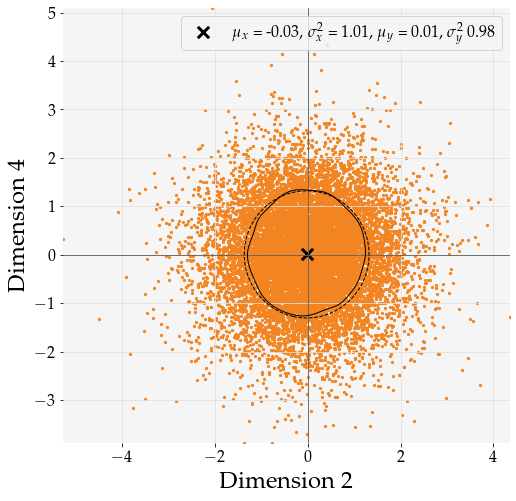

2021-05-24 18:49:01,804 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:01,805 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:49:01,805 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:49:01,806 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:49:01,806 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:49:01,806 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:49:01,807 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:49:01,807 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:49:01,807 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:01,807 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 

2021-05-24 18:49:02,088 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 18:49:02,089 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:49:02,090 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:02,090 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:49:02,090 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:49:02,091 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:49:02,091 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:49:02,091 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:49:02,091 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:49:02,092 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:

2021-05-24 18:49:02,132 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:02,133 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:49:02,133 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/98ad7ae73d7aa1b6937a42fda9087332.dvi
2021-05-24 18:49:02,134 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:49:02,139 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:02,139 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:49:02,140 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:49:02,140 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:49:02,140 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:49:02,140 - DEBUG - Textile font is not compatible with

2021-05-24 18:49:02,190 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:49:02,191 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:49:02,191 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:02,191 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:49:02,191 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 18:49:02,193 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:49:02,193 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:02,193 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:49:02,194 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:49:02,194 - DEBUG - family: sans-serif, font: Computer Modern Sans Se

2021-05-24 18:49:02,235 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:49:02,236 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:49:02,236 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:49:02,237 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:49:02,237 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:02,237 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:49:02,238 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/2e65e9b695a94456b83fb58e8b9d15a2.dvi
2021-05-24 18:49:02,239 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:49:02,240 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:02,240 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24

2021-05-24 18:49:02,292 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:49:02,292 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:49:02,293 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:49:02,295 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:49:02,296 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:49:02,296 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:49:02,297 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:02,298 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:49:02,298 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/6134acbfb19d192b077a5db8a0594e2a.dvi
2021-05-24 18:49:02,299 - DEBUG - Dvi._xxx: encountered special: papersize=5203.

2021-05-24 18:49:02,373 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:02,373 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:49:02,373 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:49:02,374 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:49:02,374 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:49:02,374 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:49:02,375 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:49:02,375 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:49:02,375 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:02,376 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 

2021-05-24 18:49:02,423 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/c1356a4845270bd5d2bf24b5eac23d1c.dvi
2021-05-24 18:49:02,424 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:49:02,425 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:02,426 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:49:02,426 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:49:02,427 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:49:02,427 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:49:02,427 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:49:02,428 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:49:02,428 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:

2021-05-24 18:49:02,488 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:02,491 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:49:02,491 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/6134acbfb19d192b077a5db8a0594e2a.dvi
2021-05-24 18:49:02,492 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:49:02,493 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:02,493 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:49:02,494 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:49:02,494 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:49:02,494 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:49:02,495 - DEBUG - Textile font is not compatible with

2021-05-24 18:49:02,593 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:49:02,594 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:49:02,599 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:02,599 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:49:02,600 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/2f554728ce2be6dc9209a89cf3eb6c0d.dvi
2021-05-24 18:49:02,601 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:49:02,601 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:02,602 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:49:02,602 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:49:02,603 - DEBUG - family: sans-serif, font: Computer Modern Sans Se

2021-05-24 18:49:02,651 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:49:02,652 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:49:02,653 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:49:02,653 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:49:02,653 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:49:02,654 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:49:02,654 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:02,654 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:49:02,654 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/2f554728ce2be6dc9209a89cf3eb6c0d.dvi
2021-05-24 18:49:02,656 - DEBUG - Dvi._xxx: encountered special: papersize=5203.

2021-05-24 18:49:02,714 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:02,716 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:49:02,716 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:49:02,718 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:49:02,718 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:49:02,719 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:49:02,719 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:49:02,721 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:49:02,722 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:02,722 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 

2021-05-24 18:49:02,766 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/2f554728ce2be6dc9209a89cf3eb6c0d.dvi
2021-05-24 18:49:02,766 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:49:02,767 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:02,768 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:49:02,768 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:49:02,769 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:49:02,769 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:49:02,771 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:49:02,772 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:49:02,772 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:

2021-05-24 18:49:02,825 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:02,825 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:49:02,828 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 18:49:02,829 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:49:02,830 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:02,830 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:49:02,831 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:49:02,835 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:49:02,836 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:49:02,837 - DEBUG - Textile font is not compatible with

2021-05-24 18:49:02,893 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:49:02,893 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:49:02,894 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:02,894 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:49:02,895 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/2f554728ce2be6dc9209a89cf3eb6c0d.dvi
2021-05-24 18:49:02,896 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:49:02,898 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:02,898 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:49:02,898 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:49:02,899 - DEBUG - family: sans-serif, font: Computer Modern Sans Se

2021-05-24 18:49:02,962 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:49:02,962 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:49:02,964 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:49:02,971 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:49:02,971 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:02,972 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:49:02,972 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/c56347dc1b2b2ad24f964fc0646393ef.dvi
2021-05-24 18:49:02,972 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:49:02,974 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the

2021-05-24 18:49:03,490 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:03,490 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:49:03,490 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:49:03,491 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:49:03,491 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:49:03,492 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:49:03,492 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:49:03,492 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:49:03,493 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:03,493 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 

2021-05-24 18:49:03,536 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:49:03,536 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:49:03,536 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:49:03,537 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:49:03,537 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:03,537 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:49:03,538 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/6134acbfb19d192b077a5db8a0594e2a.dvi
2021-05-24 18:49:03,538 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:49:03,539 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:03,539 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24

2021-05-24 18:49:03,584 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:49:03,585 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:03,587 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:49:03,588 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:03,588 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:49:03,589 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:49:03,589 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:49:03,590 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:49:03,590 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:49:03,591 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 

2021-05-24 18:49:03,794 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:49:03,794 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:49:03,795 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:49:03,795 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:49:03,795 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:49:03,795 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:03,796 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:49:03,796 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 18:49:03,796 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:49:03,799 - DEBUG - family: serif, font: Palatino, info

2021-05-24 18:49:03,835 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:49:03,835 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:49:03,836 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:49:03,836 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:49:03,836 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:49:03,837 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:49:03,837 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:49:03,838 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:03,838 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:49:03,839 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15b3384e3fc33f3e156b206d9c04dfb.dv

2021-05-24 18:49:03,878 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:49:03,879 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:49:03,879 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:49:03,879 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:49:03,880 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:49:03,880 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:49:03,881 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:49:03,881 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:03,882 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:49:03,882 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/104f0c66aaa256b37474b9ca7b53baca.dv

2021-05-24 18:49:03,923 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:49:03,924 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:49:03,924 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:49:03,924 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:49:03,924 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:49:03,925 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:49:03,925 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:03,925 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:49:03,925 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:03,926 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 

2021-05-24 18:49:03,961 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:49:03,961 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:49:03,961 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:49:03,961 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:03,962 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:49:03,966 - DEBUG - STREAM b'IHDR' 16 13
2021-05-24 18:49:03,967 - DEBUG - STREAM b'PLTE' 41 48
2021-05-24 18:49:03,968 - DEBUG - STREAM b'tRNS' 101 15
2021-05-24 18:49:03,968 - DEBUG - STREAM b'pHYs' 128 9
2021-05-24 18:49:03,968 - DEBUG - STREAM b'IDAT' 149 192
2021-05-24 18:49:03,969 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:03,969 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:49:03,970 - DEBUG - Bi

2021-05-24 18:49:04,003 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:49:04,003 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:49:04,003 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:49:04,004 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:04,004 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:49:04,004 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/518b10511869b1ec3b42f6b31081b722.dvi
2021-05-24 18:49:04,005 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:49:04,008 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:04,009 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:49:04,009 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-

2021-05-24 18:49:04,128 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:49:04,129 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:49:04,129 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:49:04,130 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:49:04,130 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:04,131 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:49:04,131 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/129c56a1b99ba53bbcb35940a58e704b.dvi
2021-05-24 18:49:04,132 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:49:04,133 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:04,133 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24

2021-05-24 18:49:04,173 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:49:04,174 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:49:04,175 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:49:04,175 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:49:04,175 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:49:04,176 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:49:04,176 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:04,176 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:49:04,177 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 18:49:04,178 - DEBUG - Dvi._xxx: encountered special: papersize=5203.

2021-05-24 18:49:04,219 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:49:04,219 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:04,221 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:49:04,222 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/2f554728ce2be6dc9209a89cf3eb6c0d.dvi
2021-05-24 18:49:04,222 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:49:04,223 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:04,224 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:49:04,224 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:49:04,224 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:49:04,225 - DEBUG - Apple Chancery font is not compat

2021-05-24 18:49:04,267 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:49:04,268 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:04,269 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:49:04,269 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:49:04,270 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:49:04,270 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:49:04,270 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:49:04,270 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:49:04,271 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:49:04,271 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 

2021-05-24 18:49:04,317 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:49:04,317 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/68866aab584fc95b83a1baedea5abdb4.dvi
2021-05-24 18:49:04,318 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:49:04,319 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:04,319 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:49:04,320 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:49:04,320 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:49:04,321 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:49:04,321 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:49:04,321 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', 

2021-05-24 18:49:04,359 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:49:04,360 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:04,360 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:49:04,361 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 18:49:04,362 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:49:04,364 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:04,364 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:49:04,365 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:49:04,365 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:49:04,366 - DEBUG - Apple Chancery font is not compat

2021-05-24 18:49:04,411 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:49:04,412 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:04,412 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:49:04,412 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/08460d6eb1a42286cb5291bc6638723e.dvi
2021-05-24 18:49:04,413 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:49:04,415 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:04,415 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:49:04,416 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:49:04,417 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:49:04,417 - DEBUG - Apple Chancery font is not compat

2021-05-24 18:49:04,454 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:49:04,454 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:49:04,454 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:49:04,454 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:49:04,455 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:49:04,455 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:49:04,455 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:49:04,456 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:04,456 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:49:04,456 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/a0ac8a6b3c6d73399d7c81ab1b857e23.dv

2021-05-24 18:49:04,506 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:49:04,507 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:49:04,507 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:04,507 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:49:04,508 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:04,508 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:49:04,508 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:49:04,509 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:49:04,509 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:49:04,509 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 

2021-05-24 18:49:04,553 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:04,553 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:49:04,553 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/bb4e89d8577df089dae9a815c4b8b678.dvi
2021-05-24 18:49:04,554 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:49:04,555 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:04,556 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:49:04,556 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:49:04,557 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:49:04,557 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:49:04,557 - DEBUG - Textile font is not compatible with

2021-05-24 18:49:04,602 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:04,603 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:49:04,604 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 18:49:04,604 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:49:04,605 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:04,606 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:49:04,606 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:49:04,606 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:49:04,607 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:49:04,607 - DEBUG - Textile font is not compatible with

2021-05-24 18:49:04,662 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:49:04,662 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:49:04,663 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:04,664 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:49:04,664 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15b3384e3fc33f3e156b206d9c04dfb.dvi
2021-05-24 18:49:04,666 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:49:04,667 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:04,667 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:49:04,668 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:49:04,668 - DEBUG - family: sans-serif, font: Computer Modern Sans Se

2021-05-24 18:49:07,024 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:07,025 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:49:07,025 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 18:49:07,026 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:49:07,027 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:07,027 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:49:07,028 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:49:07,028 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:49:07,028 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:49:07,028 - DEBUG - Textile font is not compatible with

2021-05-24 18:49:07,064 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:49:07,064 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:49:07,064 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:07,065 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:49:07,066 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/2e65e9b695a94456b83fb58e8b9d15a2.dvi
2021-05-24 18:49:07,066 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:49:07,067 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:07,067 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:49:07,068 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:49:07,068 - DEBUG - family: sans-serif, font: Computer Modern Sans Se

2021-05-24 18:49:07,126 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:49:07,127 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:49:07,127 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:49:07,127 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:49:07,128 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:07,129 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:49:07,129 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 18:49:07,130 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:49:07,131 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:07,131 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24

2021-05-24 18:49:07,168 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:49:07,168 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:49:07,169 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:49:07,169 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:49:07,169 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:49:07,170 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:49:07,170 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:07,170 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:49:07,171 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/2f554728ce2be6dc9209a89cf3eb6c0d.dvi
2021-05-24 18:49:07,172 - DEBUG - Dvi._xxx: encountered special: papersize=5203.

2021-05-24 18:49:07,207 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:07,207 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:49:07,207 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:49:07,208 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:49:07,208 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:49:07,209 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:49:07,209 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:49:07,209 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:49:07,209 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:07,210 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 

2021-05-24 18:49:07,448 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/7f79ee39a294649357304eab3cfd0430.dvi
2021-05-24 18:49:07,449 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:49:07,947 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:07,948 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:49:07,948 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:49:07,949 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:49:07,949 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:49:07,950 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:49:07,950 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:49:07,950 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:

2021-05-24 18:49:07,983 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:07,983 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:49:07,984 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 18:49:07,987 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:49:07,988 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:07,988 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:49:07,989 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:49:07,990 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:49:07,991 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:49:07,991 - DEBUG - Textile font is not compatible with

2021-05-24 18:49:08,027 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:49:08,027 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:49:08,027 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:08,028 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:49:08,028 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/a1989b0e82ab32b7b1a08bb5ee1fda2d.dvi
2021-05-24 18:49:08,029 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:49:08,030 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:08,030 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:49:08,030 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:49:08,031 - DEBUG - family: sans-serif, font: Computer Modern Sans Se

2021-05-24 18:49:08,073 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:49:08,073 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:49:08,074 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:49:08,074 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:49:08,075 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:49:08,075 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:49:08,075 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:08,076 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:49:08,076 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/a0ac8a6b3c6d73399d7c81ab1b857e23.dvi
2021-05-24 18:49:08,077 - DEBUG - Dvi._xxx: encountered special: papersize=5203.

2021-05-24 18:49:08,126 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:08,126 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:49:08,126 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:49:08,127 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:49:08,127 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:49:08,127 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:49:08,127 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:49:08,128 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:49:08,128 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:08,129 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 

2021-05-24 18:49:08,168 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 18:49:08,168 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:49:08,169 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:08,170 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:49:08,170 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:49:08,170 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:49:08,171 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:49:08,171 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:49:08,171 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:49:08,173 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:

2021-05-24 18:49:08,208 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:08,209 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:49:08,209 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/a1989b0e82ab32b7b1a08bb5ee1fda2d.dvi
2021-05-24 18:49:08,210 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:49:08,211 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:08,211 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:49:08,212 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:49:08,212 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:49:08,212 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:49:08,213 - DEBUG - Textile font is not compatible with

2021-05-24 18:49:08,257 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:49:08,257 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:49:08,258 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:08,258 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:49:08,259 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/a0ac8a6b3c6d73399d7c81ab1b857e23.dvi
2021-05-24 18:49:08,259 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:49:08,261 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:08,262 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:49:08,262 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:49:08,262 - DEBUG - family: sans-serif, font: Computer Modern Sans Se

2021-05-24 18:49:08,310 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:49:08,310 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:49:08,311 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:49:08,311 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:49:08,311 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:08,311 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:49:08,312 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 18:49:08,312 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:49:08,313 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:08,314 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24

2021-05-24 18:49:08,513 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:49:08,513 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 18:49:08,514 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:49:08,515 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:08,515 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:49:08,515 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:49:08,517 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:49:08,517 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:49:08,517 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:49:08,517 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', 

2021-05-24 18:49:08,558 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:49:08,558 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:08,559 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:49:08,559 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/a0ac8a6b3c6d73399d7c81ab1b857e23.dvi
2021-05-24 18:49:08,560 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:49:08,561 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:08,561 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:49:08,561 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:49:08,562 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:49:08,562 - DEBUG - Apple Chancery font is not compat

2021-05-24 18:49:08,608 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:49:08,608 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:49:08,608 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:49:08,609 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:08,609 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:49:08,609 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:08,610 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:49:08,610 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:49:08,610 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:49:08,610 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 

2021-05-24 18:49:08,652 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:49:08,653 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:08,653 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:49:08,654 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:49:08,654 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:49:08,654 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:49:08,654 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:49:08,655 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:49:08,655 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:49:08,656 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:08,656 - DEBUG - fam

2021-05-24 18:49:08,697 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:49:08,697 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:49:08,697 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:08,697 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:49:08,698 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/98ad7ae73d7aa1b6937a42fda9087332.dvi
2021-05-24 18:49:08,699 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:49:08,701 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:08,701 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:49:08,702 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:49:08,702 - DEBUG - family: sans-serif, font: Computer Modern Sans Se

2021-05-24 18:49:08,757 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:49:08,757 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:49:08,757 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:08,758 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:49:08,758 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 18:49:08,759 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:49:08,759 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:08,760 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:49:08,760 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:49:08,760 - DEBUG - family: sans-serif, font: Computer Modern Sans Se

2021-05-24 18:49:08,799 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:49:08,800 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:49:08,800 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:49:08,800 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:49:08,800 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:08,801 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:49:08,801 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/a0ac8a6b3c6d73399d7c81ab1b857e23.dvi
2021-05-24 18:49:08,802 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:49:08,804 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:08,804 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24

2021-05-24 18:49:08,847 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:49:08,847 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:49:08,847 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:49:08,847 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:49:08,848 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:49:08,848 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:49:08,848 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:08,849 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:49:08,849 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:08,849 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 

2021-05-24 18:49:08,899 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:49:08,900 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/2f554728ce2be6dc9209a89cf3eb6c0d.dvi
2021-05-24 18:49:08,903 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:49:08,905 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:08,905 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:49:08,906 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:49:08,906 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:49:08,907 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:49:08,907 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:49:08,908 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', 

2021-05-24 18:49:08,945 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:49:08,945 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:49:08,945 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:49:08,945 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:49:08,946 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:49:08,946 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:08,946 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:49:08,947 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/98ad7ae73d7aa1b6937a42fda9087332.dvi
2021-05-24 18:49:08,948 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:49:08,951 - DEBUG - family: serif, font: Palatino, info

2021-05-24 18:49:09,112 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:49:09,113 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:49:09,114 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:49:09,116 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:49:09,116 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:49:09,116 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:09,117 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:49:09,117 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:09,118 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:49:09,118 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 

2021-05-24 18:49:09,604 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:49:09,605 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:49:09,605 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:49:09,606 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:49:09,606 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:49:09,607 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:49:09,607 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:49:09,607 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:09,607 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:49:09,608 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/3ce07bc18b31318dfb8589ef3427ba04.dv

2021-05-24 18:49:09,643 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:49:09,646 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:09,646 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:49:09,647 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:49:09,647 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:49:09,647 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:49:09,648 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:49:09,648 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:49:09,648 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:49:09,649 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:09,649 - DEBUG - fam

2021-05-24 18:49:09,686 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:49:09,686 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:09,686 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:49:09,687 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:49:09,688 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:49:09,690 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:49:09,692 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:49:09,693 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:49:09,693 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:49:09,693 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 

2021-05-24 18:49:09,728 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:49:09,729 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:49:09,729 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:49:09,730 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:49:09,730 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:49:09,731 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:09,731 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:49:09,732 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:09,732 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:49:09,733 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 

2021-05-24 18:49:09,770 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/98ad7ae73d7aa1b6937a42fda9087332.dvi
2021-05-24 18:49:09,772 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:49:09,775 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:09,775 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:49:09,776 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:49:09,776 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:49:09,777 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:49:09,777 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:49:09,777 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:49:09,778 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:

2021-05-24 18:49:09,819 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 18:49:09,820 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:49:09,820 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:09,821 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:49:09,821 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:49:09,822 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:49:09,822 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:49:09,823 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:49:09,824 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:49:09,824 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:

2021-05-24 18:49:09,864 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:09,864 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:49:09,865 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/a0ac8a6b3c6d73399d7c81ab1b857e23.dvi
2021-05-24 18:49:09,867 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:49:09,868 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:09,869 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:49:09,869 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:49:09,869 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:49:09,871 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:49:09,872 - DEBUG - Textile font is not compatible with

2021-05-24 18:49:09,913 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:49:09,913 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:49:09,913 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:09,914 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:49:09,914 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:09,915 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:49:09,915 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:49:09,915 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:49:09,916 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:49:09,916 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 

2021-05-24 18:49:09,954 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:09,955 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:49:09,955 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:49:09,955 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:49:09,956 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:49:09,957 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:49:09,960 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:49:09,960 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:49:09,961 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:09,963 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 

2021-05-24 18:49:10,001 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:49:10,001 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:10,002 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:49:10,002 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/98ad7ae73d7aa1b6937a42fda9087332.dvi
2021-05-24 18:49:10,003 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:49:10,005 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:10,006 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:49:10,006 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:49:10,007 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:49:10,007 - DEBUG - Apple Chancery font is not compat

2021-05-24 18:49:10,166 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:49:10,167 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:10,167 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:49:10,168 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:10,168 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:49:10,169 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:49:10,169 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:49:10,169 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:49:10,170 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:49:10,170 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 

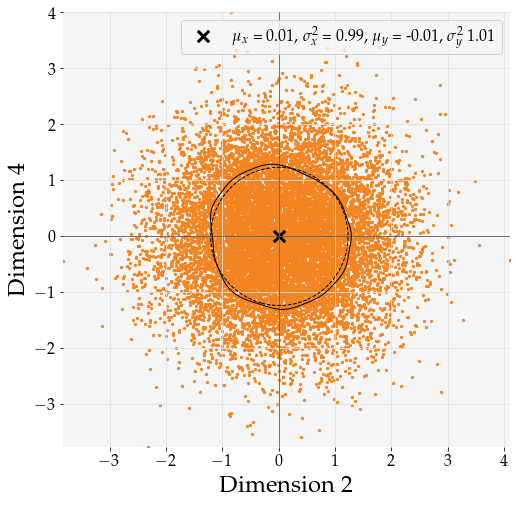

2021-05-24 18:49:10,226 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:10,227 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:49:10,227 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:49:10,227 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:49:10,227 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:49:10,228 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:49:10,228 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:49:10,228 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:49:10,229 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:10,229 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 

2021-05-24 18:49:10,314 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:49:10,314 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:10,314 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:49:10,315 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/68866aab584fc95b83a1baedea5abdb4.dvi
2021-05-24 18:49:10,315 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:49:10,316 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:10,317 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:49:10,318 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:49:10,318 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:49:10,319 - DEBUG - Apple Chancery font is not compat

2021-05-24 18:49:10,355 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:49:10,355 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:49:10,356 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:49:10,356 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:10,356 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:49:10,359 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 18:49:10,360 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:49:10,360 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:10,361 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:49:10,361 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-

2021-05-24 18:49:10,408 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:49:10,408 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:49:10,408 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:49:10,409 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:49:10,409 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:49:10,411 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:10,411 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:49:10,412 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/08460d6eb1a42286cb5291bc6638723e.dvi
2021-05-24 18:49:10,412 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:49:10,413 - DEBUG - family: serif, font: Palatino, info

2021-05-24 18:49:10,453 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:49:10,453 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:49:10,454 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:49:10,454 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:49:10,454 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:49:10,455 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:49:10,455 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:49:10,456 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:10,459 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:49:10,460 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dv

2021-05-24 18:49:10,496 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:49:10,497 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:10,498 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:49:10,498 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:49:10,499 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:49:10,500 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:49:10,500 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:49:10,500 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:49:10,501 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:49:10,501 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:10,501 - DEBUG - fam

2021-05-24 18:49:10,554 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:49:10,554 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/aab5cc4d22d25565e9490903bf3c04ba.dvi
2021-05-24 18:49:10,555 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:49:10,556 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:10,557 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:49:10,557 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:49:10,558 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:49:10,559 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:49:10,559 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:49:10,559 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', 

2021-05-24 18:49:11,295 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:49:11,295 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:11,295 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:49:11,295 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/2f554728ce2be6dc9209a89cf3eb6c0d.dvi
2021-05-24 18:49:11,296 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:49:11,297 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:11,297 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:49:11,299 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:49:11,299 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:49:11,299 - DEBUG - Apple Chancery font is not compat

2021-05-24 18:49:11,335 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:49:11,335 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:49:11,336 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:49:11,336 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:11,337 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:49:11,337 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 18:49:11,338 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:49:11,338 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:11,339 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:49:11,339 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-

2021-05-24 18:49:11,371 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/68866aab584fc95b83a1baedea5abdb4.dvi
2021-05-24 18:49:11,371 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:49:11,373 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:11,374 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:49:11,374 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:49:11,374 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:49:11,375 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:49:11,376 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:49:11,376 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:49:11,377 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:

2021-05-24 18:49:11,417 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:49:11,418 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:49:11,418 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:49:11,418 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:49:11,419 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:11,419 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:49:11,419 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/a1989b0e82ab32b7b1a08bb5ee1fda2d.dvi
2021-05-24 18:49:11,420 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:49:11,421 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:11,421 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24

2021-05-24 18:49:11,459 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:49:11,460 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:11,464 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:49:11,464 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 18:49:11,465 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:49:11,466 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:11,466 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:49:11,467 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:49:11,467 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:49:11,469 - DEBUG - Apple Chancery font is not compat

2021-05-24 18:49:11,505 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:49:11,505 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:49:11,506 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:49:11,506 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:11,507 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:49:11,507 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/2f554728ce2be6dc9209a89cf3eb6c0d.dvi
2021-05-24 18:49:11,508 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:49:11,509 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:11,509 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:49:11,510 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-

2021-05-24 18:49:11,548 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:49:11,548 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:49:11,548 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:49:11,549 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:49:11,549 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:49:11,550 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:11,550 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:49:11,550 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 18:49:11,551 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:49:11,552 - DEBUG - family: serif, font: Palatino, info

2021-05-24 18:49:11,587 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:49:11,588 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:11,588 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:49:11,589 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/68866aab584fc95b83a1baedea5abdb4.dvi
2021-05-24 18:49:11,589 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:49:11,590 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:11,591 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:49:11,591 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:49:11,591 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:49:11,592 - DEBUG - Apple Chancery font is not compat

2021-05-24 18:49:11,626 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:49:11,627 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:49:11,628 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:49:11,628 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:49:11,628 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:49:11,629 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:49:11,629 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:49:11,629 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:11,629 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:49:11,630 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/a1989b0e82ab32b7b1a08bb5ee1fda2d.dv

2021-05-24 18:49:11,668 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:49:11,668 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:49:11,669 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:49:11,669 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:49:11,669 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:11,670 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:49:11,670 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 18:49:11,671 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:49:11,672 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:11,672 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24

2021-05-24 18:49:11,712 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:49:11,712 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:49:11,713 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:49:11,713 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:49:11,714 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:11,714 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:49:11,714 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 18:49:11,715 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:49:11,716 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:11,716 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24

2021-05-24 18:49:11,754 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:49:11,755 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:49:11,756 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:49:11,757 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:49:11,757 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:49:11,757 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:49:11,758 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:11,758 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:49:11,758 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/491cca92ef7fc4f0496df6cd4270a1ae.dvi
2021-05-24 18:49:11,759 - DEBUG - Dvi._xxx: encountered special: papersize=5203.

2021-05-24 18:49:11,800 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:11,801 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:49:11,801 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:49:11,801 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:49:11,802 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:49:11,802 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:49:11,802 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:49:11,802 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:49:11,803 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:11,803 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 

2021-05-24 18:49:11,839 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:49:11,840 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:49:11,840 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:49:11,840 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:49:11,840 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:49:11,841 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:11,841 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:49:11,843 - DEBUG - STREAM b'IHDR' 16 13
2021-05-24 18:49:11,843 - DEBUG - STREAM b'PLTE' 41 48
2021-05-24 18:49:11,843 - DEBUG - STREAM b'tRNS' 101 15
2021-05-24 18:49:11,844 - DEBUG - STREAM b'pHYs' 128 9
2021-05-24 18:49:11,845 - DEBUG - STREAM b'IDAT' 149 133
2021-05-24

2021-05-24 18:49:11,884 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:49:11,884 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:49:11,885 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:49:11,885 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:49:11,885 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:49:11,885 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:11,886 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:49:11,886 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/491cca92ef7fc4f0496df6cd4270a1ae.dvi
2021-05-24 18:49:11,887 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:49:11,888 - DEBUG - family: serif, font: Palatino, info

2021-05-24 18:49:11,924 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:49:11,925 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:49:11,925 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:49:11,925 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:49:11,925 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:11,926 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:49:11,926 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:11,927 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:49:11,927 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:49:11,928 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 

2021-05-24 18:49:12,041 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:49:12,041 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:49:12,042 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:12,043 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:49:12,043 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 18:49:12,044 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:49:12,045 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:12,045 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:49:12,046 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:49:12,046 - DEBUG - family: sans-serif, font: Computer Modern Sans Se

2021-05-24 18:49:12,088 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:49:12,088 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:49:12,088 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:49:12,089 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:49:12,089 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:12,090 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:49:12,090 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/2f554728ce2be6dc9209a89cf3eb6c0d.dvi
2021-05-24 18:49:12,091 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:49:12,092 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:12,092 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24

2021-05-24 18:49:12,131 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:49:12,132 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:49:12,132 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:49:12,132 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:49:12,132 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:49:12,133 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:49:12,133 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:12,134 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:49:12,134 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 18:49:12,135 - DEBUG - Dvi._xxx: encountered special: papersize=5203.

2021-05-24 18:49:14,819 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:49:14,819 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/08460d6eb1a42286cb5291bc6638723e.dvi
2021-05-24 18:49:14,820 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:49:14,821 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:14,822 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:49:14,822 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:49:14,822 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:49:14,822 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:49:14,823 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:49:14,823 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', 

2021-05-24 18:49:14,858 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:49:14,858 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:14,859 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:49:14,860 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 18:49:14,860 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:49:14,861 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:14,861 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:49:14,861 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:49:14,861 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:49:14,862 - DEBUG - Apple Chancery font is not compat

2021-05-24 18:49:14,896 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:49:14,897 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:49:14,897 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:49:14,898 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:14,898 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:49:14,899 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/98ad7ae73d7aa1b6937a42fda9087332.dvi
2021-05-24 18:49:14,900 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:49:14,905 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:14,906 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:49:14,907 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-

2021-05-24 18:49:14,954 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:49:14,954 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:49:14,954 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:49:14,955 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:49:14,955 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:49:14,956 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:14,957 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:49:14,960 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 18:49:14,960 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:49:14,961 - DEBUG - family: serif, font: Palatino, info

2021-05-24 18:49:14,995 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:49:14,996 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:49:14,996 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:49:14,996 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:49:14,996 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:49:14,997 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:49:14,997 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:49:14,999 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:14,999 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:49:15,000 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/a0ac8a6b3c6d73399d7c81ab1b857e23.dv

2021-05-24 18:49:15,038 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:49:15,040 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:15,041 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:49:15,041 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:49:15,042 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:49:15,042 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:49:15,042 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:49:15,043 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:49:15,043 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:49:15,043 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:15,044 - DEBUG - fam

2021-05-24 18:49:15,745 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/129c56a1b99ba53bbcb35940a58e704b.dvi
2021-05-24 18:49:15,745 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:49:15,746 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:15,747 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:49:15,747 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:49:15,748 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:49:15,748 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:49:15,749 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:49:15,749 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:49:15,750 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:

2021-05-24 18:49:15,780 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:15,780 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:49:15,781 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 18:49:15,782 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:49:15,783 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:15,783 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:49:15,783 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:49:15,784 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:49:15,784 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:49:15,785 - DEBUG - Textile font is not compatible with

2021-05-24 18:49:15,821 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:49:15,821 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:49:15,822 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:15,822 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:49:15,822 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/a1989b0e82ab32b7b1a08bb5ee1fda2d.dvi
2021-05-24 18:49:15,825 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:49:15,826 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:15,826 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:49:15,827 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:49:15,828 - DEBUG - family: sans-serif, font: Computer Modern Sans Se

2021-05-24 18:49:15,866 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:49:15,866 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:49:15,867 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:49:15,867 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:49:15,867 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:49:15,868 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:49:15,868 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:15,868 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:49:15,868 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/2f554728ce2be6dc9209a89cf3eb6c0d.dvi
2021-05-24 18:49:15,869 - DEBUG - Dvi._xxx: encountered special: papersize=5203.

2021-05-24 18:49:15,915 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:15,915 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:49:15,915 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:49:15,916 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:49:15,916 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:49:15,917 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:49:15,917 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:49:15,917 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:49:15,918 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:15,918 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 

2021-05-24 18:49:15,956 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/3ce07bc18b31318dfb8589ef3427ba04.dvi
2021-05-24 18:49:15,957 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:49:15,958 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:15,958 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:49:15,958 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:49:15,959 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:49:15,959 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:49:15,960 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:49:15,960 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:49:15,960 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:

2021-05-24 18:49:16,001 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:16,001 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:49:16,002 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 18:49:16,003 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:49:16,003 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:16,004 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:49:16,004 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:49:16,004 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:49:16,005 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:49:16,005 - DEBUG - Textile font is not compatible with

2021-05-24 18:49:16,049 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:49:16,050 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:49:16,050 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:16,050 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:49:16,051 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/68866aab584fc95b83a1baedea5abdb4.dvi
2021-05-24 18:49:16,051 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:49:16,054 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:16,054 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:49:16,055 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:49:16,055 - DEBUG - family: sans-serif, font: Computer Modern Sans Se

2021-05-24 18:49:16,100 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:49:16,101 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:49:16,101 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:49:16,102 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:49:16,102 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:16,102 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:49:16,103 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/c56347dc1b2b2ad24f964fc0646393ef.dvi
2021-05-24 18:49:16,104 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:49:16,107 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:16,107 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24

2021-05-24 18:49:16,297 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:49:16,298 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/129c56a1b99ba53bbcb35940a58e704b.dvi
2021-05-24 18:49:16,299 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:49:16,300 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:16,301 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:49:16,301 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:49:16,302 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:49:16,302 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:49:16,302 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:49:16,303 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', 

2021-05-24 18:49:16,343 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:49:16,343 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:16,344 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:49:16,344 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 18:49:16,346 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:49:16,346 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:16,347 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:49:16,347 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:49:16,348 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:49:16,348 - DEBUG - Apple Chancery font is not compat

2021-05-24 18:49:16,385 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:49:16,385 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:49:16,386 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:49:16,387 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:16,387 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:49:16,387 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/a1989b0e82ab32b7b1a08bb5ee1fda2d.dvi
2021-05-24 18:49:16,388 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:49:16,390 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:16,391 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:49:16,391 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-

2021-05-24 18:49:16,427 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:49:16,427 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:16,428 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:49:16,428 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:16,429 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:49:16,429 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:49:16,430 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:49:16,430 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:49:16,430 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:49:16,430 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 

2021-05-24 18:49:16,471 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:49:16,472 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:49:16,472 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:49:16,472 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:49:16,473 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:49:16,473 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:49:16,474 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:49:16,474 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:16,475 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:49:16,475 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 

2021-05-24 18:49:16,517 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:49:16,518 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:49:16,518 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:16,519 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:49:16,519 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/23bf86614c5b9fe7dd956d1ac7d6a2ea.dvi
2021-05-24 18:49:16,519 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:49:16,521 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:16,521 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:49:16,522 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:49:16,522 - DEBUG - family: sans-serif, font: Computer Modern Sans Se

2021-05-24 18:49:16,566 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:49:16,568 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:49:16,568 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:16,569 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:49:16,569 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 18:49:16,570 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:49:16,571 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:16,571 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:49:16,572 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:49:16,572 - DEBUG - family: sans-serif, font: Computer Modern Sans Se

2021-05-24 18:49:16,613 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:49:16,614 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:49:16,615 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:49:16,615 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:49:16,616 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:16,616 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:49:16,617 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/a0ac8a6b3c6d73399d7c81ab1b857e23.dvi
2021-05-24 18:49:16,618 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:49:16,619 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:16,620 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24

2021-05-24 18:49:16,657 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:49:16,659 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:49:16,660 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:49:16,661 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:49:16,662 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:16,662 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:49:16,663 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:16,663 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:49:16,664 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:49:16,664 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 

2021-05-24 18:49:16,702 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:49:16,703 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:16,704 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:49:16,704 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:49:16,705 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:49:16,705 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:49:16,708 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:49:16,708 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:49:16,708 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:49:16,709 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:16,709 - DEBUG - fam

2021-05-24 18:49:16,749 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:49:16,749 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:49:16,750 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:49:16,752 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:49:16,752 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:16,753 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:49:16,753 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/c56347dc1b2b2ad24f964fc0646393ef.dvi
2021-05-24 18:49:16,754 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:49:16,755 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:16,755 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24

2021-05-24 18:49:16,920 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:49:16,921 - DEBUG - dvipng -bg Transparent -D 72.0 -T tight -o /home/brahste/.cache/matplotlib/tex.cache/029978a8e13d0eb43359005d9c81f456.png /home/brahste/.cache/matplotlib/tex.cache/55d1d2115fb30907d22e6e891e36f61c.dvi
2021-05-24 18:49:17,093 - DEBUG - b'This is dvipng 1.15 Copyright 2002-2015 Jan-Ake Larsson\n[1] \n'
2021-05-24 18:49:17,094 - DEBUG - STREAM b'IHDR' 16 13
2021-05-24 18:49:17,095 - DEBUG - STREAM b'PLTE' 41 48
2021-05-24 18:49:17,095 - DEBUG - STREAM b'tRNS' 101 15
2021-05-24 18:49:17,096 - DEBUG - STREAM b'pHYs' 128 9
2021-05-24 18:49:17,096 - DEBUG - STREAM b'IDAT' 149 919
2021-05-24 18:49:17,097 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:17,098 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:49:17,098 - DEBUG - Bitstream Vera Sans font is not compat

2021-05-24 18:49:17,431 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:49:17,431 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:49:17,432 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:49:17,432 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:49:17,432 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:49:17,433 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:17,433 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:49:17,433 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/3ce07bc18b31318dfb8589ef3427ba04.dvi
2021-05-24 18:49:17,435 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:49:17,435 - DEBUG - family: serif, font: Palatino, info

2021-05-24 18:49:17,468 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:49:17,468 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:49:17,469 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:49:17,469 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:49:17,469 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:49:17,470 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:49:17,470 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:49:17,471 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:17,472 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:49:17,473 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dv

2021-05-24 18:49:17,512 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:49:17,513 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:49:17,513 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:49:17,513 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:49:17,513 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:49:17,514 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:49:17,514 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:49:17,514 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:17,515 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:49:17,516 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/129c56a1b99ba53bbcb35940a58e704b.dv

2021-05-24 18:49:17,552 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:49:17,552 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:49:17,553 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:17,553 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:49:17,553 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:17,554 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:49:17,554 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:49:17,554 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:49:17,555 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:49:17,555 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 

2021-05-24 18:49:17,597 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:17,598 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:49:17,599 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:49:17,599 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:49:17,599 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:49:17,600 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:49:17,600 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:49:17,600 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:49:17,601 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:17,601 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 

2021-05-24 18:49:17,647 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:49:17,647 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:49:17,648 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:49:17,648 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:49:17,649 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:49:17,649 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:49:17,650 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:17,650 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:49:17,651 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/129c56a1b99ba53bbcb35940a58e704b.dvi
2021-05-24 18:49:17,651 - DEBUG - Dvi._xxx: encountered special: papersize=5203.

2021-05-24 18:49:17,695 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:17,696 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:49:17,696 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:49:17,696 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:49:17,697 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:49:17,697 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:49:17,697 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:49:17,698 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:49:17,698 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:17,698 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 

2021-05-24 18:49:17,736 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 18:49:17,737 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:49:17,738 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:17,739 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:49:17,739 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:49:17,739 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:49:17,740 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:49:17,740 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:49:17,744 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:49:17,745 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:

2021-05-24 18:49:17,782 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:49:17,783 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:49:17,783 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:49:17,784 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:49:17,784 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:49:17,784 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:49:17,784 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:17,785 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:49:17,786 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:17,786 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 

2021-05-24 18:49:17,824 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:49:17,824 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/2e65e9b695a94456b83fb58e8b9d15a2.dvi
2021-05-24 18:49:17,826 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:49:17,827 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:17,828 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:49:17,828 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:49:17,828 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:49:17,828 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:49:17,829 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:49:17,829 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', 

2021-05-24 18:49:17,872 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:49:17,873 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:17,873 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:49:17,875 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:49:17,875 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:49:17,876 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:49:17,877 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:49:17,877 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:49:17,877 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:49:17,878 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:17,878 - DEBUG - fam

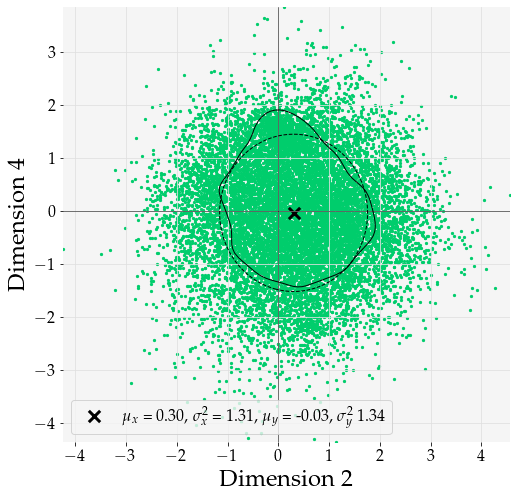

2021-05-24 18:49:18,065 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:18,066 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:49:18,067 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:49:18,067 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:49:18,068 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:49:18,068 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:49:18,068 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:49:18,069 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:49:18,069 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:18,069 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 

2021-05-24 18:49:18,353 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 18:49:18,353 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:49:18,354 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:18,354 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:49:18,354 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:49:18,354 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:49:18,355 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:49:18,355 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:49:18,356 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:49:18,357 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:

2021-05-24 18:49:18,422 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:18,422 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:49:18,424 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/2f554728ce2be6dc9209a89cf3eb6c0d.dvi
2021-05-24 18:49:18,425 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:49:18,426 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:18,426 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:49:18,426 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:49:18,427 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:49:18,428 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:49:18,430 - DEBUG - Textile font is not compatible with

2021-05-24 18:49:18,484 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:49:18,485 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:49:18,485 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:18,485 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:49:18,486 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 18:49:18,487 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:49:18,488 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:18,488 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:49:18,489 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:49:18,489 - DEBUG - family: sans-serif, font: Computer Modern Sans Se

2021-05-24 18:49:18,580 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:49:18,580 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:49:18,581 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:49:18,581 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:49:18,582 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:18,582 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:49:18,582 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/08460d6eb1a42286cb5291bc6638723e.dvi
2021-05-24 18:49:18,583 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:49:18,585 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:18,585 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24

2021-05-24 18:49:18,645 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:49:18,647 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:49:18,649 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:49:18,651 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:49:18,652 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:49:18,652 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:49:18,653 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:18,653 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:49:18,654 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 18:49:18,654 - DEBUG - Dvi._xxx: encountered special: papersize=5203.

2021-05-24 18:49:19,097 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:49:19,098 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:49:19,099 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:49:19,099 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:49:19,100 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:19,102 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:49:19,102 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/68866aab584fc95b83a1baedea5abdb4.dvi
2021-05-24 18:49:19,105 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:49:19,106 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:19,106 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24

2021-05-24 18:49:19,162 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:49:19,163 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:49:19,163 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:49:19,163 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:49:19,163 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:49:19,164 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:49:19,165 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:19,165 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:49:19,165 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 18:49:19,166 - DEBUG - Dvi._xxx: encountered special: papersize=5203.

2021-05-24 18:49:19,229 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:19,229 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:49:19,230 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:49:19,230 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:49:19,231 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:49:19,231 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:49:19,231 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:49:19,232 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:49:19,233 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:19,233 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 

2021-05-24 18:49:19,287 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 18:49:19,288 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:49:19,288 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:19,289 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:49:19,290 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:49:19,290 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:49:19,290 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:49:19,290 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:49:19,291 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:49:19,291 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:

2021-05-24 18:49:19,352 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:19,352 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:49:19,353 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 18:49:19,353 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:49:19,355 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:19,358 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:49:19,358 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:49:19,359 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:49:19,360 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:49:19,360 - DEBUG - Textile font is not compatible with

2021-05-24 18:49:19,408 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:49:19,409 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:49:19,409 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:19,409 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:49:19,410 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/798d56fe5d7b88c994356e1c10aa55a0.dvi
2021-05-24 18:49:19,410 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:49:19,412 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:19,413 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:49:19,413 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:49:19,414 - DEBUG - family: sans-serif, font: Computer Modern Sans Se

2021-05-24 18:49:19,475 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:49:19,475 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:49:19,476 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:49:19,476 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:49:19,476 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:19,476 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:49:19,477 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/6134acbfb19d192b077a5db8a0594e2a.dvi
2021-05-24 18:49:19,478 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:49:19,479 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:19,479 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24

2021-05-24 18:49:19,560 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:49:19,560 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:19,561 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:49:19,561 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/08460d6eb1a42286cb5291bc6638723e.dvi
2021-05-24 18:49:19,562 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:49:19,563 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:19,564 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:49:19,565 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:49:19,565 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:49:19,566 - DEBUG - Apple Chancery font is not compat

2021-05-24 18:49:19,620 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:49:19,621 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:49:19,621 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:49:19,621 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:19,622 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:49:19,622 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 18:49:19,625 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:49:19,625 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:19,626 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:49:19,626 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-

2021-05-24 18:49:19,672 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:49:19,673 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:49:19,673 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:49:19,674 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:49:19,675 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:49:19,675 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:19,676 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:49:19,676 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/98ad7ae73d7aa1b6937a42fda9087332.dvi
2021-05-24 18:49:19,677 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:49:19,682 - DEBUG - family: serif, font: Palatino, info

2021-05-24 18:49:19,731 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:49:19,731 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:19,731 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:49:19,732 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:19,732 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:49:19,732 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:49:19,735 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:49:19,736 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:49:19,739 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:49:19,739 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 

2021-05-24 18:49:19,784 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:49:19,785 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:49:19,785 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:49:19,785 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:49:19,786 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:49:19,786 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:49:19,787 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:49:19,787 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:19,788 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:49:19,789 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 

2021-05-24 18:49:19,841 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:49:19,841 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:49:19,841 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:19,842 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:49:19,842 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/23bf86614c5b9fe7dd956d1ac7d6a2ea.dvi
2021-05-24 18:49:19,843 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:49:19,846 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:19,847 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:49:19,848 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:49:19,848 - DEBUG - family: sans-serif, font: Computer Modern Sans Se

2021-05-24 18:49:19,901 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:49:19,901 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:49:19,902 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:49:19,902 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:49:19,902 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:19,904 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:49:19,905 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 18:49:19,906 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:49:19,907 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:19,908 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24

2021-05-24 18:49:19,950 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:49:19,950 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:49:19,953 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:49:19,954 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:49:19,954 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:49:19,955 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:49:19,956 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:19,956 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:49:19,956 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/2e65e9b695a94456b83fb58e8b9d15a2.dvi
2021-05-24 18:49:19,957 - DEBUG - Dvi._xxx: encountered special: papersize=5203.

2021-05-24 18:49:20,007 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:49:20,007 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:49:20,008 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:49:20,010 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:49:20,010 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:20,010 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:49:20,011 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:20,011 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:49:20,011 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:49:20,012 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 

2021-05-24 18:49:20,062 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:49:20,063 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:20,064 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:49:20,065 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:49:20,066 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:49:20,067 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:49:20,067 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:49:20,071 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:49:20,072 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:49:20,072 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:20,072 - DEBUG - fam

2021-05-24 18:49:20,117 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:49:20,121 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:49:20,121 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:49:20,121 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:49:20,122 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:20,122 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:49:20,122 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/c56347dc1b2b2ad24f964fc0646393ef.dvi
2021-05-24 18:49:20,123 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:49:20,127 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:20,127 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24

2021-05-24 18:49:20,349 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:49:20,350 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:49:20,350 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:49:20,351 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:49:20,351 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:49:20,352 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:49:20,354 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:20,356 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:49:20,357 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 18:49:20,357 - DEBUG - Dvi._xxx: encountered special: papersize=5203.

2021-05-24 18:49:20,393 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:20,393 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:49:20,394 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:49:20,394 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:49:20,394 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:49:20,394 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:49:20,395 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:49:20,395 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:49:20,395 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:20,395 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 

2021-05-24 18:49:20,435 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:20,435 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:49:20,436 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:49:20,437 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:49:20,437 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:49:20,437 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:49:20,438 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:49:20,438 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:49:20,438 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:20,439 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 

2021-05-24 18:49:20,477 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:49:20,478 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:20,478 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:49:20,479 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/491cca92ef7fc4f0496df6cd4270a1ae.dvi
2021-05-24 18:49:20,479 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:49:20,481 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:20,481 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:49:20,481 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:49:20,482 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:49:20,482 - DEBUG - Apple Chancery font is not compat

2021-05-24 18:49:20,610 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:49:20,610 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 18:49:20,611 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:49:20,612 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:20,613 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:49:20,613 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:49:20,613 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:49:20,613 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:49:20,614 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:49:20,615 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', 

2021-05-24 18:49:20,651 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:49:20,651 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:20,652 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:49:20,653 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/68866aab584fc95b83a1baedea5abdb4.dvi
2021-05-24 18:49:20,653 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:49:20,654 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:20,655 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:49:20,656 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:49:20,657 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:49:20,657 - DEBUG - Apple Chancery font is not compat

2021-05-24 18:49:20,699 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:49:20,699 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:49:20,699 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:49:20,701 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:20,701 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:49:20,702 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 18:49:20,703 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:49:20,704 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:20,704 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:49:20,704 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-

2021-05-24 18:49:20,740 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:49:20,740 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:20,740 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:49:20,741 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/08460d6eb1a42286cb5291bc6638723e.dvi
2021-05-24 18:49:20,742 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:49:20,743 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:20,744 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:49:20,744 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:49:20,744 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:49:20,744 - DEBUG - Apple Chancery font is not compat

2021-05-24 18:49:20,787 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:49:20,789 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:49:20,789 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:49:20,790 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:49:20,790 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:49:20,791 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:49:20,791 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:49:20,792 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:20,793 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:49:20,794 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/a0ac8a6b3c6d73399d7c81ab1b857e23.dv

2021-05-24 18:49:20,836 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:49:20,837 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:49:20,837 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:20,838 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:49:20,840 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/6134acbfb19d192b077a5db8a0594e2a.dvi
2021-05-24 18:49:20,841 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:49:20,841 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:20,842 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:49:20,842 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:49:20,842 - DEBUG - family: sans-serif, font: Computer Modern Sans Se

2021-05-24 18:49:20,882 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:49:20,883 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:49:20,883 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:20,886 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:49:20,886 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/08460d6eb1a42286cb5291bc6638723e.dvi
2021-05-24 18:49:20,887 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:49:20,888 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:20,888 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:49:20,889 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:49:20,889 - DEBUG - family: sans-serif, font: Computer Modern Sans Se

2021-05-24 18:49:20,930 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:49:20,931 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:49:20,931 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:49:20,932 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:49:20,932 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:20,932 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:49:20,932 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 18:49:20,934 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:49:20,937 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:20,937 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24

2021-05-24 18:49:20,978 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:49:20,978 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:49:20,979 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:49:20,979 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:49:20,979 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:20,980 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:49:20,980 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/129c56a1b99ba53bbcb35940a58e704b.dvi
2021-05-24 18:49:20,981 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:49:20,983 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:20,983 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24

2021-05-24 18:49:23,477 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:23,478 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:49:23,479 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 18:49:23,480 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:49:23,480 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:23,481 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:49:23,482 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:49:23,483 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:49:23,483 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:49:23,484 - DEBUG - Textile font is not compatible with

2021-05-24 18:49:23,534 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:49:23,535 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:49:23,535 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:23,535 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:49:23,536 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/2f554728ce2be6dc9209a89cf3eb6c0d.dvi
2021-05-24 18:49:23,536 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:49:23,537 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:23,537 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:49:23,538 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:49:23,538 - DEBUG - family: sans-serif, font: Computer Modern Sans Se

2021-05-24 18:49:23,605 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:49:23,607 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:49:23,607 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:49:23,608 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:49:23,608 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:23,608 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:49:23,611 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/6134acbfb19d192b077a5db8a0594e2a.dvi
2021-05-24 18:49:23,611 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:49:23,612 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:23,612 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24

2021-05-24 18:49:23,677 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:49:23,678 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:49:23,678 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:49:23,679 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:49:23,679 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:49:23,679 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:49:23,680 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:23,680 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:49:23,681 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/68866aab584fc95b83a1baedea5abdb4.dvi
2021-05-24 18:49:23,683 - DEBUG - Dvi._xxx: encountered special: papersize=5203.

2021-05-24 18:49:23,735 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:23,735 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:49:23,735 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:49:23,736 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:49:23,736 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:49:23,737 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:49:23,737 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:49:23,737 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:49:23,738 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:23,738 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 

2021-05-24 18:49:23,800 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 18:49:23,801 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:49:23,802 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:23,803 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:49:23,804 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:49:23,804 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:49:23,804 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:49:23,805 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:49:23,805 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:49:23,805 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:

2021-05-24 18:49:24,516 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:24,516 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:49:24,516 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 18:49:24,517 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:49:24,517 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:24,518 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:49:24,518 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:49:24,518 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:49:24,519 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:49:24,519 - DEBUG - Textile font is not compatible with

2021-05-24 18:49:24,551 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:49:24,551 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:49:24,551 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:24,551 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:49:24,553 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/2f554728ce2be6dc9209a89cf3eb6c0d.dvi
2021-05-24 18:49:24,553 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:49:24,554 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:24,555 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:49:24,556 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:49:24,556 - DEBUG - family: sans-serif, font: Computer Modern Sans Se

2021-05-24 18:49:24,593 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:49:24,593 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:49:24,594 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:49:24,594 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:49:24,595 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:24,595 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:49:24,595 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/129c56a1b99ba53bbcb35940a58e704b.dvi
2021-05-24 18:49:24,596 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:49:24,597 - DEBUG - Assigning font /b'F1' = b'cmsy10' (dvi)
2021-05-24 18:49:24,597 - DEBUG - Assigning font /b'F2' = b'pplr8r' (dvi)
2021-05-24 18:49:24,599 - DEBUG - family: serif, 

2021-05-24 18:49:24,637 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:24,637 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:49:24,638 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:49:24,638 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:49:24,638 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:49:24,639 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:49:24,640 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:49:24,641 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:49:24,641 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:24,641 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 

2021-05-24 18:49:24,681 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 18:49:24,682 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:49:24,683 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:24,683 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:49:24,683 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:49:24,684 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:49:24,684 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:49:24,684 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:49:24,684 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:49:24,685 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:

2021-05-24 18:49:24,725 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:24,725 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:49:24,725 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/a0ac8a6b3c6d73399d7c81ab1b857e23.dvi
2021-05-24 18:49:24,726 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:49:24,727 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:24,728 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:49:24,729 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:49:24,729 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:49:24,730 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:49:24,730 - DEBUG - Textile font is not compatible with

2021-05-24 18:49:24,776 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:49:24,776 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:49:24,776 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:24,777 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:49:24,777 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/08460d6eb1a42286cb5291bc6638723e.dvi
2021-05-24 18:49:24,778 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:49:24,780 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:24,780 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:49:24,781 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:49:24,781 - DEBUG - family: sans-serif, font: Computer Modern Sans Se

2021-05-24 18:49:24,822 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:49:24,823 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:49:24,823 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:49:24,824 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:49:24,824 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:24,824 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:49:24,825 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/98ad7ae73d7aa1b6937a42fda9087332.dvi
2021-05-24 18:49:24,826 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:49:24,829 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:24,829 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24

2021-05-24 18:49:25,001 - DEBUG - Embedding Type-1 font b'cmsy10' from dvi.
2021-05-24 18:49:25,001 - DEBUG - Embedding TeX font b'cmsy10' - fontinfo={'dvifont': <DviFont: b'cmsy10'>, 'pdfname': <Name b'F1'>, 'fontfile': '/usr/share/texlive/texmf-dist/fonts/type1/public/amsfonts/cm/cmsy10.pfb', 'basefont': b'CMSY10', 'encodingfile': None, 'effects': {}}
2021-05-24 18:49:25,008 - DEBUG - Embedding Type-1 font b'fplmri' from dvi.
2021-05-24 18:49:25,011 - DEBUG - Embedding TeX font b'fplmri' - fontinfo={'dvifont': <DviFont: b'fplmri'>, 'pdfname': <Name b'F3'>, 'fontfile': '/usr/share/texlive/texmf-dist/fonts/type1/public/mathpazo/fplmri.pfb', 'basefont': b'PazoMath-Italic', 'encodingfile': None, 'effects': {}}
2021-05-24 18:49:25,014 - DEBUG - Embedding Type-1 font b'pplr8r' from dvi.
2021-05-24 18:49:25,015 - DEBUG - Embedding TeX font b'pplr8r' - fontinfo={'dvifont': <DviFont: b'pplr8r'>, 'pdfname': <Name b'F2'>, 'fontfile': '/usr/share/texlive/texmf-dist/fonts/type1/urw/palatino/uplr8

2021-05-24 18:49:25,077 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:49:25,077 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:25,078 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:49:25,078 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/3ce07bc18b31318dfb8589ef3427ba04.dvi
2021-05-24 18:49:25,078 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:49:25,080 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:25,080 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:49:25,081 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:49:25,081 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:49:25,082 - DEBUG - Apple Chancery font is not compat

2021-05-24 18:49:25,115 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:49:25,115 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:49:25,116 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:49:25,116 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:25,116 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:49:25,117 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 18:49:25,118 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:49:25,118 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:25,119 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:49:25,119 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-

2021-05-24 18:49:25,159 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:49:25,159 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:25,160 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:49:25,161 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/08460d6eb1a42286cb5291bc6638723e.dvi
2021-05-24 18:49:25,161 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:49:25,163 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:25,163 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:49:25,163 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:49:25,164 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:49:25,164 - DEBUG - Apple Chancery font is not compat

2021-05-24 18:49:25,200 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:49:25,201 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:49:25,201 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:49:25,202 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:49:25,204 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:49:25,204 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:49:25,207 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:49:25,208 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:25,209 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:49:25,210 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/a0ac8a6b3c6d73399d7c81ab1b857e23.dv

2021-05-24 18:49:25,251 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:49:25,251 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:49:25,251 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:49:25,252 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:49:25,252 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:25,253 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:49:25,253 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:25,253 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:49:25,254 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:49:25,254 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 

2021-05-24 18:49:25,296 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:49:25,296 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:49:25,296 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:49:25,296 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:49:25,297 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:25,297 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:49:25,297 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/68866aab584fc95b83a1baedea5abdb4.dvi
2021-05-24 18:49:25,299 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:49:25,300 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:25,300 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24

2021-05-24 18:49:25,342 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:49:25,342 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:49:25,342 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:49:25,343 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:49:25,343 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:49:25,344 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:49:25,344 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:25,345 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:49:25,345 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 18:49:25,346 - DEBUG - Dvi._xxx: encountered special: papersize=5203.

2021-05-24 18:49:25,384 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:49:25,384 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:49:25,384 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:49:25,385 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:49:25,386 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:25,386 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:49:25,386 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/3ce07bc18b31318dfb8589ef3427ba04.dvi
2021-05-24 18:49:25,387 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:49:25,388 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:25,389 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24

2021-05-24 18:49:25,423 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:49:25,423 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:25,424 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:49:25,425 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:49:25,425 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:49:25,425 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:49:25,426 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:49:25,427 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:49:25,427 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:49:25,428 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 

2021-05-24 18:49:25,467 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:49:25,467 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:49:25,467 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:49:25,468 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:49:25,468 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:49:25,468 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:49:25,468 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:49:25,469 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:25,469 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:49:25,471 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 

2021-05-24 18:49:25,810 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:49:25,810 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:49:25,810 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:49:25,811 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:49:25,811 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:49:25,811 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:49:25,812 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:49:25,812 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:25,812 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:49:25,812 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/2744f8601586b773a72d7b71ba78deb3.dv

2021-05-24 18:49:26,177 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:49:26,178 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:26,179 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:49:26,179 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:49:26,179 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:49:26,180 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:49:26,180 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:49:26,180 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:49:26,181 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:49:26,181 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:26,182 - DEBUG - fam

2021-05-24 18:49:26,217 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:49:26,218 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 18:49:26,218 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:49:26,219 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:26,219 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:49:26,220 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:49:26,220 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:49:26,221 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:49:26,221 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:49:26,221 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', 

2021-05-24 18:49:26,262 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:49:26,264 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:26,264 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:49:26,264 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:49:26,265 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:49:26,265 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:49:26,265 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:49:26,265 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:49:26,266 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:49:26,266 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:26,268 - DEBUG - fam

2021-05-24 18:49:26,307 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:49:26,307 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:49:26,307 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:26,307 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:49:26,308 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/a0ac8a6b3c6d73399d7c81ab1b857e23.dvi
2021-05-24 18:49:26,308 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:49:26,310 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:26,310 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:49:26,311 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:49:26,311 - DEBUG - family: sans-serif, font: Computer Modern Sans Se

2021-05-24 18:49:26,346 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:26,347 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:49:26,347 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:26,348 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:49:26,349 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:49:26,349 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:49:26,349 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:49:26,350 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:49:26,350 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:49:26,351 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 

2021-05-24 18:49:26,391 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:26,392 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:49:26,392 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/68866aab584fc95b83a1baedea5abdb4.dvi
2021-05-24 18:49:26,395 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:49:26,396 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:26,396 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:49:26,397 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:49:26,397 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:49:26,397 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:49:26,398 - DEBUG - Textile font is not compatible with

2021-05-24 18:49:26,438 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:49:26,438 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:49:26,439 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:26,440 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:49:26,441 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 18:49:26,441 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:49:26,442 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:26,442 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:49:26,443 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:49:26,443 - DEBUG - family: sans-serif, font: Computer Modern Sans Se

2021-05-24 18:49:26,481 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:26,482 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:49:26,483 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/3ce07bc18b31318dfb8589ef3427ba04.dvi
2021-05-24 18:49:26,484 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:49:26,485 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:26,485 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:49:26,486 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:49:26,486 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:49:26,487 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:49:26,487 - DEBUG - Textile font is not compatible with

2021-05-24 18:49:26,522 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:49:26,522 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:49:26,522 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:49:26,523 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:49:26,523 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:49:26,524 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:49:26,524 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:26,525 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:49:26,525 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/2e65e9b695a94456b83fb58e8b9d15a2.dvi
2021-05-24 18:49:26,526 - DEBUG - Dvi._xxx: encountered special: papersize=5203.

2021-05-24 18:49:26,564 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:49:26,565 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:49:26,565 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:49:26,565 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:49:26,566 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:26,566 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:49:26,566 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:26,567 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:49:26,567 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:49:26,567 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 

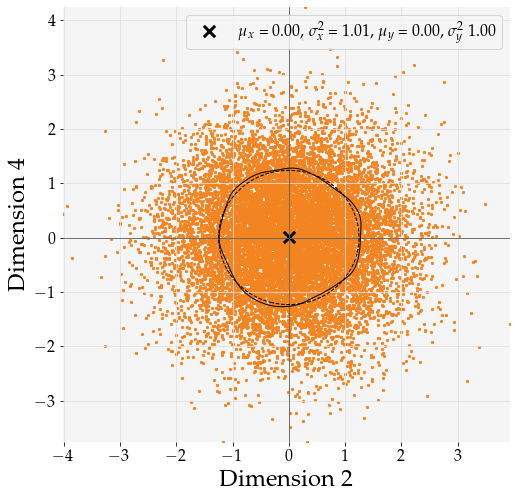

2021-05-24 18:49:26,770 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:26,770 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:49:26,771 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:49:26,771 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:49:26,771 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:49:26,772 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:49:26,772 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:49:26,773 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:49:26,773 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:26,774 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 

2021-05-24 18:49:26,850 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:49:26,851 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:26,851 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:49:26,851 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/3ce07bc18b31318dfb8589ef3427ba04.dvi
2021-05-24 18:49:26,852 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:49:26,853 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:26,853 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:49:26,853 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:49:26,854 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:49:26,855 - DEBUG - Apple Chancery font is not compat

2021-05-24 18:49:26,892 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:49:26,892 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:49:26,893 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:49:26,893 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:26,893 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:49:26,894 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 18:49:26,895 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:49:26,896 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:26,896 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:49:26,897 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-

2021-05-24 18:49:26,948 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:49:26,948 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:49:26,948 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:49:26,949 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:49:26,949 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:49:26,950 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:26,950 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:49:26,951 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/08460d6eb1a42286cb5291bc6638723e.dvi
2021-05-24 18:49:26,952 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:49:26,953 - DEBUG - family: serif, font: Palatino, info

2021-05-24 18:49:26,991 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:49:26,991 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:49:26,991 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:49:26,991 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:49:26,992 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:49:26,993 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:49:26,993 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:49:26,993 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:26,994 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:49:26,994 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dv

2021-05-24 18:49:27,032 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:49:27,033 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:27,033 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:49:27,033 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:49:27,034 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:49:27,034 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:49:27,034 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:49:27,035 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:49:27,035 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:49:27,037 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:27,037 - DEBUG - fam

2021-05-24 18:49:27,091 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:49:27,091 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/aab5cc4d22d25565e9490903bf3c04ba.dvi
2021-05-24 18:49:27,092 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:49:27,093 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:27,093 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:49:27,094 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:49:27,094 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:49:27,094 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:49:27,095 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:49:27,095 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', 

2021-05-24 18:49:27,840 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:27,841 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:49:27,841 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 18:49:27,842 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:49:27,843 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:27,843 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:49:27,844 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:49:27,844 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:49:27,844 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:49:27,844 - DEBUG - Textile font is not compatible with

2021-05-24 18:49:27,883 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:27,883 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:49:27,884 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:49:27,884 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:49:27,885 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:49:27,886 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:49:27,886 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:49:27,886 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:49:27,887 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:27,887 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 

2021-05-24 18:49:27,924 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:49:27,924 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:27,925 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:49:27,925 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/2e65e9b695a94456b83fb58e8b9d15a2.dvi
2021-05-24 18:49:27,927 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:49:27,928 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:27,929 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:49:27,930 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:49:27,930 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:49:27,931 - DEBUG - Apple Chancery font is not compat

2021-05-24 18:49:27,974 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:49:27,976 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 18:49:27,976 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:49:27,977 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:27,978 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:49:27,978 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:49:27,978 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:49:27,979 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:49:27,979 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:49:27,980 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', 

2021-05-24 18:49:28,021 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:49:28,021 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:28,022 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:49:28,022 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/2f554728ce2be6dc9209a89cf3eb6c0d.dvi
2021-05-24 18:49:28,023 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:49:28,025 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:28,025 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:49:28,026 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:49:28,026 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:49:28,026 - DEBUG - Apple Chancery font is not compat

2021-05-24 18:49:28,069 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:49:28,069 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:49:28,070 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:49:28,070 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:28,070 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:49:28,071 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 18:49:28,071 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:49:28,072 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:28,072 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:49:28,073 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-

2021-05-24 18:49:28,135 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/68866aab584fc95b83a1baedea5abdb4.dvi
2021-05-24 18:49:28,136 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:49:28,137 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:28,138 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:49:28,138 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:49:28,140 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:49:28,140 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:49:28,141 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:49:28,142 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:49:28,143 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:

2021-05-24 18:49:28,195 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:49:28,195 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:49:28,196 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:49:28,196 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:49:28,196 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:28,197 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:49:28,198 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/a1989b0e82ab32b7b1a08bb5ee1fda2d.dvi
2021-05-24 18:49:28,198 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:49:28,199 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:28,200 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24

2021-05-24 18:49:28,262 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:49:28,263 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:28,263 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:49:28,264 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 18:49:28,264 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:49:28,265 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:28,265 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:49:28,266 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:49:28,266 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:49:28,266 - DEBUG - Apple Chancery font is not compat

2021-05-24 18:49:28,312 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:49:28,313 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:28,313 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:49:28,314 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 18:49:28,314 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:49:28,315 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:28,316 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:49:28,316 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:49:28,317 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:49:28,317 - DEBUG - Apple Chancery font is not compat

2021-05-24 18:49:28,363 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:49:28,363 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:49:28,363 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:49:28,363 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:28,364 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:49:28,374 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/491cca92ef7fc4f0496df6cd4270a1ae.dvi
2021-05-24 18:49:28,376 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:49:28,377 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:28,377 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:49:28,378 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-

2021-05-24 18:49:28,416 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:49:28,416 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:49:28,416 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:49:28,417 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:49:28,417 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:49:28,417 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:28,418 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:49:28,418 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:28,418 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:49:28,419 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 

2021-05-24 18:49:28,463 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/be1054efb11919c0b518672140abdf0c.dvi
2021-05-24 18:49:28,463 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:49:28,464 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:28,465 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:49:28,465 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:49:28,466 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:49:28,466 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:49:28,466 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:49:28,467 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:49:28,467 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:

2021-05-24 18:49:28,508 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:49:28,509 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:49:28,509 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:49:28,510 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:49:28,510 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:28,510 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:49:28,511 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/5ba01290423d2dd279cd1135392ac508.dvi
2021-05-24 18:49:28,511 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:49:28,514 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:28,514 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24

2021-05-24 18:49:28,635 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:49:28,636 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:49:28,636 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:49:28,636 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:49:28,636 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:28,637 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:49:28,637 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 18:49:28,638 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:49:28,641 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:28,642 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24

2021-05-24 18:49:28,679 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:49:28,680 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:49:28,680 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:49:28,681 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:49:28,681 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:49:28,682 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:49:28,682 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:28,683 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:49:28,683 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/2f554728ce2be6dc9209a89cf3eb6c0d.dvi
2021-05-24 18:49:28,684 - DEBUG - Dvi._xxx: encountered special: papersize=5203.

2021-05-24 18:49:28,723 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:28,723 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:49:28,724 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:49:28,724 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:49:28,724 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:49:28,725 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:49:28,725 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:49:28,725 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:49:28,725 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:28,726 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 

2021-05-24 18:49:28,759 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:49:28,760 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:28,761 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:49:28,762 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/68866aab584fc95b83a1baedea5abdb4.dvi
2021-05-24 18:49:28,763 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:49:28,764 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:28,765 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:49:28,765 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:49:28,766 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:49:28,766 - DEBUG - Apple Chancery font is not compat

2021-05-24 18:49:28,802 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:49:28,803 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:49:28,803 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:49:28,803 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:49:28,806 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:49:28,807 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:49:28,808 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:49:28,809 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:28,810 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:49:28,810 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/a1989b0e82ab32b7b1a08bb5ee1fda2d.dv

2021-05-24 18:49:31,457 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:49:31,458 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 18:49:31,458 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:49:31,459 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:31,459 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:49:31,460 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:49:31,460 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:49:31,460 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:49:31,460 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:49:31,461 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', 

2021-05-24 18:49:31,495 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:49:31,496 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:31,496 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:49:31,497 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/2f554728ce2be6dc9209a89cf3eb6c0d.dvi
2021-05-24 18:49:31,498 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:49:31,499 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:31,499 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:49:31,499 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:49:31,500 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:49:31,500 - DEBUG - Apple Chancery font is not compat

2021-05-24 18:49:31,539 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:49:31,539 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:49:31,539 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:49:31,540 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:31,541 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:49:31,542 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/6134acbfb19d192b077a5db8a0594e2a.dvi
2021-05-24 18:49:31,543 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:49:31,544 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:31,545 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:49:31,545 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-

2021-05-24 18:49:31,605 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:49:31,605 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:49:31,605 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:49:31,606 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:49:31,606 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:49:31,606 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:31,607 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:49:31,607 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/913ab995f8a6d3cd94c336bce0c705a9.dvi
2021-05-24 18:49:31,610 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:49:31,611 - DEBUG - family: serif, font: Palatino, info

2021-05-24 18:49:31,659 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:49:31,659 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:49:31,660 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:49:31,661 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:49:31,663 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:49:31,663 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:49:31,664 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:49:31,664 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:31,664 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:49:31,665 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dv

2021-05-24 18:49:31,734 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:49:31,734 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:31,735 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:49:31,735 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:49:31,735 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:49:31,736 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:49:31,736 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:49:31,737 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:49:31,737 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:49:31,737 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:31,738 - DEBUG - fam

2021-05-24 18:49:32,509 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 18:49:32,510 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:49:32,510 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:32,511 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:49:32,511 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:49:32,511 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:49:32,512 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:49:32,512 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:49:32,512 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:49:32,512 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:

2021-05-24 18:49:32,558 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:32,558 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:49:32,558 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/a0ac8a6b3c6d73399d7c81ab1b857e23.dvi
2021-05-24 18:49:32,559 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:49:32,560 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:32,560 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:49:32,561 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:49:32,561 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:49:32,561 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:49:32,571 - DEBUG - Textile font is not compatible with

2021-05-24 18:49:32,610 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:49:32,610 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:49:32,610 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:49:32,611 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:49:32,611 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:32,611 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:49:32,611 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/68866aab584fc95b83a1baedea5abdb4.dvi
2021-05-24 18:49:32,612 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:49:32,615 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:32,615 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24

2021-05-24 18:49:32,659 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:49:32,659 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:49:32,659 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:49:32,660 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:49:32,660 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:49:32,661 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:49:32,661 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:32,661 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:49:32,662 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/23bf86614c5b9fe7dd956d1ac7d6a2ea.dvi
2021-05-24 18:49:32,663 - DEBUG - Dvi._xxx: encountered special: papersize=5203.

2021-05-24 18:49:32,707 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:32,708 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:49:32,708 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:49:32,708 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:49:32,709 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:49:32,709 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:49:32,710 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:49:32,710 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:49:32,710 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:32,710 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 

2021-05-24 18:49:32,755 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 18:49:32,756 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:49:32,756 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:32,757 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:49:32,757 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:49:32,757 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:49:32,758 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:49:32,758 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:49:32,758 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:49:32,758 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:

2021-05-24 18:49:32,807 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:32,807 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:49:32,808 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/c3ec0b22b0b6cb3f95e221e809e07549.dvi
2021-05-24 18:49:32,809 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:49:32,811 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:32,812 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:49:32,812 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:49:32,813 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:49:32,813 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:49:32,813 - DEBUG - Textile font is not compatible with

2021-05-24 18:49:32,863 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:49:32,863 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:49:32,866 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:32,867 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:49:32,868 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/c56347dc1b2b2ad24f964fc0646393ef.dvi
2021-05-24 18:49:32,869 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:49:32,874 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:32,875 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:49:32,875 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:49:32,875 - DEBUG - family: sans-serif, font: Computer Modern Sans Se

2021-05-24 18:49:33,066 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:49:33,068 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:33,069 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:49:33,071 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:49:33,071 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:49:33,071 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:49:33,072 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:49:33,072 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:49:33,072 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:49:33,073 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:33,073 - DEBUG - fam

2021-05-24 18:49:33,108 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:49:33,109 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 18:49:33,110 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:49:33,111 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:33,111 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:49:33,112 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:49:33,112 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:49:33,112 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:49:33,113 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:49:33,113 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', 

2021-05-24 18:49:33,155 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:49:33,156 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/08460d6eb1a42286cb5291bc6638723e.dvi
2021-05-24 18:49:33,157 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:49:33,159 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:33,159 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:49:33,159 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:49:33,160 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:49:33,160 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:49:33,160 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:49:33,161 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', 

2021-05-24 18:49:33,196 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:49:33,197 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:49:33,197 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:49:33,197 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:49:33,198 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:49:33,199 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:33,199 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:49:33,200 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/a0ac8a6b3c6d73399d7c81ab1b857e23.dvi
2021-05-24 18:49:33,201 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:49:33,203 - DEBUG - family: serif, font: Palatino, info

2021-05-24 18:49:33,244 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:49:33,245 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:49:33,245 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:49:33,245 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:33,246 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:49:33,247 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:33,250 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:49:33,251 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:49:33,253 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:49:33,253 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 

2021-05-24 18:49:33,298 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:49:33,298 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:49:33,299 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:49:33,299 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:33,299 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:49:33,300 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/913ab995f8a6d3cd94c336bce0c705a9.dvi
2021-05-24 18:49:33,300 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:49:33,301 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:33,302 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:49:33,302 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-

2021-05-24 18:49:33,339 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:49:33,340 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:49:33,340 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:49:33,340 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:49:33,341 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:49:33,341 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:33,342 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:49:33,342 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 18:49:33,343 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:49:33,343 - DEBUG - family: serif, font: Palatino, info

2021-05-24 18:49:33,393 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:49:33,393 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:49:33,394 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:49:33,394 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:49:33,394 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:49:33,395 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:49:33,395 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:33,395 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:49:33,395 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:33,396 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 

2021-05-24 18:49:33,434 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:49:33,435 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:49:33,435 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:49:33,435 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:33,436 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:49:33,437 - DEBUG - STREAM b'IHDR' 16 13
2021-05-24 18:49:33,437 - DEBUG - STREAM b'PLTE' 41 48
2021-05-24 18:49:33,438 - DEBUG - STREAM b'tRNS' 101 15
2021-05-24 18:49:33,438 - DEBUG - STREAM b'pHYs' 128 9
2021-05-24 18:49:33,438 - DEBUG - STREAM b'IDAT' 149 96
2021-05-24 18:49:33,439 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:33,439 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:49:33,439 - DEBUG - Bit

2021-05-24 18:49:33,479 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:49:33,479 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:49:33,480 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:49:33,481 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:33,481 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:49:33,481 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/9575a85e4ba078e95e723f60008367b4.dvi
2021-05-24 18:49:33,482 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:49:33,483 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:33,484 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:49:33,484 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-

2021-05-24 18:49:33,527 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:49:33,527 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:49:33,527 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:33,528 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:49:33,528 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/6134acbfb19d192b077a5db8a0594e2a.dvi
2021-05-24 18:49:33,529 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:49:33,529 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:33,530 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:49:33,530 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:49:33,531 - DEBUG - family: sans-serif, font: Computer Modern Sans Se

2021-05-24 18:49:33,692 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:33,692 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:49:33,693 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:33,694 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:49:33,694 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:49:33,694 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:49:33,695 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:49:33,695 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:49:33,695 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:49:33,695 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 

2021-05-24 18:49:34,156 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:49:34,156 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:49:34,157 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:49:34,157 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:49:34,157 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:34,157 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:49:34,158 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 18:49:34,159 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:49:34,159 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:34,160 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24

2021-05-24 18:49:34,192 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:49:34,193 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:49:34,193 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:49:34,193 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:49:34,193 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:49:34,194 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:49:34,194 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:34,194 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:49:34,194 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/2e65e9b695a94456b83fb58e8b9d15a2.dvi
2021-05-24 18:49:34,196 - DEBUG - Dvi._xxx: encountered special: papersize=5203.

2021-05-24 18:49:34,239 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:49:34,240 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:49:34,240 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:49:34,240 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:49:34,241 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:34,241 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:49:34,242 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:34,242 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:49:34,243 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:49:34,244 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 

2021-05-24 18:49:34,282 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:49:34,283 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:34,284 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:49:34,284 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:49:34,285 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:49:34,286 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:49:34,286 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:49:34,286 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:49:34,287 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:49:34,288 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:34,288 - DEBUG - fam

2021-05-24 18:49:34,332 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:49:34,333 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:49:34,334 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:49:34,335 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:49:34,335 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:49:34,335 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:49:34,335 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:49:34,336 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:34,336 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:49:34,339 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/2633a88101df5610ba0e1fa38f43dfc3.dv

2021-05-24 18:49:34,373 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:49:34,375 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:34,375 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:49:34,376 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:49:34,376 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:49:34,377 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:49:34,377 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:49:34,378 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:49:34,378 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:49:34,379 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:34,380 - DEBUG - fam

2021-05-24 18:49:34,414 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:49:34,415 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 18:49:34,416 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:49:34,417 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:34,417 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:49:34,418 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:49:34,418 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:49:34,419 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:49:34,419 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:49:34,419 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', 

2021-05-24 18:49:34,461 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:49:34,461 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:49:34,462 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:49:34,462 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:49:34,462 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:49:34,462 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:49:34,463 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:49:34,463 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:34,463 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:49:34,464 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 

2021-05-24 18:49:34,506 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:34,506 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:49:34,508 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/ed13600b0516334410debb9bb94bb511.dvi
2021-05-24 18:49:34,508 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:49:34,510 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:34,510 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:49:34,510 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:49:34,511 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:49:34,511 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:49:34,512 - DEBUG - Textile font is not compatible with

2021-05-24 18:49:34,550 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 18:49:34,551 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:49:34,552 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:34,552 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:49:34,552 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:49:34,553 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:49:34,553 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:49:34,554 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:49:34,554 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:49:34,554 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:

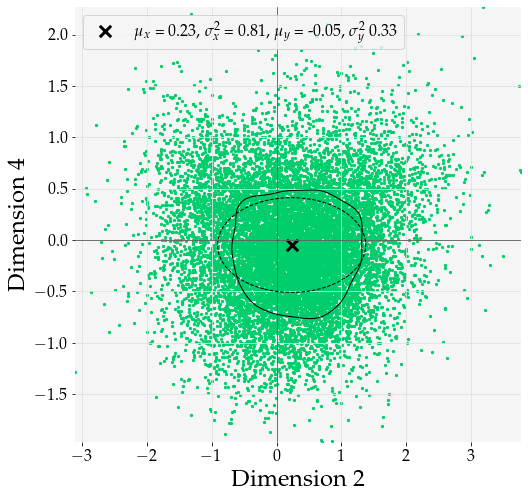

2021-05-24 18:49:34,738 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:34,739 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:49:34,739 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:49:34,739 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:49:34,740 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:49:34,742 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:49:34,742 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:49:34,743 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:49:34,743 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:34,744 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 

2021-05-24 18:49:34,990 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 18:49:34,991 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:49:34,991 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:34,992 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:49:34,992 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:49:34,992 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:49:34,993 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:49:34,993 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:49:34,994 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:49:34,994 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:

2021-05-24 18:49:35,033 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:35,033 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:49:35,034 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/a0ac8a6b3c6d73399d7c81ab1b857e23.dvi
2021-05-24 18:49:35,034 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:49:35,035 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:35,036 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:49:35,036 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:49:35,036 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:49:35,036 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:49:35,037 - DEBUG - Textile font is not compatible with

2021-05-24 18:49:35,084 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:49:35,085 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:49:35,085 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:35,086 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:49:35,087 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 18:49:35,088 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:49:35,089 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:35,090 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:49:35,090 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:49:35,091 - DEBUG - family: sans-serif, font: Computer Modern Sans Se

2021-05-24 18:49:35,126 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:49:35,126 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:49:35,127 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:49:35,128 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:49:35,129 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:35,129 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:49:35,129 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/2e65e9b695a94456b83fb58e8b9d15a2.dvi
2021-05-24 18:49:35,130 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:49:35,134 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:35,134 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24

2021-05-24 18:49:35,181 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:49:35,181 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:49:35,182 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:49:35,182 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:49:35,182 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:49:35,183 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:49:35,184 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:35,184 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:49:35,184 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 18:49:35,185 - DEBUG - Dvi._xxx: encountered special: papersize=5203.

2021-05-24 18:49:35,226 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:35,226 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:49:35,227 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:49:35,227 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:49:35,228 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:49:35,228 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:49:35,228 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:49:35,228 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:49:35,229 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:35,229 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 

2021-05-24 18:49:35,866 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:49:35,867 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:49:35,867 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:49:35,867 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:49:35,868 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:49:35,868 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:49:35,868 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:49:35,868 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:35,869 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:49:35,869 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/2f554728ce2be6dc9209a89cf3eb6c0d.dv

2021-05-24 18:49:35,903 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:49:35,905 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:35,906 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:49:35,906 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:49:35,906 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:49:35,907 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:49:35,907 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:49:35,907 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:49:35,907 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:49:35,908 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:35,908 - DEBUG - fam

2021-05-24 18:49:35,944 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:49:35,945 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:49:35,945 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:35,946 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:49:35,946 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/2f554728ce2be6dc9209a89cf3eb6c0d.dvi
2021-05-24 18:49:35,947 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:49:35,949 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:35,950 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:49:35,951 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:49:35,951 - DEBUG - family: sans-serif, font: Computer Modern Sans Se

2021-05-24 18:49:35,992 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/6134acbfb19d192b077a5db8a0594e2a.dvi
2021-05-24 18:49:35,993 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:49:35,994 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:35,994 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:49:35,994 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:49:35,994 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:49:35,995 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:49:35,995 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:49:35,995 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:49:35,996 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:

2021-05-24 18:49:36,040 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/2f554728ce2be6dc9209a89cf3eb6c0d.dvi
2021-05-24 18:49:36,041 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:49:36,042 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:36,042 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:49:36,043 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:49:36,043 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:49:36,043 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:49:36,044 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:49:36,044 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:49:36,045 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:

2021-05-24 18:49:36,083 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:36,083 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:49:36,086 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:49:36,086 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:49:36,087 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:49:36,087 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:49:36,087 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:49:36,088 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:49:36,088 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:36,088 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 

2021-05-24 18:49:36,129 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:49:36,129 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:49:36,130 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:49:36,130 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:49:36,130 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:49:36,130 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:49:36,131 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:36,131 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:49:36,131 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:36,132 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 

2021-05-24 18:49:36,341 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:49:36,343 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:49:36,343 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:49:36,343 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:49:36,344 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:49:36,344 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:49:36,344 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:36,345 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:49:36,345 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/deee5f8feec3924c27c6bfc0f9d5f9c8.dvi
2021-05-24 18:49:36,346 - DEBUG - Dvi._xxx: encountered special: papersize=5203.

2021-05-24 18:49:36,383 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:36,383 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:49:36,383 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:49:36,387 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:49:36,387 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:49:36,388 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:49:36,388 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:49:36,389 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:49:36,389 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:36,389 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 

2021-05-24 18:49:36,426 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 18:49:36,427 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:49:36,428 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:36,428 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:49:36,428 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:49:36,429 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:49:36,429 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:49:36,430 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:49:36,430 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:49:36,430 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:

2021-05-24 18:49:36,474 - DEBUG - STREAM b'IDAT' 149 139
2021-05-24 18:49:36,476 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:36,479 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:49:36,480 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:49:36,480 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:49:36,480 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:49:36,481 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:49:36,481 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:49:36,482 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:49:36,483 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:36,486 - DEBUG - family: monospace, font: Computer Modern Typewr

2021-05-24 18:49:36,540 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:49:36,541 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:49:36,541 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:49:36,542 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:49:36,543 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:36,544 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:49:36,544 - DEBUG - STREAM b'IHDR' 16 13
2021-05-24 18:49:36,545 - DEBUG - STREAM b'PLTE' 41 48
2021-05-24 18:49:36,545 - DEBUG - STREAM b'tRNS' 101 15
2021-05-24 18:49:36,545 - DEBUG - STREAM b'pHYs' 128 9
2021-05-24 18:49:36,546 - DEBUG - STREAM b'IDAT' 149 142
2021-05-24 18:49:36,547 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:36,547 - DEBUG -

2021-05-24 18:49:36,588 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:49:36,588 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:49:36,588 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:49:36,589 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:49:36,589 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:36,589 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:49:36,589 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/d479ffaa8d76e04e283f2b2a73d46254.dvi
2021-05-24 18:49:36,590 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:49:36,591 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:36,591 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24

2021-05-24 18:49:36,658 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:49:36,659 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:49:36,659 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:36,659 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:49:36,661 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/522741de97037f716b6db38352a5dae1.dvi
2021-05-24 18:49:36,663 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:49:36,755 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:36,756 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:49:36,756 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:49:36,756 - DEBUG - family: sans-serif, font: Computer Modern Sans Se

2021-05-24 18:49:36,811 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:49:36,812 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:49:36,812 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:49:36,813 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:49:36,814 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:36,814 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:49:36,815 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 18:49:36,816 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:49:36,820 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:36,821 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24

2021-05-24 18:49:36,877 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:49:36,877 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:49:36,878 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:49:36,878 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:49:36,879 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:49:36,879 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:49:36,879 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:36,880 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:49:36,881 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/a1989b0e82ab32b7b1a08bb5ee1fda2d.dvi
2021-05-24 18:49:36,881 - DEBUG - Dvi._xxx: encountered special: papersize=5203.

2021-05-24 18:49:36,937 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:49:36,937 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:36,938 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:49:36,938 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:49:36,938 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:49:36,939 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:49:36,939 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:49:36,939 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:49:36,940 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:49:36,940 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 

2021-05-24 18:49:36,982 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:49:36,982 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:49:36,983 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:49:36,984 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:49:36,985 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:49:36,985 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:49:36,985 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:49:36,986 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:36,986 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:49:36,987 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/6134acbfb19d192b077a5db8a0594e2a.dv

2021-05-24 18:49:37,031 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:49:37,031 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:49:37,031 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:49:37,032 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:49:37,033 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:49:37,035 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:49:37,035 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:49:37,036 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:37,036 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:49:37,036 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/2f554728ce2be6dc9209a89cf3eb6c0d.dv

2021-05-24 18:49:37,079 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:49:37,079 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:49:37,080 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:49:37,080 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:49:37,080 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:49:37,081 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:49:37,082 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:49:37,082 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:49:37,082 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:49:37,083 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 

In [31]:
def gaussian2d(x, y, x_mu, x_var, y_mu, y_var):
    arg_x = (x - x_mu)**2 / (2*x_var**2)
    arg_y = (y - y_mu)**2 / (2*y_var**2)    
    return np.exp(-(arg_x + arg_y))

def fwhm(std):
    return 2*np.sqrt(2*np.log(2))*std

# Use standard custom styling
plt.style.use('../../utils/_extras/primary.mplstyle')

def latent_vis_2d(latent_vecs, dim_x: int = 2, dim_y: int = 4, save_name=None, color='C1', show_plots=True):

    # Code for setting up advanced plotting and graphing
    x_mean, x_var = latent_vecs[:, dim_x].mean(), latent_vecs[:, dim_x].var()
    y_mean, y_var = latent_vecs[:, dim_y].mean(), latent_vecs[:, dim_y].var()
    kde = gaussian_kde(latent_vecs[:, [dim_x, dim_y]].T)

    x_steps = np.linspace(latent_vecs[:, dim_x].min(), latent_vecs[:, dim_x].max(), 100)
    y_steps = np.linspace(latent_vecs[:, dim_y].min(), latent_vecs[:, dim_y].max(), 100)
    X, Y = np.meshgrid(x_steps, y_steps)
    Z = kde.evaluate(np.vstack([X.ravel(), Y.ravel()]))



    Zgaussian = gaussian2d(X, Y, x_mean, x_var, y_mean, y_var)

    fig, ax = plt.subplots(figsize=(8, 8))
    ax.scatter(latent_vecs[:, dim_x], latent_vecs[:, dim_y], s=5, alpha=1., color=color)

    ax.contour(
        X, Y, Zgaussian, levels=[fwhm(Zgaussian.std())], 
        colors='k', linewidths=1., linestyles='--', alpha=1.0)
    ax.contour(
        X, Y, Z.reshape(X.shape), levels=[fwhm(Z.std())], 
        colors='k', linewidths=1., linestyles='-', alpha=1.0)

    ax.scatter([x_mean], [y_mean], color='k', marker='x', s=2**7, 
                label=r'$\mu_x$ = {:.2f}, $\sigma^2_x$ = {:.2f}, $\mu_y$ = {:.2f}, $\sigma^2_y$ {:.2f}'.format(x_mean, x_var, y_mean, y_var))

    ax.axhline(0, 0, c='k', lw=0.5)
    ax.axvline(0, 0, c='k', lw=0.5)
    ax.legend()
    ax.set_xlabel(f'Dimension {dim_x}')
    ax.set_ylabel(f'Dimension {dim_y}')

    if save_name is not None and isinstance(save_name, str):
        plt.savefig(f'LatentScatter-{save_name}.pdf', format='pdf',  bbox_inches='tight')
    plt.show()

    fig, ax = plt.subplots(1, 1, figsize=(10, 8))

    cb = ax.imshow(Z.reshape(X.shape), cmap='Oranges' if color=='C6' else 'Greens', 
              extent=[x_steps[0], x_steps[-1], y_steps[0], y_steps[-1]], origin='lower', alpha=0.75)
    c = ax.contour(X, Y, Z.reshape(X.shape), colors='k', levels=[fwhm(Z.std())], linewidths=0.5)

    ax.axhline(0, 0, c='k', lw=0.5)
    ax.axvline(0, 0, c='k', lw=0.5)
    ax.set_xlabel(f'Dimension {dim_x}')
    ax.set_ylabel(f'Dimension {dim_y}')
    ax.clabel(c, fontsize=16)
    
    cb = fig.colorbar(cb)
    cb.set_label('Density')
    
    if save_name is not None and isinstance(save_name, str):
        plt.savefig(f'LatentKDE-{save_name}.pdf', format='pdf',  bbox_inches='tight')
    plt.show()
    
for sn, res in lt_results.items():
    lt_vecs = np.stack(res['latent_vecs'], axis=0)
    color = 'C1' if 'AAE' in sn else 'C6'
    latent_vis_2d(lt_vecs, save_name=sn, color=color)

2021-05-24 18:50:41,695 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:50:41,696 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:50:41,696 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:50:41,697 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:50:41,697 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:50:41,698 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:50:41,698 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:50:41,698 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:50:41,698 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:50:41,699 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 

2021-05-24 18:50:41,732 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 18:50:41,733 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:50:41,734 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:50:41,734 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:50:41,735 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:50:41,735 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:50:41,735 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:50:41,736 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:50:41,737 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:50:41,738 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:

2021-05-24 18:50:41,785 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:50:41,785 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:50:41,786 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e05233931a48bf07741112bbe1445193.dvi
2021-05-24 18:50:41,798 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:50:41,805 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:50:41,805 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:50:41,805 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:50:41,806 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:50:41,806 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:50:41,807 - DEBUG - Textile font is not compatible with

2021-05-24 18:50:41,852 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:50:41,852 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:50:41,853 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:50:41,853 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:50:41,854 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 18:50:41,854 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:50:41,855 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:50:41,856 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:50:41,858 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:50:41,858 - DEBUG - family: sans-serif, font: Computer Modern Sans Se

2021-05-24 18:50:41,908 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:50:41,909 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:50:41,909 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:50:41,910 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:50:41,911 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:50:41,911 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:50:41,912 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/14896f6a4e63cfb45d66ae52288a88e7.dvi
2021-05-24 18:50:41,913 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:50:41,922 - DEBUG - top of axes not in the figure, so title not moved
2021-05-24 18:50:41,929 - DEBUG - top of axes not in the figure, so title not moved
2021-05-24 18:50:42,191 - DEB

2021-05-24 18:50:42,223 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:50:42,223 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:50:42,224 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:50:42,224 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:50:42,224 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:50:42,224 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:50:42,225 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:50:42,225 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:50:42,225 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:50:42,225 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 

2021-05-24 18:50:42,262 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/6134acbfb19d192b077a5db8a0594e2a.dvi
2021-05-24 18:50:42,262 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:50:42,263 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:50:42,263 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:50:42,263 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:50:42,264 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:50:42,264 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:50:42,265 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:50:42,265 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:50:42,265 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:

2021-05-24 18:50:42,301 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:50:42,302 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:50:42,303 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/2f554728ce2be6dc9209a89cf3eb6c0d.dvi
2021-05-24 18:50:42,304 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:50:42,305 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:50:42,306 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:50:42,306 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:50:42,306 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:50:42,307 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:50:42,308 - DEBUG - Textile font is not compatible with

2021-05-24 18:50:42,354 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:50:42,354 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:50:42,355 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:50:42,355 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:50:42,355 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/6134acbfb19d192b077a5db8a0594e2a.dvi
2021-05-24 18:50:42,356 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:50:42,357 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:50:42,357 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:50:42,357 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:50:42,358 - DEBUG - family: sans-serif, font: Computer Modern Sans Se

2021-05-24 18:50:42,384 - DEBUG - findfont: score(<Font 'Noto Sans CJK JP' (NotoSansCJK-Regular.ttc) normal normal 400 normal>) = 10.05
2021-05-24 18:50:42,384 - DEBUG - findfont: score(<Font 'Padauk' (Padauk-Regular.ttf) normal normal 400 normal>) = 10.05
2021-05-24 18:50:42,385 - DEBUG - findfont: score(<Font 'Norasi' (Norasi-BoldItalic.ttf) italic normal 700 normal>) = 11.335
2021-05-24 18:50:42,385 - DEBUG - findfont: score(<Font 'Gargi' (Gargi.ttf) normal normal 400 normal>) = 10.05
2021-05-24 18:50:42,386 - DEBUG - findfont: score(<Font 'rsfs10' (rsfs10.ttf) italic normal 400 normal>) = 11.05
2021-05-24 18:50:42,386 - DEBUG - findfont: score(<Font 'Lato' (Lato-Thin.ttf) normal normal 200 normal>) = 10.24
2021-05-24 18:50:42,387 - DEBUG - findfont: score(<Font 'DejaVu Sans' (DejaVuSans-Bold.ttf) normal normal 700 normal>) = 10.335
2021-05-24 18:50:42,387 - DEBUG - findfont: score(<Font 'Bitstream Vera Sans' (VeraBI.ttf) oblique normal 700 normal>) = 11.335
2021-05-24 18:50:42,387 

2021-05-24 18:50:42,411 - DEBUG - findfont: score(<Font 'Phetsarath OT' (Phetsarath_OT.ttf) normal normal 400 normal>) = 10.05
2021-05-24 18:50:42,411 - DEBUG - findfont: score(<Font 'Umpush' (Umpush-Bold.ttf) normal normal 700 normal>) = 10.335
2021-05-24 18:50:42,412 - DEBUG - findfont: score(<Font 'Norasi' (Norasi.ttf) normal normal 400 normal>) = 10.05
2021-05-24 18:50:42,412 - DEBUG - findfont: score(<Font 'Lohit Assamese' (Lohit-Assamese.ttf) normal normal 400 normal>) = 10.05
2021-05-24 18:50:42,413 - DEBUG - findfont: score(<Font 'Mitra Mono' (mitra.ttf) normal normal 400 normal>) = 10.05
2021-05-24 18:50:42,414 - DEBUG - findfont: score(<Font 'Pagul' (Pagul.ttf) normal normal 400 normal>) = 10.05
2021-05-24 18:50:42,414 - DEBUG - findfont: score(<Font 'Bitstream Vera Sans Mono' (VeraMoIt.ttf) oblique normal 400 normal>) = 11.05
2021-05-24 18:50:42,415 - DEBUG - findfont: score(<Font 'Norasi' (Norasi-Bold.ttf) normal normal 700 normal>) = 10.335
2021-05-24 18:50:42,415 - DEBUG 

2021-05-24 18:50:42,443 - DEBUG - findfont: score(<Font 'Liberation Sans' (LiberationSans-Italic.ttf) italic normal 400 normal>) = 11.05
2021-05-24 18:50:42,443 - DEBUG - findfont: score(<Font 'Noto Mono' (NotoMono-Regular.ttf) normal normal 400 normal>) = 10.05
2021-05-24 18:50:42,444 - DEBUG - findfont: score(<Font 'Liberation Sans' (LiberationSans-Regular.ttf) normal normal 400 normal>) = 10.05
2021-05-24 18:50:42,444 - DEBUG - findfont: score(<Font 'Liberation Mono' (LiberationMono-Bold.ttf) normal normal 700 normal>) = 10.335
2021-05-24 18:50:42,444 - DEBUG - findfont: score(<Font 'Khmer OS System' (KhmerOSsys.ttf) normal normal 400 normal>) = 10.05
2021-05-24 18:50:42,445 - DEBUG - findfont: score(<Font 'KacstPoster' (KacstPoster.ttf) normal normal 500 normal>) = 10.145
2021-05-24 18:50:42,445 - DEBUG - findfont: score(<Font 'Jamrul' (JamrulNormal.ttf) normal normal 500 normal>) = 10.145
2021-05-24 18:50:42,446 - DEBUG - findfont: score(<Font 'Liberation Sans Narrow' (LiberationS

2021-05-24 18:50:42,470 - DEBUG - findfont: score(<Font 'cmex10' (cmex10.ttf) normal normal 400 normal>) = 10.05
2021-05-24 18:50:42,470 - DEBUG - findfont: score(<Font 'FreeMono' (FreeMonoBoldOblique.ttf) oblique normal 700 normal>) = 11.335
2021-05-24 18:50:42,471 - DEBUG - findfont: score(<Font 'Likhan' (LikhanNormal.ttf) normal normal 500 normal>) = 10.145
2021-05-24 18:50:42,471 - DEBUG - findfont: score(<Font 'Tlwg Typewriter' (TlwgTypewriter-Oblique.ttf) oblique normal 400 normal>) = 11.05
2021-05-24 18:50:42,471 - DEBUG - findfont: score(<Font 'DejaVu Sans Mono' (DejaVuSansMono-BoldOblique.ttf) oblique normal 700 normal>) = 11.335
2021-05-24 18:50:42,471 - DEBUG - findfont: score(<Font 'DejaVu Sans' (DejaVuSans-Bold.ttf) normal normal 700 normal>) = 10.335
2021-05-24 18:50:42,472 - DEBUG - findfont: score(<Font 'DejaVu Sans Mono' (DejaVuSansMono.ttf) normal normal 400 normal>) = 10.05
2021-05-24 18:50:42,472 - DEBUG - findfont: score(<Font 'Noto Serif CJK JP' (NotoSerifCJK-Bold

2021-05-24 18:50:42,496 - DEBUG - findfont: score(<Font 'cmsy10' (cmsy10.ttf) normal normal 400 normal>) = 10.05
2021-05-24 18:50:42,496 - DEBUG - findfont: score(<Font 'STIXGeneral' (STIXGeneralBolIta.ttf) italic normal 700 normal>) = 11.335
2021-05-24 18:50:42,496 - DEBUG - findfont: score(<Font 'STIXSizeFourSym' (STIXSizFourSymReg.ttf) normal normal 400 normal>) = 10.05
2021-05-24 18:50:42,497 - DEBUG - findfont: score(<Font 'DejaVu Sans' (DejaVuSans-Bold.ttf) normal normal 700 normal>) = 0.33499999999999996
2021-05-24 18:50:42,497 - DEBUG - findfont: score(<Font 'STIXSizeThreeSym' (STIXSizThreeSymReg.ttf) normal normal 400 normal>) = 10.05
2021-05-24 18:50:42,497 - DEBUG - findfont: score(<Font 'STIXSizeFiveSym' (STIXSizFiveSymReg.ttf) normal normal 400 normal>) = 10.05
2021-05-24 18:50:42,497 - DEBUG - findfont: score(<Font 'DejaVu Serif' (DejaVuSerif-BoldItalic.ttf) italic normal 700 normal>) = 11.335
2021-05-24 18:50:42,498 - DEBUG - findfont: score(<Font 'DejaVu Serif' (DejaVuS

2021-05-24 18:50:42,524 - DEBUG - findfont: score(<Font 'cmr10' (cmr10.ttf) normal normal 400 normal>) = 10.05
2021-05-24 18:50:42,525 - DEBUG - findfont: score(<Font 'KacstTitle' (KacstTitle.ttf) normal normal 500 normal>) = 10.145
2021-05-24 18:50:42,525 - DEBUG - findfont: score(<Font 'padmaa-Bold.1.1' (padmaa-Bold.1.1.ttf) normal normal 700 normal>) = 10.335
2021-05-24 18:50:42,526 - DEBUG - findfont: score(<Font 'Ani' (ani.ttf) normal normal 400 normal>) = 10.05
2021-05-24 18:50:42,527 - DEBUG - findfont: score(<Font 'Kinnari' (Kinnari-BoldOblique.ttf) oblique normal 700 normal>) = 11.335
2021-05-24 18:50:42,527 - DEBUG - findfont: score(<Font 'Bitstream Vera Sans' (VeraBd.ttf) normal normal 700 normal>) = 10.335
2021-05-24 18:50:42,527 - DEBUG - findfont: score(<Font 'Lato' (Lato-LightItalic.ttf) italic normal 300 normal>) = 11.145
2021-05-24 18:50:42,528 - DEBUG - findfont: score(<Font 'Purisa' (Purisa-BoldOblique.ttf) oblique normal 700 normal>) = 11.335
2021-05-24 18:50:42,528

2021-05-24 18:50:42,556 - DEBUG - findfont: score(<Font 'cmsy10' (cmsy10.ttf) normal normal 400 normal>) = 10.05
2021-05-24 18:50:42,556 - DEBUG - findfont: score(<Font 'Kinnari' (Kinnari-Italic.ttf) italic normal 500 normal>) = 11.145
2021-05-24 18:50:42,557 - DEBUG - findfont: score(<Font 'DejaVu Sans' (DejaVuSans.ttf) normal normal 400 normal>) = 0.05
2021-05-24 18:50:42,557 - DEBUG - findfont: score(<Font 'Waree' (Waree-Oblique.ttf) oblique normal 400 normal>) = 11.05
2021-05-24 18:50:42,557 - DEBUG - findfont: score(<Font 'Liberation Sans' (LiberationSans-BoldItalic.ttf) italic normal 700 normal>) = 11.335
2021-05-24 18:50:42,557 - DEBUG - findfont: score(<Font 'Padauk Book' (PadaukBook-Regular.ttf) normal normal 400 normal>) = 10.05
2021-05-24 18:50:42,558 - DEBUG - findfont: score(<Font 'FreeMono' (FreeMonoBold.ttf) normal normal 700 normal>) = 10.335
2021-05-24 18:50:42,558 - DEBUG - findfont: score(<Font 'Loma' (Loma-Bold.ttf) normal normal 700 normal>) = 10.335
2021-05-24 18:

2021-05-24 18:50:42,584 - DEBUG - findfont: score(<Font 'AnjaliOldLipi' (AnjaliOldLipi.ttf) normal normal 400 normal>) = 10.05
2021-05-24 18:50:42,585 - DEBUG - findfont: score(<Font 'Liberation Mono' (LiberationMono-BoldItalic.ttf) italic normal 700 normal>) = 11.335
2021-05-24 18:50:42,585 - DEBUG - findfont: score(<Font 'DejaVu Serif' (DejaVuSerif.ttf) normal normal 400 normal>) = 10.05
2021-05-24 18:50:42,586 - DEBUG - findfont: score(<Font 'Bitstream Vera Sans' (Vera.ttf) normal normal 400 normal>) = 10.05
2021-05-24 18:50:42,586 - DEBUG - findfont: score(<Font 'Lato' (Lato-Black.ttf) normal normal 900 normal>) = 10.525
2021-05-24 18:50:42,586 - DEBUG - findfont: score(<Font 'Lohit Odia' (Lohit-Odia.ttf) normal normal 400 normal>) = 10.05
2021-05-24 18:50:42,587 - DEBUG - findfont: score(<Font 'Bitstream Vera Sans Mono' (VeraMoBd.ttf) normal normal 700 normal>) = 10.335
2021-05-24 18:50:42,587 - DEBUG - findfont: score(<Font 'Tlwg Typewriter' (TlwgTypewriter-Bold.ttf) normal norma

2021-05-24 18:50:42,613 - DEBUG - findfont: score(<Font 'Loma' (Loma-BoldOblique.ttf) oblique normal 700 normal>) = 11.335
2021-05-24 18:50:42,613 - DEBUG - findfont: score(<Font 'DejaVu Serif' (DejaVuSerif.ttf) normal normal 400 normal>) = 10.05
2021-05-24 18:50:42,614 - DEBUG - findfont: score(<Font 'DejaVu Serif' (DejaVuSerifCondensed-Italic.ttf) italic normal 400 condensed>) = 11.25
2021-05-24 18:50:42,614 - DEBUG - findfont: score(<Font 'Ubuntu' (Ubuntu-MI.ttf) italic normal 500 normal>) = 11.145
2021-05-24 18:50:42,614 - DEBUG - findfont: score(<Font 'Lohit Kannada' (Lohit-Kannada.ttf) normal normal 400 normal>) = 10.05
2021-05-24 18:50:42,614 - DEBUG - findfont: score(<Font 'Tibetan Machine Uni' (TibetanMachineUni.ttf) normal normal 400 normal>) = 10.05
2021-05-24 18:50:42,615 - DEBUG - findfont: score(<Font 'KacstBook' (KacstBook.ttf) normal normal 500 normal>) = 10.145
2021-05-24 18:50:42,615 - DEBUG - findfont: score(<Font 'Lohit Devanagari' (Lohit-Devanagari.ttf) normal norm

2021-05-24 18:50:42,643 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:50:42,643 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:50:42,644 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:50:42,644 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 18:50:42,645 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:50:42,646 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:50:42,646 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:50:42,646 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:50:42,647 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:50:42,647 - DEBUG - Apple Chancery font is not compat

2021-05-24 18:50:43,643 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:50:43,643 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:50:43,643 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:50:43,644 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:50:43,644 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:50:43,644 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:50:43,645 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:50:43,645 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:50:43,645 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:50:43,645 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 

2021-05-24 18:50:43,676 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/2e65e9b695a94456b83fb58e8b9d15a2.dvi
2021-05-24 18:50:43,677 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:50:43,678 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:50:43,678 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:50:43,679 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:50:43,679 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:50:43,679 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:50:43,680 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:50:43,680 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:50:43,680 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:

2021-05-24 18:50:43,722 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:50:43,722 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:50:43,723 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:50:43,724 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/2e65e9b695a94456b83fb58e8b9d15a2.dvi
2021-05-24 18:50:43,724 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:50:43,726 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:50:43,726 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:50:43,727 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:50:43,727 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:50:43,727 - DEBUG - Apple Chancery font is not compat

2021-05-24 18:50:43,767 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:50:43,767 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:50:43,768 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:50:43,768 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:50:43,769 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:50:43,769 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 18:50:43,770 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:50:43,770 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:50:43,771 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:50:43,771 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-

2021-05-24 18:50:43,809 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:50:43,809 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:50:43,810 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:50:43,810 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:50:43,811 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:50:43,811 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:50:43,811 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:50:43,812 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/98ad7ae73d7aa1b6937a42fda9087332.dvi
2021-05-24 18:50:43,813 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:50:43,814 - DEBUG - family: serif, font: Palatino, info

2021-05-24 18:50:43,865 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:50:43,865 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:50:43,865 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:50:43,866 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:50:43,867 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:50:43,867 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:50:43,868 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:50:43,868 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:50:43,868 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:50:43,868 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/98ad7ae73d7aa1b6937a42fda9087332.dv

2021-05-24 18:50:43,909 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:50:43,910 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:50:43,910 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:50:43,911 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:50:43,911 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:50:43,911 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:50:43,912 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:50:43,912 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:50:43,912 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:50:43,913 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:50:43,913 - DEBUG - fam

2021-05-24 18:50:43,987 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:50:43,988 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/d18d6c233caccdb02297beaf917400be.dvi
2021-05-24 18:50:43,988 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:50:43,991 - DEBUG - top of axes not in the figure, so title not moved
2021-05-24 18:50:44,004 - DEBUG - top of axes not in the figure, so title not moved
2021-05-24 18:50:44,014 - DEBUG - Embedding Type-1 font b'cmsy10' from dvi.
2021-05-24 18:50:44,015 - DEBUG - Embedding TeX font b'cmsy10' - fontinfo={'dvifont': <DviFont: b'cmsy10'>, 'pdfname': <Name b'F1'>, 'fontfile': '/usr/share/texlive/texmf-dist/fonts/type1/public/amsfonts/cm/cmsy10.pfb', 'basefont': b'CMSY10', 'encodingfile': None, 'effects': {}}
2021-05-24 18:50:44,022 - DEBUG - Embedding Type-1 font b'pplr8r' from dvi.
2021-05-24 18:50:44,022 - DEBUG - Embedding TeX font b

2021-05-24 18:50:44,248 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/3ce07bc18b31318dfb8589ef3427ba04.dvi
2021-05-24 18:50:44,249 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:50:44,250 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:50:44,251 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:50:44,251 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:50:44,252 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:50:44,253 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:50:44,253 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:50:44,253 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:50:44,254 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:

2021-05-24 18:50:44,288 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:50:44,288 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:50:44,289 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:50:44,289 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:50:44,289 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:50:44,289 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:50:44,290 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:50:44,291 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:50:44,291 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:50:44,291 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 

2021-05-24 18:50:44,324 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:50:44,324 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:50:44,324 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:50:44,325 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:50:44,325 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:50:44,325 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:50:44,326 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:50:44,326 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:50:44,326 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/2f554728ce2be6dc9209a89cf3eb6c0d.dvi
2021-05-24 18:50:44,328 - DEBUG - Dvi._xxx: encountered special: papersize=5203.

2021-05-24 18:50:44,360 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:50:44,360 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:50:44,360 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:50:44,360 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:50:44,361 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:50:44,361 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:50:44,361 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:50:44,362 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:50:44,363 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:50:44,363 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 

2021-05-24 18:50:44,395 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:50:44,396 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:50:44,396 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:50:44,396 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:50:44,396 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:50:44,397 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:50:44,397 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 18:50:44,398 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:50:44,399 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:50:44,402 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24

2021-05-24 18:50:44,435 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:50:44,436 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:50:44,436 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:50:44,436 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:50:44,437 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:50:44,437 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:50:44,437 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:50:44,438 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:50:44,438 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/8e0f142848b3bfd053a15f86cc050142.dvi
2021-05-24 18:50:44,439 - DEBUG - Dvi._xxx: encountered special: papersize=5203.

2021-05-24 18:50:44,475 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:50:44,475 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:50:44,475 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:50:44,476 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:50:44,476 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:50:44,476 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:50:44,477 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:50:44,477 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:50:44,478 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:50:44,478 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 

2021-05-24 18:50:44,518 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:50:44,519 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:50:44,519 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:50:44,520 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:50:44,520 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:50:44,520 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:50:44,521 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:50:44,521 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:50:44,521 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:50:44,521 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:50:44,522 - DEBUG - fam

2021-05-24 18:50:44,560 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:50:44,561 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:50:44,561 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:50:44,561 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:50:44,562 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:50:44,562 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:50:44,563 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:50:44,563 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:50:44,563 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:50:44,563 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:50:44,564 - DEBUG - fam

2021-05-24 18:50:44,644 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:50:44,644 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:50:44,644 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:50:44,645 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:50:44,645 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:50:44,645 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:50:44,645 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:50:44,646 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:50:44,646 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:50:44,651 - DEBUG - STREAM b'IHDR' 16 13
2021-05-24 18:50:44,651 - DEBUG - STREAM b'PLTE' 41 48
2021-0

<Figure size 720x720 with 0 Axes>

2021-05-24 18:50:44,759 - DEBUG - top of axes not in the figure, so title not moved
2021-05-24 18:50:44,767 - DEBUG - top of axes not in the figure, so title not moved
2021-05-24 18:50:44,800 - DEBUG - top of axes not in the figure, so title not moved
2021-05-24 18:50:44,806 - DEBUG - top of axes not in the figure, so title not moved
2021-05-24 18:50:44,860 - DEBUG - top of axes not in the figure, so title not moved
2021-05-24 18:50:44,866 - DEBUG - top of axes not in the figure, so title not moved
2021-05-24 18:50:45,045 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:50:45,045 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:50:45,046 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:50:45,046 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:50:45,046 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-0

2021-05-24 18:50:45,080 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:50:45,080 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:50:45,080 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:50:45,080 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:50:45,081 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:50:45,082 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 18:50:45,082 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:50:45,083 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:50:45,083 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:50:45,083 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-

2021-05-24 18:50:45,126 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:50:45,127 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:50:45,127 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:50:45,128 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:50:45,128 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:50:45,129 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/781707d1b0eda61a5a517205344f9ecd.dvi
2021-05-24 18:50:45,129 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:50:45,130 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:50:45,131 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:50:45,131 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-

2021-05-24 18:50:45,175 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:50:45,176 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:50:45,176 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:50:45,176 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:50:45,176 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:50:45,177 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:50:45,178 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:50:45,178 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:50:45,178 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:50:45,178 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 

2021-05-24 18:50:45,218 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:50:45,218 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:50:45,219 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:50:45,220 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:50:45,220 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:50:45,220 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:50:45,221 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:50:45,221 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:50:45,221 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 18:50:45,222 - DEBUG - Dvi._xxx: encountered special: papersize=5203.

2021-05-24 18:50:45,261 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:50:45,262 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:50:45,262 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:50:45,262 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:50:45,263 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:50:45,263 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:50:45,264 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:50:45,264 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:50:45,264 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:50:45,265 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 

2021-05-24 18:50:45,300 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:50:45,301 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:50:45,301 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:50:45,301 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:50:45,302 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:50:45,302 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:50:45,302 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:50:45,303 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:50:45,304 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:50:45,306 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 

2021-05-24 18:50:45,340 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:50:45,340 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:50:45,340 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:50:45,340 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/98ad7ae73d7aa1b6937a42fda9087332.dvi
2021-05-24 18:50:45,342 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:50:45,344 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:50:45,344 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:50:45,344 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:50:45,345 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:50:45,345 - DEBUG - Apple Chancery font is not compat

2021-05-24 18:50:45,393 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:50:45,394 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/02f722d3f1fe0334c4218f7b28d9566d.dvi
2021-05-24 18:50:45,398 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:50:45,400 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:50:45,401 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:50:45,401 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:50:45,401 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:50:45,402 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:50:45,403 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:50:45,403 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', 

2021-05-24 18:50:45,480 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:50:45,481 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/6eafde7961efc9437c68c146d179b6d1.dvi
2021-05-24 18:50:45,481 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:50:45,489 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:50:45,490 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:50:45,490 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:50:45,491 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:50:45,491 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:50:45,492 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:50:45,492 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', 

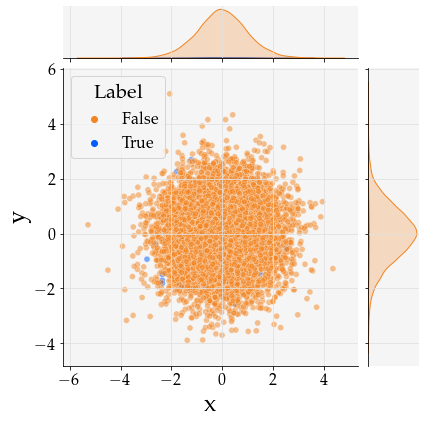

2021-05-24 18:50:45,599 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:50:45,600 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:50:45,600 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:50:45,601 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:50:45,602 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:50:45,602 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:50:45,603 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:50:45,603 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:50:45,604 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:50:45,604 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 

2021-05-24 18:50:45,640 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 18:50:45,642 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:50:45,642 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:50:45,643 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:50:45,643 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:50:45,643 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:50:45,644 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:50:45,644 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:50:45,644 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:50:45,645 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:

2021-05-24 18:50:45,689 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:50:45,690 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:50:45,690 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/129c56a1b99ba53bbcb35940a58e704b.dvi
2021-05-24 18:50:45,691 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:50:45,692 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:50:45,692 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:50:45,692 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:50:45,693 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:50:45,693 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:50:45,693 - DEBUG - Textile font is not compatible with

2021-05-24 18:50:45,729 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:50:45,729 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:50:45,730 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:50:45,730 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:50:45,730 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 18:50:45,731 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:50:45,734 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:50:45,734 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:50:45,734 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:50:45,735 - DEBUG - family: sans-serif, font: Computer Modern Sans Se

2021-05-24 18:50:45,782 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:50:45,782 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:50:45,783 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:50:45,783 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:50:45,783 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:50:45,783 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:50:45,784 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e398d07b0d52461180ba9f5bce00f37a.dvi
2021-05-24 18:50:45,785 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:50:45,786 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:50:45,787 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24

2021-05-24 18:50:46,178 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:50:46,178 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:50:46,178 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:50:46,179 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:50:46,179 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:50:46,180 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:50:46,180 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:50:46,180 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:50:46,181 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 18:50:46,181 - DEBUG - Dvi._xxx: encountered special: papersize=5203.

2021-05-24 18:50:46,214 - DEBUG - Assigning font /b'F1' = b'cmsy10' (dvi)
2021-05-24 18:50:46,215 - DEBUG - Assigning font /b'F2' = b'pplr8r' (dvi)
2021-05-24 18:50:46,217 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:50:46,217 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:50:46,217 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:50:46,218 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:50:46,218 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:50:46,218 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:50:46,218 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:50:46,219 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:50:46,219 - DEBUG - Bitstream Vera Sans Mono font is not compatible wit

2021-05-24 18:50:46,258 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:50:46,259 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/23bf86614c5b9fe7dd956d1ac7d6a2ea.dvi
2021-05-24 18:50:46,260 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:50:46,262 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:50:46,263 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:50:46,263 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:50:46,263 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:50:46,263 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:50:46,264 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:50:46,264 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', 

2021-05-24 18:50:46,298 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:50:46,298 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:50:46,298 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:50:46,299 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 18:50:46,301 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:50:46,302 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:50:46,302 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:50:46,303 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:50:46,303 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:50:46,303 - DEBUG - Apple Chancery font is not compat

2021-05-24 18:50:47,002 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:50:47,002 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 18:50:47,003 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:50:47,004 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:50:47,004 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:50:47,006 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:50:47,008 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:50:47,009 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:50:47,009 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:50:47,010 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', 

2021-05-24 18:50:47,052 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:50:47,053 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/129c56a1b99ba53bbcb35940a58e704b.dvi
2021-05-24 18:50:47,053 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:50:47,055 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:50:47,056 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:50:47,056 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:50:47,057 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:50:47,057 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:50:47,058 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:50:47,058 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', 

2021-05-24 18:50:47,094 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:50:47,094 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:50:47,094 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:50:47,095 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:50:47,095 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:50:47,096 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:50:47,096 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:50:47,096 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/98ad7ae73d7aa1b6937a42fda9087332.dvi
2021-05-24 18:50:47,097 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:50:47,099 - DEBUG - family: serif, font: Palatino, info

2021-05-24 18:50:47,140 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:50:47,140 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:50:47,141 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:50:47,141 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:50:47,141 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:50:47,141 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:50:47,142 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:50:47,143 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 18:50:47,143 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:50:47,144 - DEBUG - family: serif, font: Palatino, info

2021-05-24 18:50:47,182 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:50:47,183 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:50:47,183 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:50:47,184 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:50:47,184 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:50:47,184 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:50:47,185 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:50:47,185 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:50:47,186 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:50:47,186 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/98ad7ae73d7aa1b6937a42fda9087332.dv

2021-05-24 18:50:47,227 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:50:47,227 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:50:47,228 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:50:47,228 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:50:47,229 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:50:47,229 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:50:47,231 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:50:47,232 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:50:47,232 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:50:47,233 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 

2021-05-24 18:50:47,271 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/c56347dc1b2b2ad24f964fc0646393ef.dvi
2021-05-24 18:50:47,272 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:50:47,274 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:50:47,274 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:50:47,275 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:50:47,275 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:50:47,275 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:50:47,275 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:50:47,276 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:50:47,276 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:

2021-05-24 18:50:47,349 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:50:47,349 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:50:47,350 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:50:47,350 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:50:47,351 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:50:47,351 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:50:47,352 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:50:47,352 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:50:47,352 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:50:47,353 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 

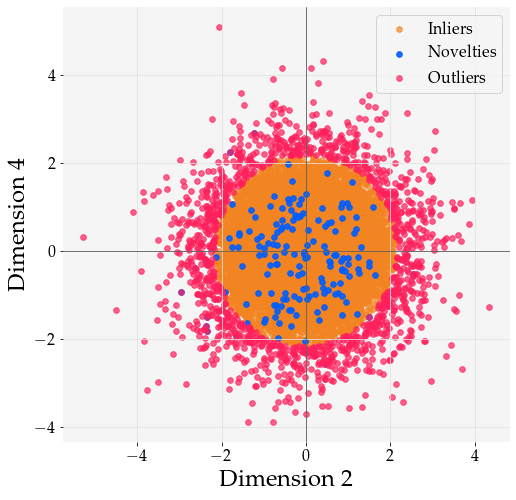

2021-05-24 18:50:47,513 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:50:47,513 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:50:47,513 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:50:47,514 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:50:47,514 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:50:47,514 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:50:47,514 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:50:47,515 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:50:47,515 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:50:47,515 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 

2021-05-24 18:50:47,545 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 18:50:47,547 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:50:47,547 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:50:47,548 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:50:47,548 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:50:47,549 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:50:47,549 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:50:47,550 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:50:47,550 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:50:47,550 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:

2021-05-24 18:50:47,593 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:50:47,593 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:50:47,593 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/c3ec0b22b0b6cb3f95e221e809e07549.dvi
2021-05-24 18:50:47,594 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:50:47,597 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:50:47,598 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:50:47,598 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:50:47,598 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:50:47,600 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:50:47,601 - DEBUG - Textile font is not compatible with

2021-05-24 18:50:47,636 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:50:47,637 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:50:47,637 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:50:47,637 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:50:47,638 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 18:50:47,639 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:50:47,639 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:50:47,640 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:50:47,640 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:50:47,640 - DEBUG - family: sans-serif, font: Computer Modern Sans Se

2021-05-24 18:50:47,684 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:50:47,684 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:50:47,685 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:50:47,685 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:50:47,686 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:50:47,686 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:50:47,686 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/bd1bcdde0898d52b4c77e7793da1e4d5.dvi
2021-05-24 18:50:47,687 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:50:47,735 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:50:47,736 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24

2021-05-24 18:50:47,771 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:50:47,771 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:50:47,771 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:50:47,772 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:50:47,772 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:50:47,772 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:50:47,772 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:50:47,773 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:50:47,774 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 18:50:47,774 - DEBUG - Dvi._xxx: encountered special: papersize=5203.

2021-05-24 18:50:47,811 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/2f554728ce2be6dc9209a89cf3eb6c0d.dvi
2021-05-24 18:50:47,812 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:50:47,814 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:50:47,816 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:50:47,816 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:50:47,817 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:50:47,817 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:50:47,817 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:50:47,818 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:50:47,818 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:

2021-05-24 18:50:47,856 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:50:47,856 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:50:47,857 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/c3ec0b22b0b6cb3f95e221e809e07549.dvi
2021-05-24 18:50:47,857 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:50:47,858 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:50:47,859 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:50:47,859 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:50:47,860 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:50:47,860 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:50:47,860 - DEBUG - Textile font is not compatible with

2021-05-24 18:50:47,897 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:50:47,898 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:50:47,898 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:50:47,899 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:50:47,899 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 18:50:47,900 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:50:47,900 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:50:47,901 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:50:47,901 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:50:47,902 - DEBUG - family: sans-serif, font: Computer Modern Sans Se

2021-05-24 18:50:47,940 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:50:47,940 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:50:47,941 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:50:47,941 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:50:47,942 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:50:47,942 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:50:47,943 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/6134acbfb19d192b077a5db8a0594e2a.dvi
2021-05-24 18:50:47,943 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:50:47,944 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:50:47,944 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24

2021-05-24 18:50:47,993 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:50:47,994 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:50:47,994 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:50:47,996 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:50:47,997 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:50:47,997 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:50:47,998 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:50:47,998 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:50:47,999 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/35392782795f958f58e110367dd9b16a.dvi
2021-05-24 18:50:48,000 - DEBUG - Dvi._xxx: encountered special: papersize=5203.

2021-05-24 18:50:48,385 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:50:48,386 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:50:48,386 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:50:48,386 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:50:48,387 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:50:48,387 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:50:48,388 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:50:48,388 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:50:48,388 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:50:48,388 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dv

2021-05-24 18:50:48,425 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:50:48,425 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:50:48,426 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:50:48,426 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:50:48,426 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:50:48,428 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:50:48,428 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:50:48,428 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:50:48,429 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:50:48,429 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/129c56a1b99ba53bbcb35940a58e704b.dv

2021-05-24 18:50:48,469 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:50:48,469 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:50:48,469 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:50:48,470 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:50:48,470 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:50:48,470 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:50:48,471 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:50:48,471 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:50:48,471 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:50:48,472 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 

2021-05-24 18:50:48,510 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:50:48,510 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:50:48,511 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/c3ec0b22b0b6cb3f95e221e809e07549.dvi
2021-05-24 18:50:48,512 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:50:48,512 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:50:48,513 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:50:48,513 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:50:48,513 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:50:48,514 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:50:48,514 - DEBUG - Textile font is not compatible with

2021-05-24 18:50:48,549 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:50:48,549 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:50:48,549 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:50:48,549 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:50:48,550 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 18:50:48,550 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:50:48,551 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:50:48,551 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:50:48,554 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:50:48,554 - DEBUG - family: sans-serif, font: Computer Modern Sans Se

2021-05-24 18:50:48,587 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/d57805ca30df78f885241e6b3aa903c5.dvi
2021-05-24 18:50:48,588 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:50:48,589 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:50:48,590 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:50:48,590 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:50:48,590 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:50:48,591 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:50:48,591 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:50:48,591 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:50:48,591 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:

2021-05-24 18:50:48,627 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:50:48,627 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:50:48,628 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:50:48,628 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:50:48,629 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:50:48,629 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:50:48,629 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:50:48,630 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:50:48,631 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/522741de97037f716b6db38352a5dae1.dvi
2021-05-24 18:50:48,634 - DEBUG - Dvi._xxx: encountered special: papersize=5203.

2021-05-24 18:50:48,680 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:50:48,683 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:50:48,683 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:50:48,683 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:50:48,684 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:50:48,684 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:50:48,684 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:50:48,685 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:50:48,686 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:50:48,686 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 

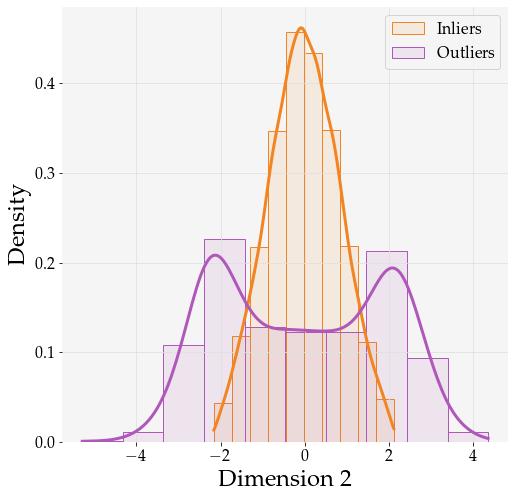

2021-05-24 18:50:48,819 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:50:48,820 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:50:48,820 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:50:48,821 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:50:48,821 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:50:48,822 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:50:48,822 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:50:48,822 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:50:48,822 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:50:48,823 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 

2021-05-24 18:50:48,857 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 18:50:48,858 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:50:48,858 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:50:48,859 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:50:48,859 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:50:48,859 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:50:48,859 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:50:48,860 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:50:48,860 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:50:48,860 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:

2021-05-24 18:50:48,905 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:50:48,905 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:50:48,906 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/c3ec0b22b0b6cb3f95e221e809e07549.dvi
2021-05-24 18:50:48,906 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:50:48,908 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:50:48,908 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:50:48,908 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:50:48,909 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:50:48,909 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:50:48,909 - DEBUG - Textile font is not compatible with

2021-05-24 18:50:48,945 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:50:48,945 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:50:48,945 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:50:48,946 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:50:48,946 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 18:50:48,947 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:50:48,948 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:50:48,949 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:50:48,949 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:50:48,949 - DEBUG - family: sans-serif, font: Computer Modern Sans Se

2021-05-24 18:50:48,997 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:50:48,997 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:50:48,998 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:50:48,998 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:50:48,999 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:50:48,999 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:50:49,000 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/bd1bcdde0898d52b4c77e7793da1e4d5.dvi
2021-05-24 18:50:49,000 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:50:49,048 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:50:49,049 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24

2021-05-24 18:50:49,085 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:50:49,085 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:50:49,086 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:50:49,086 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:50:49,087 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:50:49,087 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:50:49,087 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:50:49,088 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:50:49,088 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 18:50:49,089 - DEBUG - Dvi._xxx: encountered special: papersize=5203.

2021-05-24 18:50:49,123 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/2f554728ce2be6dc9209a89cf3eb6c0d.dvi
2021-05-24 18:50:49,124 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:50:49,126 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:50:49,126 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:50:49,126 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:50:49,127 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:50:49,127 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:50:49,127 - DEBUG - Textile font is not compatible with usetex.
IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`

2021-05-24 18:50:52,879 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:50:52,880 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:50:52,880 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:50:52,880 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:50:52,881 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:50:52,881 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:50:52,881 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:50:52,882 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:50:52,882 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:50:52,882 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:50:52,882 - DEBUG - fam

2021-05-24 18:50:52,919 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:50:52,919 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/6134acbfb19d192b077a5db8a0594e2a.dvi
2021-05-24 18:50:52,919 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:50:52,922 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:50:52,923 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:50:52,923 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:50:52,924 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:50:52,925 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:50:52,925 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:50:52,926 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', 

2021-05-24 18:50:52,972 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:50:52,972 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:50:52,972 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:50:52,973 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/da12be043bf66fa494ffe6a28495e74d.dvi
2021-05-24 18:50:52,973 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:50:52,974 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:50:52,975 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:50:52,975 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:50:52,975 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:50:52,976 - DEBUG - Apple Chancery font is not compat

2021-05-24 18:50:53,114 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:50:53,115 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:50:53,115 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:50:53,115 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:50:53,116 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:50:53,116 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/6134acbfb19d192b077a5db8a0594e2a.dvi
2021-05-24 18:50:53,117 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:50:53,118 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:50:53,118 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:50:53,119 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-

2021-05-24 18:50:53,401 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:50:53,401 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:50:53,401 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:50:53,402 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:50:53,402 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:50:53,402 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:50:53,402 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:50:53,403 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:50:53,403 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:50:53,404 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/2f554728ce2be6dc9209a89cf3eb6c0d.dv

2021-05-24 18:50:53,439 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:50:53,443 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:50:53,443 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:50:53,443 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:50:53,444 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:50:53,444 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:50:53,444 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:50:53,445 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:50:53,445 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:50:53,445 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:50:53,446 - DEBUG - fam

2021-05-24 18:50:53,484 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:50:53,484 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 18:50:53,485 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:50:53,486 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:50:53,487 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:50:53,487 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:50:53,488 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:50:53,488 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:50:53,488 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:50:53,489 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', 

2021-05-24 18:50:53,528 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:50:53,528 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:50:53,528 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:50:53,529 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/6eafde7961efc9437c68c146d179b6d1.dvi
2021-05-24 18:50:53,530 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:50:53,531 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:50:53,532 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:50:53,532 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:50:53,533 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:50:53,533 - DEBUG - Apple Chancery font is not compat

2021-05-24 18:50:54,660 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:50:54,660 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:50:54,661 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:50:54,661 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:50:54,661 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:50:54,661 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:50:54,662 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:50:54,662 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:50:54,662 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:50:54,663 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 

2021-05-24 18:50:54,696 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 18:50:54,697 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:50:54,698 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:50:54,698 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:50:54,698 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:50:54,698 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:50:54,699 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:50:54,699 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:50:54,699 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:50:54,699 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:

2021-05-24 18:50:54,739 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:50:54,739 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:50:54,739 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:50:54,740 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/6134acbfb19d192b077a5db8a0594e2a.dvi
2021-05-24 18:50:54,741 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:50:54,741 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:50:54,742 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:50:54,742 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:50:54,742 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:50:54,742 - DEBUG - Apple Chancery font is not compat

2021-05-24 18:50:54,779 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:50:54,780 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:50:54,780 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:50:54,780 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:50:54,781 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:50:54,781 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 18:50:54,782 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:50:54,783 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:50:54,783 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:50:54,784 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-

2021-05-24 18:50:54,817 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:50:54,817 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:50:54,818 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:50:54,818 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:50:54,819 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:50:54,820 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:50:54,820 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:50:54,820 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/3ce07bc18b31318dfb8589ef3427ba04.dvi
2021-05-24 18:50:54,821 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:50:54,824 - DEBUG - family: serif, font: Palatino, info

2021-05-24 18:50:54,861 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:50:54,861 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:50:54,863 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:50:54,863 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:50:54,864 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:50:54,865 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:50:54,868 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:50:54,868 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:50:54,868 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:50:54,869 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/02f722d3f1fe0334c4218f7b28d9566d.dv

2021-05-24 18:50:55,011 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:50:55,017 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:50:55,017 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:50:55,018 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:50:55,018 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:50:55,018 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:50:55,018 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:50:55,020 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:50:55,020 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:50:55,021 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:50:55,021 - DEBUG - fam

2021-05-24 18:50:55,268 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:50:55,268 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:50:55,268 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:50:55,269 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:50:55,270 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:50:55,270 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:50:55,271 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:50:55,271 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:50:55,271 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:50:55,271 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 

2021-05-24 18:50:55,307 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:50:55,307 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:50:55,308 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:50:55,308 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:50:55,308 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:50:55,308 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:50:55,309 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:50:55,309 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:50:55,309 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:50:55,310 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 

2021-05-24 18:50:55,350 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:50:55,351 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:50:55,351 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:50:55,352 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:50:55,352 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:50:55,353 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:50:55,353 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:50:55,353 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:50:55,354 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:50:55,354 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 

2021-05-24 18:50:55,389 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:50:55,390 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:50:55,390 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:50:55,390 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/129c56a1b99ba53bbcb35940a58e704b.dvi
2021-05-24 18:50:55,391 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:50:55,392 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:50:55,393 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:50:55,393 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:50:55,393 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:50:55,393 - DEBUG - Apple Chancery font is not compat

2021-05-24 18:50:55,430 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:50:55,430 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:50:55,430 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:50:55,431 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:50:55,431 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:50:55,432 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 18:50:55,432 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:50:55,433 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:50:55,433 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:50:55,434 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-

2021-05-24 18:50:55,473 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/2f554728ce2be6dc9209a89cf3eb6c0d.dvi
2021-05-24 18:50:55,474 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:50:55,475 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:50:55,475 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:50:55,476 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:50:55,476 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:50:55,476 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:50:55,476 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:50:55,477 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:50:55,477 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:

2021-05-24 18:50:55,513 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:50:55,514 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:50:55,517 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:50:55,518 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:50:55,518 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:50:55,519 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:50:55,519 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:50:55,520 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:50:55,520 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/14896f6a4e63cfb45d66ae52288a88e7.dvi
2021-05-24 18:50:55,521 - DEBUG - Dvi._xxx: encountered special: papersize=5203.

2021-05-24 18:50:55,654 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:50:55,655 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:50:55,655 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:50:55,655 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:50:55,655 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:50:55,656 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:50:55,656 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:50:55,656 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:50:55,656 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:50:55,657 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 

<Figure size 720x720 with 0 Axes>

2021-05-24 18:50:55,825 - DEBUG - top of axes not in the figure, so title not moved
2021-05-24 18:50:55,832 - DEBUG - top of axes not in the figure, so title not moved
2021-05-24 18:50:55,894 - DEBUG - top of axes not in the figure, so title not moved
2021-05-24 18:50:55,900 - DEBUG - top of axes not in the figure, so title not moved
2021-05-24 18:50:56,009 - DEBUG - top of axes not in the figure, so title not moved
2021-05-24 18:50:56,015 - DEBUG - top of axes not in the figure, so title not moved
2021-05-24 18:50:56,192 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:50:56,192 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:50:56,193 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:50:56,193 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:50:56,193 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-0

2021-05-24 18:50:56,220 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:50:56,221 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:50:56,221 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:50:56,221 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:50:56,221 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:50:56,222 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 18:50:56,223 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:50:56,223 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:50:56,224 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:50:56,224 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-

2021-05-24 18:50:56,257 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:50:56,258 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:50:56,258 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:50:56,258 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/3ce07bc18b31318dfb8589ef3427ba04.dvi
2021-05-24 18:50:56,259 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:50:56,260 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:50:56,261 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:50:56,261 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:50:56,261 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:50:56,262 - DEBUG - Apple Chancery font is not compat

2021-05-24 18:50:56,296 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:50:56,297 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:50:56,298 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:50:56,298 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:50:56,299 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:50:56,299 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:50:56,299 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:50:56,300 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:50:56,301 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:50:56,301 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:50:56,302 - DEBUG - fam

2021-05-24 18:50:56,337 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:50:56,338 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:50:56,338 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:50:56,339 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:50:56,339 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:50:56,339 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:50:56,339 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:50:56,340 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:50:56,340 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:50:56,341 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:50:56,341 - DEBUG - fam

2021-05-24 18:50:56,373 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:50:56,373 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:50:56,373 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:50:56,373 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:50:56,374 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:50:56,374 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:50:56,374 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:50:56,375 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:50:56,375 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:50:56,375 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 

2021-05-24 18:50:56,413 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:50:56,413 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:50:56,415 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:50:56,415 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:50:56,415 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:50:56,416 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:50:56,416 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:50:56,419 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:50:56,419 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:50:56,420 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 

2021-05-24 18:50:56,454 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:50:56,454 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:50:56,455 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:50:56,455 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:50:56,455 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:50:56,456 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/6eafde7961efc9437c68c146d179b6d1.dvi
2021-05-24 18:50:56,457 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:50:56,458 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:50:56,458 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:50:56,459 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-

2021-05-24 18:50:56,604 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:50:56,605 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:50:56,605 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:50:56,605 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:50:56,605 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:50:56,606 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:50:56,606 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:50:56,606 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:50:56,607 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:50:56,607 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 

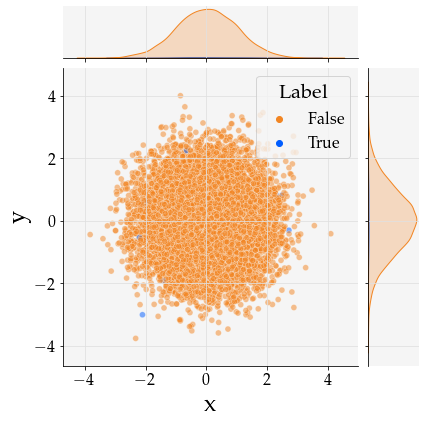

2021-05-24 18:50:56,702 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:50:56,703 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:50:56,703 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:50:56,704 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:50:56,704 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:50:56,704 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:50:56,704 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:50:56,705 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:50:56,705 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:50:56,705 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 

2021-05-24 18:50:56,741 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 18:50:56,742 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:50:56,742 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:50:56,743 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:50:56,743 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:50:56,743 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:50:56,744 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:50:56,744 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:50:56,744 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:50:56,744 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:

2021-05-24 18:50:56,776 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:50:56,777 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:50:56,777 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/2e65e9b695a94456b83fb58e8b9d15a2.dvi
2021-05-24 18:50:56,778 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:50:56,779 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:50:56,779 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:50:56,780 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:50:56,781 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:50:56,781 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:50:56,782 - DEBUG - Textile font is not compatible with

2021-05-24 18:50:56,829 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:50:56,830 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:50:56,830 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:50:56,831 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:50:56,831 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 18:50:56,832 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:50:56,832 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:50:56,832 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:50:56,833 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:50:56,833 - DEBUG - family: sans-serif, font: Computer Modern Sans Se

2021-05-24 18:50:56,865 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:50:56,866 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:50:56,866 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:50:56,866 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:50:56,867 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:50:56,867 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:50:56,867 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/68866aab584fc95b83a1baedea5abdb4.dvi
2021-05-24 18:50:56,868 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:50:56,870 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:50:56,870 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24

2021-05-24 18:50:56,907 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:50:56,907 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:50:56,907 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:50:56,908 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:50:56,908 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:50:56,908 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:50:56,909 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:50:56,909 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:50:56,909 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 18:50:56,910 - DEBUG - Dvi._xxx: encountered special: papersize=5203.

2021-05-24 18:50:56,954 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:50:56,954 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:50:56,954 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:50:56,955 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:50:56,955 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:50:56,955 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:50:56,956 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:50:56,956 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:50:56,956 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:50:56,956 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 

2021-05-24 18:50:57,384 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/129c56a1b99ba53bbcb35940a58e704b.dvi
2021-05-24 18:50:57,385 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:50:57,386 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:50:57,386 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:50:57,386 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:50:57,387 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:50:57,387 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:50:57,387 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:50:57,388 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:50:57,388 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:

2021-05-24 18:50:57,421 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:50:57,421 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:50:57,421 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 18:50:57,422 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:50:57,423 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:50:57,423 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:50:57,424 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:50:57,424 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:50:57,424 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:50:57,425 - DEBUG - Textile font is not compatible with

2021-05-24 18:50:57,457 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:50:57,457 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:50:57,458 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:50:57,458 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:50:57,458 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/a1989b0e82ab32b7b1a08bb5ee1fda2d.dvi
2021-05-24 18:50:57,459 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:50:57,460 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:50:57,460 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:50:57,460 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:50:57,462 - DEBUG - family: sans-serif, font: Computer Modern Sans Se

2021-05-24 18:50:57,505 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:50:57,505 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:50:57,505 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:50:57,506 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:50:57,506 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:50:57,506 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:50:57,506 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:50:57,507 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:50:57,508 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/2f554728ce2be6dc9209a89cf3eb6c0d.dvi
2021-05-24 18:50:57,508 - DEBUG - Dvi._xxx: encountered special: papersize=5203.

2021-05-24 18:50:57,547 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:50:57,548 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:50:57,549 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:50:57,549 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:50:57,550 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:50:57,550 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:50:57,550 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:50:57,551 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:50:57,551 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:50:57,551 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 

2021-05-24 18:50:57,586 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/3ce07bc18b31318dfb8589ef3427ba04.dvi
2021-05-24 18:50:57,587 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:50:57,588 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:50:57,589 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:50:57,589 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:50:57,589 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:50:57,589 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:50:57,590 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:50:57,590 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:50:57,590 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:

2021-05-24 18:50:58,272 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:50:58,272 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:50:58,272 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:50:58,273 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:50:58,273 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:50:58,273 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:50:58,273 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:50:58,274 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:50:58,274 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:50:58,274 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 

2021-05-24 18:50:58,462 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:50:58,462 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:50:58,462 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/08460d6eb1a42286cb5291bc6638723e.dvi
2021-05-24 18:50:58,464 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:50:58,464 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:50:58,465 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:50:58,465 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:50:58,465 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:50:58,466 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:50:58,466 - DEBUG - Textile font is not compatible with

2021-05-24 18:50:58,500 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:50:58,500 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:50:58,500 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:50:58,500 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:50:58,501 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 18:50:58,502 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:50:58,502 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:50:58,503 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:50:58,503 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:50:58,503 - DEBUG - family: sans-serif, font: Computer Modern Sans Se

2021-05-24 18:50:58,540 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:50:58,540 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:50:58,541 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:50:58,541 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:50:58,541 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:50:58,541 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:50:58,542 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/98ad7ae73d7aa1b6937a42fda9087332.dvi
2021-05-24 18:50:58,543 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:50:58,544 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:50:58,545 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24

2021-05-24 18:50:58,579 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:50:58,580 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:50:58,581 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:50:58,581 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:50:58,583 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:50:58,583 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:50:58,584 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:50:58,584 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:50:58,585 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:50:58,585 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 

2021-05-24 18:50:58,620 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:50:58,620 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:50:58,621 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:50:58,623 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:50:58,624 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:50:58,625 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:50:58,626 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:50:58,627 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:50:58,627 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:50:58,628 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 

2021-05-24 18:50:58,665 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:50:58,665 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:50:58,665 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:50:58,666 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/23bf86614c5b9fe7dd956d1ac7d6a2ea.dvi
2021-05-24 18:50:58,667 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:50:58,669 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:50:58,670 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:50:58,670 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:50:58,672 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:50:58,673 - DEBUG - Apple Chancery font is not compat

2021-05-24 18:50:58,708 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:50:58,709 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:50:58,709 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:50:58,709 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:50:58,710 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:50:58,711 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 18:50:58,711 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:50:58,712 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:50:58,712 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:50:58,712 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-

2021-05-24 18:50:58,751 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:50:58,751 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:50:58,752 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:50:58,752 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:50:58,753 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:50:58,753 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:50:58,753 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:50:58,754 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/2e65e9b695a94456b83fb58e8b9d15a2.dvi
2021-05-24 18:50:58,755 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:50:58,756 - DEBUG - family: serif, font: Palatino, info

2021-05-24 18:50:58,796 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:50:58,797 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:50:58,797 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:50:58,797 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:50:58,798 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:50:58,798 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:50:58,799 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:50:58,799 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:50:58,799 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:50:58,799 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 

2021-05-24 18:50:58,836 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/2f554728ce2be6dc9209a89cf3eb6c0d.dvi
2021-05-24 18:50:58,839 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:50:58,840 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:50:58,840 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:50:58,841 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:50:58,841 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:50:58,843 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:50:58,843 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:50:58,843 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:50:58,844 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:

2021-05-24 18:50:58,877 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:50:58,879 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:50:58,879 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:50:58,880 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:50:58,880 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:50:58,881 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:50:58,881 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/98ad7ae73d7aa1b6937a42fda9087332.dvi
2021-05-24 18:50:58,882 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:50:58,884 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:50:58,885 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24

2021-05-24 18:50:58,923 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:50:58,925 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:50:58,926 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:50:58,926 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:50:58,927 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:50:58,927 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:50:58,928 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 18:50:58,928 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:50:58,930 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:50:58,931 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24

2021-05-24 18:50:59,015 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:50:59,015 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:50:59,015 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:50:59,016 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e398d07b0d52461180ba9f5bce00f37a.dvi
2021-05-24 18:50:59,017 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:50:59,022 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:50:59,023 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:50:59,023 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:50:59,024 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:50:59,024 - DEBUG - Apple Chancery font is not compat

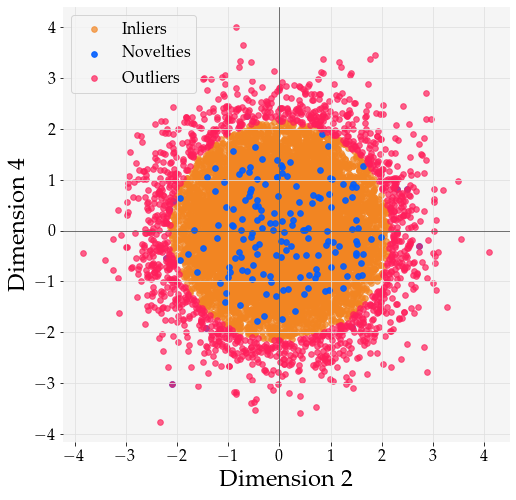

2021-05-24 18:50:59,185 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:50:59,185 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:50:59,186 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:50:59,186 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:50:59,186 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:50:59,187 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:50:59,187 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:50:59,187 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:50:59,187 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:50:59,188 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 

2021-05-24 18:50:59,222 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 18:50:59,222 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:50:59,223 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:50:59,223 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:50:59,224 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:50:59,224 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:50:59,225 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:50:59,225 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:50:59,225 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:50:59,226 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:

2021-05-24 18:50:59,262 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:50:59,263 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:50:59,263 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/2e65e9b695a94456b83fb58e8b9d15a2.dvi
2021-05-24 18:50:59,264 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:50:59,265 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:50:59,265 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:50:59,266 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:50:59,266 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:50:59,266 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:50:59,267 - DEBUG - Textile font is not compatible with

2021-05-24 18:50:59,314 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:50:59,315 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:50:59,316 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:50:59,316 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:50:59,316 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 18:50:59,317 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:50:59,318 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:50:59,318 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:50:59,318 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:50:59,319 - DEBUG - family: sans-serif, font: Computer Modern Sans Se

2021-05-24 18:50:59,359 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:50:59,360 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:50:59,361 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:50:59,361 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:50:59,362 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:50:59,362 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:50:59,363 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/50b063103f9808b81526cf7a814e0d24.dvi
2021-05-24 18:50:59,363 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:50:59,365 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:50:59,365 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24

2021-05-24 18:50:59,401 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:50:59,402 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:50:59,402 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:50:59,404 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:50:59,405 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:50:59,405 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:50:59,406 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:50:59,406 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:50:59,406 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 18:50:59,407 - DEBUG - Dvi._xxx: encountered special: papersize=5203.

2021-05-24 18:50:59,445 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:50:59,446 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:50:59,446 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:50:59,446 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:50:59,447 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:50:59,447 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:50:59,447 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:50:59,449 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:50:59,450 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:50:59,450 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 

2021-05-24 18:50:59,550 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/08460d6eb1a42286cb5291bc6638723e.dvi
2021-05-24 18:50:59,551 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:50:59,552 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:50:59,552 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:50:59,553 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:50:59,553 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:50:59,554 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:50:59,554 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:50:59,555 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:50:59,555 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:

2021-05-24 18:50:59,597 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:50:59,597 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:50:59,597 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 18:50:59,598 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:50:59,598 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:50:59,599 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:50:59,599 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:50:59,600 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:50:59,600 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:50:59,600 - DEBUG - Textile font is not compatible with

2021-05-24 18:50:59,643 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:50:59,643 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:50:59,643 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:50:59,644 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:50:59,645 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/98ad7ae73d7aa1b6937a42fda9087332.dvi
2021-05-24 18:50:59,645 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:50:59,648 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:50:59,648 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:50:59,648 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:50:59,649 - DEBUG - family: sans-serif, font: Computer Modern Sans Se

2021-05-24 18:50:59,689 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:50:59,689 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:50:59,690 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:50:59,690 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:50:59,690 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:50:59,690 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:50:59,691 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:50:59,691 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:50:59,692 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/2e65e9b695a94456b83fb58e8b9d15a2.dvi
2021-05-24 18:50:59,693 - DEBUG - Dvi._xxx: encountered special: papersize=5203.

2021-05-24 18:51:00,421 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:00,422 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:00,422 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:51:00,422 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/68866aab584fc95b83a1baedea5abdb4.dvi
2021-05-24 18:51:00,424 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:51:00,425 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:00,426 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:00,426 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:00,426 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:00,427 - DEBUG - Apple Chancery font is not compat

2021-05-24 18:51:00,459 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:00,460 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:51:00,460 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:00,460 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:00,461 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:51:00,461 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 18:51:00,462 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:51:00,463 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:00,463 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:00,463 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-

2021-05-24 18:51:00,497 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:00,497 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:00,497 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:51:00,499 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/08460d6eb1a42286cb5291bc6638723e.dvi
2021-05-24 18:51:00,501 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:51:00,503 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:00,504 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:00,506 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:00,506 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:00,506 - DEBUG - Apple Chancery font is not compat

2021-05-24 18:51:00,540 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:00,540 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:00,540 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:00,540 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:51:00,541 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:00,541 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:51:00,542 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:00,542 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:00,542 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:51:00,542 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/a0ac8a6b3c6d73399d7c81ab1b857e23.dv

2021-05-24 18:51:00,577 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:51:00,577 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:00,578 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:00,578 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:51:00,578 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/6134acbfb19d192b077a5db8a0594e2a.dvi
2021-05-24 18:51:00,579 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:51:00,579 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:00,580 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:00,580 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:00,580 - DEBUG - family: sans-serif, font: Computer Modern Sans Se

2021-05-24 18:51:00,618 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:51:00,618 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:00,618 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:00,619 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:51:00,620 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/7fb174ba49f9be712fb633a8577762e4.dvi
2021-05-24 18:51:00,621 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:51:00,622 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:00,622 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:00,623 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:00,623 - DEBUG - family: sans-serif, font: Computer Modern Sans Se

2021-05-24 18:51:00,658 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:51:00,659 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:00,659 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:51:00,659 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:00,660 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:00,660 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:51:00,660 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 18:51:00,661 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:51:00,662 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:00,662 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24

2021-05-24 18:51:00,697 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:00,697 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:00,697 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:51:00,697 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:00,698 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:51:00,698 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:00,698 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:00,700 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:51:00,701 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/eb1fa71f0c6f0e7fa74f42bac9086c29.dvi
2021-05-24 18:51:00,701 - DEBUG - Dvi._xxx: encountered special: papersize=5203.

2021-05-24 18:51:00,744 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:00,744 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:00,744 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:51:00,745 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:00,745 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:00,745 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:00,746 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:00,746 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:51:00,746 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:00,747 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 

2021-05-24 18:51:00,783 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:00,783 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:00,784 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:00,784 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:51:00,785 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:00,785 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:51:00,785 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:00,786 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:00,787 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:51:00,787 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 

2021-05-24 18:51:00,826 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:51:00,826 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:00,826 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:00,826 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:51:00,827 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/522741de97037f716b6db38352a5dae1.dvi
2021-05-24 18:51:00,828 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:51:00,830 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:00,830 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:00,831 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:00,831 - DEBUG - family: sans-serif, font: Computer Modern Sans Se

2021-05-24 18:51:00,877 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:51:00,877 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:00,878 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:00,878 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:51:00,879 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:00,879 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:00,880 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:00,880 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:00,880 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:51:00,881 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 

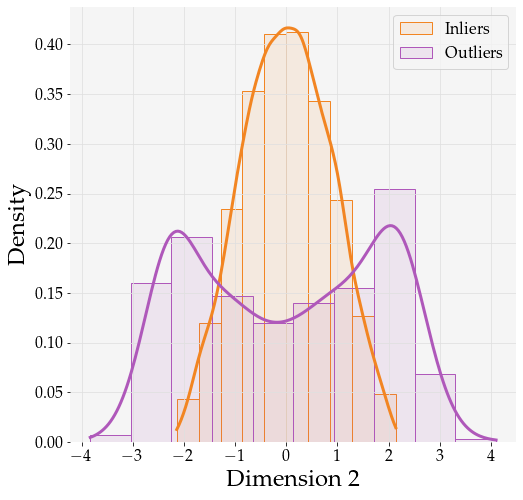

2021-05-24 18:51:01,037 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:01,037 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:01,037 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:01,038 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:01,038 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:51:01,038 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:01,038 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:51:01,039 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:01,039 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:01,039 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 

2021-05-24 18:51:01,721 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:51:01,721 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/c3ec0b22b0b6cb3f95e221e809e07549.dvi
2021-05-24 18:51:01,722 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:51:01,724 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:01,724 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:01,724 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:01,725 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:01,725 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:51:01,725 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:01,726 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', 

2021-05-24 18:51:01,768 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:01,768 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:01,769 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:51:01,769 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 18:51:01,770 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:51:01,771 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:01,771 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:01,772 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:01,772 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:01,772 - DEBUG - Apple Chancery font is not compat

2021-05-24 18:51:01,816 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:51:01,818 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:01,818 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:01,818 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:01,819 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:01,819 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:51:01,819 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:01,820 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:51:01,820 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:01,820 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:01,821 - DEBUG - fam

2021-05-24 18:51:01,861 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:51:01,861 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:01,862 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:51:01,862 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:01,862 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:01,864 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:51:01,864 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/522741de97037f716b6db38352a5dae1.dvi
2021-05-24 18:51:01,865 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:51:01,867 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:01,867 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24

2021-05-24 18:51:01,917 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:51:01,918 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:01,918 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:51:01,919 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:01,919 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:01,920 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:51:01,920 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:01,920 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:01,920 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:01,921 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 

2021-05-24 18:51:02,017 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:51:02,017 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:02,018 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:51:02,018 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:02,018 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:02,019 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:51:02,019 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/3ce07bc18b31318dfb8589ef3427ba04.dvi
2021-05-24 18:51:02,020 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:51:02,021 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:02,021 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24

2021-05-24 18:51:02,052 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:02,053 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:02,053 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:51:02,053 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:02,053 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:51:02,054 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:02,054 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:02,054 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:51:02,055 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 18:51:02,056 - DEBUG - Dvi._xxx: encountered special: papersize=5203.

2021-05-24 18:51:02,094 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:02,094 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:02,095 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:51:02,095 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:02,096 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:51:02,096 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:02,096 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:02,097 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:51:02,098 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/129c56a1b99ba53bbcb35940a58e704b.dvi
2021-05-24 18:51:02,098 - DEBUG - Dvi._xxx: encountered special: papersize=5203.

2021-05-24 18:51:02,136 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:02,136 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:02,136 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:51:02,137 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:02,137 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:02,137 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:02,137 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:02,138 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:51:02,139 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:02,139 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 

2021-05-24 18:51:02,179 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:02,179 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:02,179 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:02,179 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:51:02,180 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:02,180 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:51:02,181 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:02,181 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:02,181 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:51:02,182 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 

2021-05-24 18:51:02,221 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:51:02,222 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:02,222 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:51:02,222 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:02,223 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:02,226 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:51:02,226 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/c3ec0b22b0b6cb3f95e221e809e07549.dvi
2021-05-24 18:51:02,227 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:51:02,228 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:02,228 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24

2021-05-24 18:51:02,267 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:02,267 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:02,268 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:51:02,268 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:02,268 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:51:02,269 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:02,269 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:02,269 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:51:02,270 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 18:51:02,271 - DEBUG - Dvi._xxx: encountered special: papersize=5203.

2021-05-24 18:51:02,309 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:02,310 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:02,311 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:51:02,311 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/d57805ca30df78f885241e6b3aa903c5.dvi
2021-05-24 18:51:02,313 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:51:02,314 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:02,315 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:02,315 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:02,315 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:02,316 - DEBUG - Apple Chancery font is not compat

2021-05-24 18:51:02,357 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:51:02,358 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:02,358 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:02,359 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:02,359 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:02,359 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:51:02,360 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:02,360 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:51:02,361 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:02,361 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 

2021-05-24 18:51:02,404 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:51:02,406 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:02,407 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:02,407 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:02,407 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:02,407 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:51:02,408 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:02,408 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:51:02,409 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:02,409 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:02,410 - DEBUG - fam

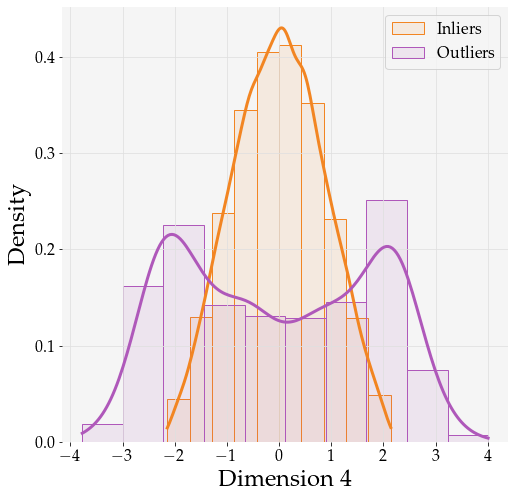

2021-05-24 18:51:05,255 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:05,256 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:05,256 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:05,257 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:05,257 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:51:05,257 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:05,258 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:51:05,258 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:05,258 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:05,259 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 

2021-05-24 18:51:05,290 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 18:51:05,291 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:51:05,292 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:05,292 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:05,292 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:05,293 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:05,293 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:51:05,293 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:05,294 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:51:05,294 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:

2021-05-24 18:51:05,332 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:05,332 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:51:05,332 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e05233931a48bf07741112bbe1445193.dvi
2021-05-24 18:51:05,333 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:51:05,339 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:05,340 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:05,340 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:05,340 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:05,341 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:51:05,341 - DEBUG - Textile font is not compatible with

2021-05-24 18:51:05,380 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:51:05,381 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:05,381 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:05,381 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:51:05,382 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 18:51:05,382 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:51:05,383 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:05,384 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:05,384 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:05,384 - DEBUG - family: sans-serif, font: Computer Modern Sans Se

2021-05-24 18:51:05,425 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:51:05,425 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:05,426 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:51:05,427 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:05,427 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:05,427 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:51:05,428 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/14896f6a4e63cfb45d66ae52288a88e7.dvi
2021-05-24 18:51:05,428 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:51:05,436 - DEBUG - top of axes not in the figure, so title not moved
2021-05-24 18:51:05,442 - DEBUG - top of axes not in the figure, so title not moved
2021-05-24 18:51:05,684 - DEB

2021-05-24 18:51:05,716 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:05,716 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:05,717 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:05,717 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:05,717 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:51:05,717 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:05,718 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:51:05,718 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:05,718 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:05,718 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 

2021-05-24 18:51:05,753 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 18:51:05,754 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:51:05,755 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:05,755 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:05,755 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:05,756 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:05,756 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:51:05,756 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:05,756 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:51:05,757 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:

2021-05-24 18:51:05,789 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:05,790 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:51:05,790 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/2e65e9b695a94456b83fb58e8b9d15a2.dvi
2021-05-24 18:51:05,791 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:51:05,792 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:05,792 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:05,793 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:05,793 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:05,793 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:51:05,794 - DEBUG - Textile font is not compatible with

2021-05-24 18:51:05,833 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:51:05,834 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:05,834 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:05,834 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:51:05,834 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 18:51:05,835 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:51:05,836 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:05,836 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:05,837 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:05,839 - DEBUG - family: sans-serif, font: Computer Modern Sans Se

2021-05-24 18:51:06,962 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:51:06,963 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:06,963 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:06,963 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:06,964 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:06,964 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:51:06,964 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:06,965 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:51:06,965 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:06,966 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:06,966 - DEBUG - fam

2021-05-24 18:51:06,994 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:51:06,995 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/98ad7ae73d7aa1b6937a42fda9087332.dvi
2021-05-24 18:51:06,996 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:51:06,998 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:06,998 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:06,998 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:06,999 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:06,999 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:51:06,999 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:07,000 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', 

2021-05-24 18:51:07,039 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:07,040 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:51:07,040 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:07,040 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:07,040 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:51:07,041 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e05233931a48bf07741112bbe1445193.dvi
2021-05-24 18:51:07,041 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:51:07,042 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:07,043 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:07,043 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-

2021-05-24 18:51:07,078 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:07,079 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:51:07,079 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:07,079 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:51:07,080 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:07,081 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:07,081 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:51:07,081 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/2f554728ce2be6dc9209a89cf3eb6c0d.dvi
2021-05-24 18:51:07,082 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:51:07,084 - DEBUG - family: serif, font: Palatino, info

2021-05-24 18:51:07,122 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:07,123 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:07,123 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:07,124 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:51:07,125 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:07,125 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:51:07,125 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:07,125 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:07,126 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:51:07,126 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/2f554728ce2be6dc9209a89cf3eb6c0d.dv

2021-05-24 18:51:07,169 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:51:07,170 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:07,171 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:07,171 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:07,171 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:07,172 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:51:07,172 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:07,172 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:51:07,173 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:07,173 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:07,173 - DEBUG - fam

2021-05-24 18:51:07,328 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:51:07,328 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/c5e8f6a64eefb12ed54839f8f9faa89a.dvi
2021-05-24 18:51:07,329 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:51:07,335 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:07,335 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:07,335 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:07,336 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:07,337 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:51:07,337 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:07,337 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', 

2021-05-24 18:51:07,578 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 18:51:07,579 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:51:07,579 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:07,579 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:07,580 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:07,580 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:07,580 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:51:07,580 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:07,581 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:51:07,581 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:

2021-05-24 18:51:07,622 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/129c56a1b99ba53bbcb35940a58e704b.dvi
2021-05-24 18:51:07,622 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:51:07,624 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:07,624 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:07,625 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:07,625 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:07,625 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:51:07,625 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:07,626 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:51:07,627 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:

2021-05-24 18:51:07,659 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:51:07,660 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:07,660 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:51:07,661 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:07,661 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:07,662 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:51:07,662 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/98ad7ae73d7aa1b6937a42fda9087332.dvi
2021-05-24 18:51:07,663 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:51:07,665 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:07,666 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24

2021-05-24 18:51:07,704 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:51:07,704 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:07,705 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:51:07,706 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:07,706 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:07,706 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:51:07,707 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 18:51:07,707 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:51:07,708 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:07,708 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24

2021-05-24 18:51:07,747 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:07,747 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:07,747 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:51:07,748 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:07,748 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:51:07,748 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:07,748 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:07,749 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:51:07,749 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/98ad7ae73d7aa1b6937a42fda9087332.dvi
2021-05-24 18:51:07,750 - DEBUG - Dvi._xxx: encountered special: papersize=5203.

2021-05-24 18:51:07,795 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:07,795 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:07,795 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:51:07,796 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:07,796 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:07,796 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:07,797 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:07,797 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:51:07,797 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:07,798 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 

2021-05-24 18:51:07,837 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:51:07,839 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:07,839 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:07,840 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:07,840 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:07,841 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:51:07,841 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:07,841 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:51:07,841 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:07,842 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:07,842 - DEBUG - fam

2021-05-24 18:51:07,988 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:51:07,988 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:07,989 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:07,989 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:07,990 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:07,990 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:51:07,990 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:07,991 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:51:07,991 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:07,991 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 

<Figure size 720x720 with 0 Axes>

2021-05-24 18:51:08,151 - DEBUG - top of axes not in the figure, so title not moved
2021-05-24 18:51:08,158 - DEBUG - top of axes not in the figure, so title not moved
2021-05-24 18:51:08,217 - DEBUG - top of axes not in the figure, so title not moved
2021-05-24 18:51:08,223 - DEBUG - top of axes not in the figure, so title not moved
2021-05-24 18:51:08,333 - DEBUG - top of axes not in the figure, so title not moved
2021-05-24 18:51:08,338 - DEBUG - top of axes not in the figure, so title not moved
2021-05-24 18:51:08,510 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:08,510 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:08,511 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:08,511 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:08,511 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-0

2021-05-24 18:51:08,538 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:08,538 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:51:08,539 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:08,539 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:08,539 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:51:08,540 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 18:51:08,541 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:51:08,542 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:08,542 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:08,542 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-

2021-05-24 18:51:08,574 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:08,574 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:08,575 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:51:08,575 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/3ce07bc18b31318dfb8589ef3427ba04.dvi
2021-05-24 18:51:08,576 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:51:08,577 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:08,578 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:08,578 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:08,578 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:08,579 - DEBUG - Apple Chancery font is not compat

2021-05-24 18:51:08,616 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:51:08,617 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:08,617 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:08,618 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:08,618 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:08,618 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:51:08,619 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:08,619 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:51:08,620 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:08,620 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:08,620 - DEBUG - fam

2021-05-24 18:51:08,658 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:51:08,659 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:08,659 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:08,660 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:08,660 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:08,660 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:51:08,661 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:08,662 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:51:08,663 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:08,663 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:08,663 - DEBUG - fam

2021-05-24 18:51:08,697 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:51:08,698 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:08,698 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:08,698 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:08,699 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:08,699 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:51:08,700 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:08,700 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:51:08,700 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:08,701 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 

2021-05-24 18:51:08,741 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:08,742 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:51:08,742 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:08,742 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:51:08,743 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:08,743 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:08,743 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:51:08,744 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:08,745 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:08,745 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 

2021-05-24 18:51:08,785 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:08,785 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:51:08,786 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:08,787 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:08,788 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:51:08,789 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/6eafde7961efc9437c68c146d179b6d1.dvi
2021-05-24 18:51:08,790 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:51:08,791 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:08,792 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:08,792 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-

2021-05-24 18:51:08,949 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:08,949 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:51:08,950 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:08,951 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:08,954 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:51:08,955 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:08,956 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:08,956 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:08,957 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:08,957 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 

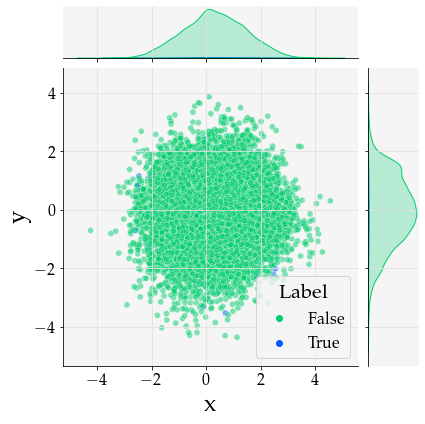

2021-05-24 18:51:09,052 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:09,053 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:09,053 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:09,054 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:09,054 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:51:09,055 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:09,055 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:51:09,056 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:09,056 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:09,057 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 

2021-05-24 18:51:09,090 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 18:51:09,091 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:51:09,091 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:09,092 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:09,092 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:09,092 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:09,093 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:51:09,093 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:09,093 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:51:09,094 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:

2021-05-24 18:51:09,139 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:09,139 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:51:09,140 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/129c56a1b99ba53bbcb35940a58e704b.dvi
2021-05-24 18:51:09,140 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:51:09,141 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:09,142 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:09,142 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:09,142 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:09,143 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:51:09,143 - DEBUG - Textile font is not compatible with

2021-05-24 18:51:09,180 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:51:09,180 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:09,180 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:09,181 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:51:09,181 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 18:51:09,182 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:51:09,183 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:09,183 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:09,183 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:09,184 - DEBUG - family: sans-serif, font: Computer Modern Sans Se

2021-05-24 18:51:09,224 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:51:09,224 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:09,224 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:51:09,225 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:09,225 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:09,225 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:51:09,226 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e398d07b0d52461180ba9f5bce00f37a.dvi
2021-05-24 18:51:09,227 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:51:09,228 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:09,229 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24

2021-05-24 18:51:09,794 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:09,795 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:09,795 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:51:09,795 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:09,796 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:51:09,797 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:09,797 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:09,797 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:51:09,798 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 18:51:09,799 - DEBUG - Dvi._xxx: encountered special: papersize=5203.

2021-05-24 18:51:09,841 - DEBUG - Assigning font /b'F1' = b'cmsy10' (dvi)
2021-05-24 18:51:09,841 - DEBUG - Assigning font /b'F2' = b'pplr8r' (dvi)
2021-05-24 18:51:09,843 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:09,843 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:09,846 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:09,846 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:09,846 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:51:09,847 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:09,847 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:51:09,847 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:09,848 - DEBUG - Bitstream Vera Sans Mono font is not compatible wit

2021-05-24 18:51:09,884 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:51:09,884 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/23bf86614c5b9fe7dd956d1ac7d6a2ea.dvi
2021-05-24 18:51:09,885 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:51:09,888 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:09,888 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:09,888 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:09,889 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:09,889 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:51:09,889 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:09,889 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', 

2021-05-24 18:51:09,926 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:09,926 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:09,926 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:51:09,926 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 18:51:09,929 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:51:09,930 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:09,930 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:09,931 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:09,933 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:09,933 - DEBUG - Apple Chancery font is not compat

2021-05-24 18:51:09,981 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:09,981 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:51:09,981 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:09,982 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:09,982 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:51:09,982 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/2e65e9b695a94456b83fb58e8b9d15a2.dvi
2021-05-24 18:51:09,983 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:51:09,985 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:09,986 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:09,986 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-

2021-05-24 18:51:10,029 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:10,030 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:51:10,030 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:10,031 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:51:10,032 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:10,032 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:10,032 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:51:10,033 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 18:51:10,033 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:51:10,034 - DEBUG - family: serif, font: Palatino, info

2021-05-24 18:51:10,200 - DEBUG - Embedding TeX font b'cmsy10' - fontinfo={'dvifont': <DviFont: b'cmsy10'>, 'pdfname': <Name b'F1'>, 'fontfile': '/usr/share/texlive/texmf-dist/fonts/type1/public/amsfonts/cm/cmsy10.pfb', 'basefont': b'CMSY10', 'encodingfile': None, 'effects': {}}
2021-05-24 18:51:10,206 - DEBUG - Embedding Type-1 font b'pplr8r' from dvi.
2021-05-24 18:51:10,207 - DEBUG - Embedding TeX font b'pplr8r' - fontinfo={'dvifont': <DviFont: b'pplr8r'>, 'pdfname': <Name b'F2'>, 'fontfile': '/usr/share/texlive/texmf-dist/fonts/type1/urw/palatino/uplr8a.pfb', 'basefont': b'URWPalladioL-Roma', 'encodingfile': '/usr/share/texlive/texmf-dist/fonts/enc/dvips/base/8r.enc', 'effects': {}}
2021-05-24 18:51:10,241 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:10,241 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:10,242 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:10,242 - D

2021-05-24 18:51:10,281 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:10,282 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:51:10,282 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:10,282 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:51:10,283 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:10,283 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:10,284 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:51:10,284 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 18:51:10,285 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:51:10,286 - DEBUG - family: serif, font: Palatino, info

2021-05-24 18:51:10,335 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:10,335 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:51:10,335 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:10,336 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:10,336 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:51:10,336 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/3ce07bc18b31318dfb8589ef3427ba04.dvi
2021-05-24 18:51:10,337 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:51:10,340 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:10,340 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:10,341 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-

2021-05-24 18:51:10,389 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/6134acbfb19d192b077a5db8a0594e2a.dvi
2021-05-24 18:51:10,390 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:51:10,391 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:10,391 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:10,391 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:10,392 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:10,392 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:51:10,392 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:10,393 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:51:10,393 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:

2021-05-24 18:51:10,442 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/3ce07bc18b31318dfb8589ef3427ba04.dvi
2021-05-24 18:51:10,442 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:51:10,444 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:10,444 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:10,445 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:10,445 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:10,445 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:51:10,446 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:10,446 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:51:10,447 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:

2021-05-24 18:51:10,496 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:10,496 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:51:10,497 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:10,497 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:10,497 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:10,498 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:10,498 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:51:10,498 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:10,499 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:51:10,499 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 

2021-05-24 18:51:10,552 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:10,553 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:10,555 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:51:10,556 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:10,557 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:51:10,557 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:10,557 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:10,558 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:51:10,558 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:10,559 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 

2021-05-24 18:51:10,608 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:51:10,609 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:10,609 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:51:10,610 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:10,612 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:10,613 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:51:10,613 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/35392782795f958f58e110367dd9b16a.dvi
2021-05-24 18:51:10,614 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:51:10,615 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:10,616 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24

2021-05-24 18:51:10,791 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:51:10,791 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:10,791 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:51:10,792 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:10,792 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:10,793 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:51:10,793 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:10,794 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:10,794 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:10,794 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 

2021-05-24 18:51:11,122 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:11,123 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:11,123 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:51:11,123 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/3ce07bc18b31318dfb8589ef3427ba04.dvi
2021-05-24 18:51:11,124 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:51:11,125 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:11,126 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:11,126 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:11,126 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:11,127 - DEBUG - Apple Chancery font is not compat

2021-05-24 18:51:11,159 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:11,159 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:51:11,161 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:11,161 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:11,162 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:51:11,162 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:11,162 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:11,163 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:11,163 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:11,164 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 

2021-05-24 18:51:11,198 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:51:11,200 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:11,200 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:11,200 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:11,201 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:11,201 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:51:11,201 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:11,202 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:51:11,202 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:11,202 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:11,203 - DEBUG - fam

2021-05-24 18:51:11,248 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:11,249 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:11,249 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:11,249 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:51:11,250 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:11,250 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:51:11,251 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:11,251 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:11,251 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:51:11,252 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/129c56a1b99ba53bbcb35940a58e704b.dv

2021-05-24 18:51:11,285 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:51:11,286 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:11,287 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:11,287 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:11,287 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:11,287 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:51:11,288 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:11,288 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:51:11,289 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:11,289 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:11,289 - DEBUG - fam

2021-05-24 18:51:11,324 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:51:11,324 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:11,325 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:51:11,325 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:11,325 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:11,327 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:51:11,327 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/2f554728ce2be6dc9209a89cf3eb6c0d.dvi
2021-05-24 18:51:11,328 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:51:11,331 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:11,332 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24

2021-05-24 18:51:11,372 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:11,373 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:11,373 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:51:11,374 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:11,374 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:11,375 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:11,376 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:11,377 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:51:11,378 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:11,378 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 

2021-05-24 18:51:11,421 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:11,422 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:11,423 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:51:11,423 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/bd1bcdde0898d52b4c77e7793da1e4d5.dvi
2021-05-24 18:51:11,424 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:51:11,549 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:11,549 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:11,550 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:11,550 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:11,550 - DEBUG - Apple Chancery font is not compat

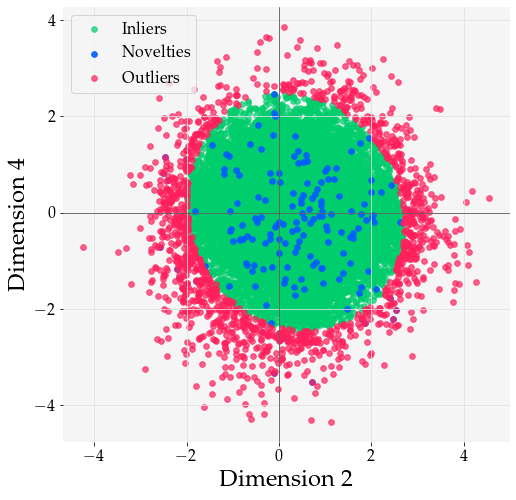

2021-05-24 18:51:11,748 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:11,749 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:11,749 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:11,749 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:11,750 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:51:11,750 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:11,750 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:51:11,751 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:11,751 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:11,752 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 

2021-05-24 18:51:11,805 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 18:51:11,806 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:51:11,808 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:11,811 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:11,812 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:11,813 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:11,814 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:51:11,818 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:11,819 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:51:11,819 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:

2021-05-24 18:51:11,885 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:11,885 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:51:11,886 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/aab5cc4d22d25565e9490903bf3c04ba.dvi
2021-05-24 18:51:11,887 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:51:11,888 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:11,888 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:11,889 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:11,890 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:11,890 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:51:11,890 - DEBUG - Textile font is not compatible with

2021-05-24 18:51:11,936 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:51:11,936 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:11,936 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:11,937 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:51:11,937 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 18:51:11,938 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:51:11,939 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:11,939 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:11,941 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:11,942 - DEBUG - family: sans-serif, font: Computer Modern Sans Se

2021-05-24 18:51:11,993 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:51:11,994 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:11,994 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:51:11,995 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:11,995 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:11,995 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:51:11,996 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/f416d242fa7c68b0f76c3a53a55632c5.dvi
2021-05-24 18:51:11,997 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:51:11,998 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:11,998 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24

2021-05-24 18:51:12,071 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:12,072 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:12,072 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:51:12,073 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:12,075 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:51:12,075 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:12,076 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:12,076 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:51:12,077 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 18:51:12,078 - DEBUG - Dvi._xxx: encountered special: papersize=5203.

2021-05-24 18:51:12,175 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:12,176 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:12,176 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:12,176 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:12,177 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:51:12,177 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:12,178 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:51:12,178 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:12,179 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:12,179 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 

2021-05-24 18:51:12,244 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:51:12,245 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/3ce07bc18b31318dfb8589ef3427ba04.dvi
2021-05-24 18:51:12,246 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:51:12,250 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:12,250 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:12,251 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:12,251 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:12,251 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:51:12,252 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:12,252 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', 

2021-05-24 18:51:12,313 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:12,313 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:12,314 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:51:12,314 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 18:51:12,315 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:51:12,315 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:12,316 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:12,316 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:12,316 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:12,316 - DEBUG - Apple Chancery font is not compat

2021-05-24 18:51:12,375 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:12,375 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:51:12,376 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:12,376 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:12,377 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:51:12,377 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/50b063103f9808b81526cf7a814e0d24.dvi
2021-05-24 18:51:12,378 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:51:12,379 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:12,380 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:12,380 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-

2021-05-24 18:51:12,450 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:12,450 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:51:12,450 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:12,451 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:51:12,451 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:12,451 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:12,452 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:51:12,452 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 18:51:12,452 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:51:12,453 - DEBUG - family: serif, font: Palatino, info

2021-05-24 18:51:12,515 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:12,515 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:12,516 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:12,517 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:51:12,517 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:12,518 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:51:12,520 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:12,520 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:12,521 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:51:12,521 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/50b063103f9808b81526cf7a814e0d24.dv

2021-05-24 18:51:12,586 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:51:12,587 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:12,588 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:12,589 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:12,590 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:12,590 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:51:12,591 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:12,592 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:51:12,592 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:12,593 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:12,595 - DEBUG - fam

2021-05-24 18:51:12,654 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:51:12,654 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/35392782795f958f58e110367dd9b16a.dvi
2021-05-24 18:51:12,655 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:51:12,658 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:12,660 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:12,661 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)

2021-05-24 18:51:13,272 - DEBUG - family: serif, fon

2021-05-24 18:51:13,335 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:13,336 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:13,336 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:13,337 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:13,338 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:51:13,339 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:13,339 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:51:13,339 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:13,341 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:13,343 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 

2021-05-24 18:51:13,413 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:13,414 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:13,415 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:51:13,415 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:13,416 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:51:13,416 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:13,417 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:13,417 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:51:13,418 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/7fb174ba49f9be712fb633a8577762e4.dvi
2021-05-24 18:51:13,418 - DEBUG - Dvi._xxx: encountered special: papersize=5203.

2021-05-24 18:51:13,488 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:13,488 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:13,488 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:51:13,489 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:13,489 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:13,489 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:13,490 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:13,490 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:51:13,494 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:13,496 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 

2021-05-24 18:51:13,558 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:13,559 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:13,561 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:13,561 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:51:13,561 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:13,562 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:51:13,565 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:13,566 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:13,566 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:51:13,567 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/6134acbfb19d192b077a5db8a0594e2a.dv

2021-05-24 18:51:13,615 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:13,615 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:13,616 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:13,617 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:51:13,617 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:13,618 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:51:13,619 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:13,619 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:13,620 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:51:13,621 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/bd1bcdde0898d52b4c77e7793da1e4d5.dv

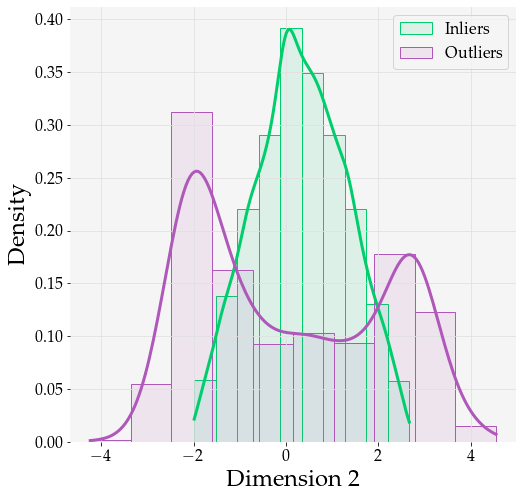

2021-05-24 18:51:13,815 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:13,816 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:13,816 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:13,817 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:13,818 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:51:13,818 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:13,818 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:51:13,819 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:13,819 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:13,820 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 

2021-05-24 18:51:13,869 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 18:51:13,870 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:51:13,870 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:13,871 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:13,871 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:13,871 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:13,872 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:51:13,872 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:13,873 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:51:13,873 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:

2021-05-24 18:51:13,916 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:13,916 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:51:13,916 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/aab5cc4d22d25565e9490903bf3c04ba.dvi
2021-05-24 18:51:13,917 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:51:13,918 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:13,919 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:13,919 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:13,919 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:13,920 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:51:13,921 - DEBUG - Textile font is not compatible with

2021-05-24 18:51:13,955 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:51:13,956 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:13,956 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:13,956 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:51:13,957 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 18:51:13,958 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:51:13,958 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:13,959 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:13,959 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:13,959 - DEBUG - family: sans-serif, font: Computer Modern Sans Se

2021-05-24 18:51:13,998 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:51:13,999 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:13,999 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:51:14,000 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:14,000 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:14,001 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:51:14,001 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/f416d242fa7c68b0f76c3a53a55632c5.dvi
2021-05-24 18:51:14,002 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:51:14,007 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:14,008 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24

2021-05-24 18:51:14,099 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:14,100 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:14,100 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:51:14,100 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:14,101 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:51:14,101 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:14,101 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:14,102 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:51:14,102 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 18:51:14,104 - DEBUG - Dvi._xxx: encountered special: papersize=5203.

2021-05-24 18:51:14,140 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:14,140 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:14,141 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:14,141 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:14,141 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:51:14,141 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:14,142 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:51:14,142 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:14,143 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:14,143 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 

2021-05-24 18:51:14,185 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:51:14,185 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/2e65e9b695a94456b83fb58e8b9d15a2.dvi
2021-05-24 18:51:14,187 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:51:14,188 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:14,189 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:14,189 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:14,189 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:14,190 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:51:14,193 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:14,193 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', 

2021-05-24 18:51:14,234 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:14,235 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:14,235 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:51:14,235 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 18:51:14,236 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:51:14,237 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:14,237 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:14,239 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:14,240 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:14,240 - DEBUG - Apple Chancery font is not compat

2021-05-24 18:51:14,275 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:14,275 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:51:14,276 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:14,277 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:14,277 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:51:14,278 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/efec8296de9918f3450d8d95431443de.dvi
2021-05-24 18:51:14,278 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:51:14,279 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:14,280 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:14,280 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-

2021-05-24 18:51:14,320 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:14,321 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:51:14,322 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:14,322 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:51:14,322 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:14,322 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:14,323 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:51:14,323 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/aab5cc4d22d25565e9490903bf3c04ba.dvi
2021-05-24 18:51:14,326 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:51:14,328 - DEBUG - family: serif, font: Palatino, info

2021-05-24 18:51:14,376 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:14,377 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:14,377 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:14,377 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:51:14,377 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:14,378 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:51:14,378 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:14,378 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:14,379 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:51:14,379 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/f416d242fa7c68b0f76c3a53a55632c5.dv

2021-05-24 18:51:14,425 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:51:14,426 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:14,426 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:14,427 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:14,427 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:14,428 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:51:14,428 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:14,428 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:51:14,428 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:14,429 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:14,429 - DEBUG - fam

2021-05-24 18:51:14,492 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:14,493 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:14,493 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:14,493 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:51:14,494 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:14,494 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:51:14,496 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:14,496 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:14,497 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:51:14,497 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/3ce07bc18b31318dfb8589ef3427ba04.dv

2021-05-24 18:51:14,534 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:51:14,535 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:14,536 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:14,536 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:14,538 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:14,538 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:51:14,539 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:14,539 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:51:14,540 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:14,540 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:14,541 - DEBUG - fam

2021-05-24 18:51:14,574 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:51:14,574 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:14,575 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:14,576 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:51:14,578 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/2e65e9b695a94456b83fb58e8b9d15a2.dvi
2021-05-24 18:51:14,578 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:51:14,579 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:14,580 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:14,580 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:14,581 - DEBUG - family: sans-serif, font: Computer Modern Sans Se

2021-05-24 18:51:14,618 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:14,618 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:51:14,618 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 18:51:14,619 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:51:14,620 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:14,620 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:14,620 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:14,621 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:14,621 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:51:14,621 - DEBUG - Textile font is not compatible with

2021-05-24 18:51:14,662 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:51:14,662 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:14,663 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:14,663 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:51:14,664 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/50b063103f9808b81526cf7a814e0d24.dvi
2021-05-24 18:51:14,664 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:51:14,665 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:14,666 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:14,667 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:14,667 - DEBUG - family: sans-serif, font: Computer Modern Sans Se

2021-05-24 18:51:17,550 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:17,550 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:17,550 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:17,551 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:17,551 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:51:17,551 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:17,552 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:51:17,552 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:17,552 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:17,553 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 

2021-05-24 18:51:17,586 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 18:51:17,586 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:51:17,587 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:17,587 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:17,588 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:17,588 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:17,588 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:51:17,589 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:17,589 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:51:17,589 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:

2021-05-24 18:51:17,629 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:17,629 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:51:17,630 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e05233931a48bf07741112bbe1445193.dvi
2021-05-24 18:51:17,630 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:51:17,637 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:17,638 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:17,638 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:17,639 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:17,639 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:51:17,640 - DEBUG - Textile font is not compatible with

2021-05-24 18:51:17,681 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:51:17,681 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:17,682 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:17,682 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:51:17,682 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 18:51:17,683 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:51:17,684 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:17,685 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:17,686 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:17,687 - DEBUG - family: sans-serif, font: Computer Modern Sans Se

2021-05-24 18:51:17,721 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:51:17,721 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:17,722 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:51:17,722 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:17,723 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:17,723 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:51:17,723 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/14896f6a4e63cfb45d66ae52288a88e7.dvi
2021-05-24 18:51:17,724 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:51:17,734 - DEBUG - top of axes not in the figure, so title not moved
2021-05-24 18:51:17,741 - DEBUG - top of axes not in the figure, so title not moved
2021-05-24 18:51:17,987 - DEB

2021-05-24 18:51:18,019 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:18,020 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:18,020 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:18,020 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:18,020 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:51:18,021 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:18,021 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:51:18,021 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:18,022 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:18,022 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 

2021-05-24 18:51:18,058 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 18:51:18,059 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:51:18,060 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:18,060 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:18,061 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:18,061 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:18,061 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:51:18,062 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:18,062 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:51:18,063 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:

2021-05-24 18:51:18,094 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:18,094 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:51:18,095 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/2e65e9b695a94456b83fb58e8b9d15a2.dvi
2021-05-24 18:51:18,097 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:51:18,098 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:18,099 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:18,099 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:18,099 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:18,100 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:51:18,100 - DEBUG - Textile font is not compatible with

2021-05-24 18:51:18,138 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:51:18,139 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:18,139 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:18,139 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:51:18,139 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 18:51:18,141 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:51:18,141 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:18,142 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:18,142 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:18,144 - DEBUG - family: sans-serif, font: Computer Modern Sans Se

2021-05-24 18:51:19,340 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:51:19,340 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:19,341 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:19,341 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:19,341 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:19,341 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:51:19,342 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:19,342 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:51:19,342 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:19,342 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:19,343 - DEBUG - fam

2021-05-24 18:51:19,377 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:51:19,377 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/98ad7ae73d7aa1b6937a42fda9087332.dvi
2021-05-24 18:51:19,378 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:51:19,382 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:19,383 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:19,384 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:19,384 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:19,384 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:51:19,384 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:19,385 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', 

2021-05-24 18:51:19,426 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:19,427 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:51:19,428 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:19,428 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:19,429 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:51:19,429 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e05233931a48bf07741112bbe1445193.dvi
2021-05-24 18:51:19,430 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:51:19,431 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:19,432 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:19,432 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-

2021-05-24 18:51:19,472 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:19,472 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:51:19,473 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:19,473 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:51:19,473 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:19,473 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:19,473 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:51:19,474 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/2f554728ce2be6dc9209a89cf3eb6c0d.dvi
2021-05-24 18:51:19,475 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:51:19,476 - DEBUG - family: serif, font: Palatino, info

2021-05-24 18:51:19,534 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:19,535 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:19,535 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:19,535 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:51:19,535 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:19,536 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:51:19,537 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:19,537 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:19,538 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:51:19,538 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/2f554728ce2be6dc9209a89cf3eb6c0d.dv

2021-05-24 18:51:19,585 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:51:19,585 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:19,586 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:19,586 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:19,586 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:19,587 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:51:19,587 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:19,587 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:51:19,588 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:19,589 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:19,590 - DEBUG - fam

2021-05-24 18:51:19,765 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:51:19,765 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/c5e8f6a64eefb12ed54839f8f9faa89a.dvi
2021-05-24 18:51:19,766 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:51:19,776 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:19,779 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:19,779 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:19,780 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:19,780 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:51:19,780 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:19,781 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', 

2021-05-24 18:51:20,040 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 18:51:20,041 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:51:20,042 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:20,042 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:20,042 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:20,043 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:20,043 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:51:20,044 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:20,044 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:51:20,044 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:

2021-05-24 18:51:20,082 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/129c56a1b99ba53bbcb35940a58e704b.dvi
2021-05-24 18:51:20,082 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:51:20,084 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:20,084 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:20,085 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:20,085 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:20,086 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:51:20,086 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:20,086 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:51:20,086 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:

2021-05-24 18:51:20,118 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:51:20,118 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:20,119 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:51:20,120 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:20,122 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:20,122 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:51:20,123 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/98ad7ae73d7aa1b6937a42fda9087332.dvi
2021-05-24 18:51:20,123 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:51:20,125 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:20,126 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24

2021-05-24 18:51:20,162 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:51:20,163 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:20,163 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:51:20,164 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:20,166 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:20,168 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:51:20,168 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 18:51:20,169 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:51:20,170 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:20,170 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24

2021-05-24 18:51:20,208 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:20,209 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:20,209 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:51:20,210 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:20,210 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:51:20,212 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:20,212 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:20,212 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:51:20,213 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/98ad7ae73d7aa1b6937a42fda9087332.dvi
2021-05-24 18:51:20,213 - DEBUG - Dvi._xxx: encountered special: papersize=5203.

2021-05-24 18:51:20,252 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:20,252 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:20,252 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:51:20,253 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:20,253 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:20,254 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:20,254 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:20,254 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:51:20,254 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:20,257 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 

2021-05-24 18:51:20,300 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:51:20,302 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:20,302 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:20,303 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:20,305 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:20,306 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:51:20,306 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:20,306 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:51:20,306 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:20,307 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:20,307 - DEBUG - fam

2021-05-24 18:51:20,474 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:51:20,475 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:20,475 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:20,475 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:20,475 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:20,476 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:51:20,476 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:20,476 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:51:20,477 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:20,477 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 

<Figure size 720x720 with 0 Axes>

2021-05-24 18:51:20,654 - DEBUG - top of axes not in the figure, so title not moved
2021-05-24 18:51:20,661 - DEBUG - top of axes not in the figure, so title not moved
2021-05-24 18:51:20,732 - DEBUG - top of axes not in the figure, so title not moved
2021-05-24 18:51:20,738 - DEBUG - top of axes not in the figure, so title not moved
2021-05-24 18:51:20,858 - DEBUG - top of axes not in the figure, so title not moved
2021-05-24 18:51:20,864 - DEBUG - top of axes not in the figure, so title not moved
2021-05-24 18:51:21,038 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:21,038 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:21,039 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:21,039 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:21,039 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-0

2021-05-24 18:51:21,068 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:21,069 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:51:21,069 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:21,069 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:21,069 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:51:21,070 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 18:51:21,070 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:51:21,071 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:21,072 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:21,073 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-

2021-05-24 18:51:21,107 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:21,107 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:21,107 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:51:21,107 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/3ce07bc18b31318dfb8589ef3427ba04.dvi
2021-05-24 18:51:21,108 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:51:21,109 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:21,110 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:21,111 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:21,113 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:21,114 - DEBUG - Apple Chancery font is not compat

2021-05-24 18:51:21,156 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:51:21,156 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:21,157 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:21,157 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:21,157 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:21,158 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:51:21,158 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:21,160 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:51:21,160 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:21,162 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:21,162 - DEBUG - fam

2021-05-24 18:51:21,199 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:51:21,200 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:21,201 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:21,201 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:21,201 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:21,201 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:51:21,202 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:21,202 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:51:21,202 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:21,203 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:21,204 - DEBUG - fam

2021-05-24 18:51:21,240 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:51:21,240 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:21,241 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:21,241 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:21,242 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:21,242 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:51:21,242 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:21,242 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:51:21,243 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:21,243 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 

2021-05-24 18:51:21,285 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:21,285 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:51:21,285 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:21,286 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:51:21,286 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:21,287 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:21,287 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:51:21,287 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:21,287 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:21,288 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 

2021-05-24 18:51:21,324 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:21,325 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:51:21,325 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:21,326 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:21,326 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:51:21,327 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/6eafde7961efc9437c68c146d179b6d1.dvi
2021-05-24 18:51:21,327 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:51:21,329 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:21,330 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:21,330 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-

2021-05-24 18:51:21,496 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:21,497 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:51:21,497 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:21,497 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:21,498 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:51:21,498 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:21,499 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:21,500 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:21,500 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:21,500 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 

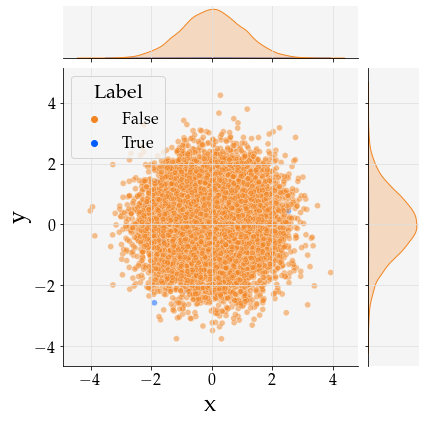

2021-05-24 18:51:21,600 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:21,601 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:21,601 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:21,602 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:21,602 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:51:21,602 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:21,602 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:51:21,603 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:21,603 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:21,603 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 

2021-05-24 18:51:21,639 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 18:51:21,640 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:51:21,641 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:21,641 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:21,641 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:21,642 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:21,642 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:51:21,642 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:21,643 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:51:21,643 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:

2021-05-24 18:51:21,679 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:21,679 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:51:21,680 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/2e65e9b695a94456b83fb58e8b9d15a2.dvi
2021-05-24 18:51:21,681 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:51:21,682 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:21,687 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:21,688 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:21,688 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:21,689 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:51:21,690 - DEBUG - Textile font is not compatible with

2021-05-24 18:51:21,740 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:51:21,741 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:21,741 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:21,741 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:51:21,742 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 18:51:21,743 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:51:21,743 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:21,743 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:21,744 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:21,744 - DEBUG - family: sans-serif, font: Computer Modern Sans Se

2021-05-24 18:51:21,785 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:51:21,786 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:21,787 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:51:21,787 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:21,787 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:21,788 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:51:21,788 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/68866aab584fc95b83a1baedea5abdb4.dvi
2021-05-24 18:51:21,789 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:51:21,790 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:21,790 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24

2021-05-24 18:51:21,836 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:21,838 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:21,839 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:51:21,839 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:21,841 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:51:21,841 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:21,841 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:21,842 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:51:21,842 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 18:51:21,843 - DEBUG - Dvi._xxx: encountered special: papersize=5203.

2021-05-24 18:51:21,883 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:21,884 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:21,884 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:21,885 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:21,887 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:51:21,887 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:21,888 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:51:21,888 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:21,888 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:21,888 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 

2021-05-24 18:51:22,507 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/129c56a1b99ba53bbcb35940a58e704b.dvi
2021-05-24 18:51:22,507 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:51:22,508 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:22,509 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:22,509 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:22,509 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:22,510 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:51:22,510 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:22,510 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:51:22,511 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:

2021-05-24 18:51:22,544 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:22,544 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:51:22,545 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 18:51:22,545 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:51:22,546 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:22,546 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:22,546 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:22,547 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:22,547 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:51:22,548 - DEBUG - Textile font is not compatible with

2021-05-24 18:51:22,585 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:51:22,586 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:22,586 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:22,589 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:51:22,590 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/a1989b0e82ab32b7b1a08bb5ee1fda2d.dvi
2021-05-24 18:51:22,590 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:51:22,591 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:22,591 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:22,592 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:22,592 - DEBUG - family: sans-serif, font: Computer Modern Sans Se

2021-05-24 18:51:22,632 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:22,633 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:22,633 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:51:22,634 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:22,634 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:51:22,635 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:22,635 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:22,635 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:51:22,636 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/2f554728ce2be6dc9209a89cf3eb6c0d.dvi
2021-05-24 18:51:22,636 - DEBUG - Dvi._xxx: encountered special: papersize=5203.

2021-05-24 18:51:22,681 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:22,682 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:22,682 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:22,682 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:22,683 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:51:22,683 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:22,683 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:51:22,684 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:22,684 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:22,685 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 

2021-05-24 18:51:22,725 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/3ce07bc18b31318dfb8589ef3427ba04.dvi
2021-05-24 18:51:22,726 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:51:22,727 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:22,729 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:22,729 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:22,730 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:22,730 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:51:22,731 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:22,731 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:51:22,731 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:

2021-05-24 18:51:22,763 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:22,765 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:51:22,765 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 18:51:22,766 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:51:22,766 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:22,768 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:22,769 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:22,769 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:22,770 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:51:22,771 - DEBUG - Textile font is not compatible with

2021-05-24 18:51:22,807 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:51:22,807 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:22,808 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:22,808 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:51:22,809 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/08460d6eb1a42286cb5291bc6638723e.dvi
2021-05-24 18:51:22,811 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:51:22,813 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:22,814 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:22,816 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:22,816 - DEBUG - family: sans-serif, font: Computer Modern Sans Se

2021-05-24 18:51:22,858 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:51:22,858 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:22,859 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:51:22,860 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:22,860 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:22,861 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:51:22,861 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/98ad7ae73d7aa1b6937a42fda9087332.dvi
2021-05-24 18:51:22,862 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:51:22,865 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:22,865 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24

2021-05-24 18:51:22,906 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:22,906 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:22,907 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:51:22,907 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:22,907 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:51:22,907 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:22,908 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:22,908 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:51:22,909 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e398d07b0d52461180ba9f5bce00f37a.dvi
2021-05-24 18:51:22,912 - DEBUG - Dvi._xxx: encountered special: papersize=5203.

2021-05-24 18:51:23,129 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:51:23,129 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:23,130 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:51:23,131 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:23,131 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:23,132 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:51:23,132 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 18:51:23,133 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:51:23,133 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:23,134 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24

2021-05-24 18:51:23,172 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:23,173 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:23,173 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:51:23,173 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:23,174 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:51:23,174 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:23,174 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:23,175 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:51:23,175 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/68866aab584fc95b83a1baedea5abdb4.dvi
2021-05-24 18:51:23,178 - DEBUG - Dvi._xxx: encountered special: papersize=5203.

2021-05-24 18:51:23,217 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:23,217 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:23,218 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:23,218 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:23,218 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:51:23,218 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:23,219 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:51:23,219 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:23,219 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:23,220 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 

2021-05-24 18:51:23,259 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:23,260 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:23,260 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:51:23,261 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:23,261 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:51:23,262 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:23,262 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:23,262 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:51:23,263 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/08460d6eb1a42286cb5291bc6638723e.dvi
2021-05-24 18:51:23,263 - DEBUG - Dvi._xxx: encountered special: papersize=5203.

2021-05-24 18:51:23,307 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:23,307 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:23,307 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:51:23,308 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:23,308 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:23,309 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:23,309 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:23,310 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:51:23,310 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:23,310 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 

2021-05-24 18:51:23,355 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:23,355 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:23,356 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:23,356 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:51:23,357 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:23,357 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:51:23,357 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:23,358 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:23,359 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:51:23,360 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/6134acbfb19d192b077a5db8a0594e2a.dv

2021-05-24 18:51:23,407 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:23,407 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:23,407 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:23,407 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:51:23,408 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:23,409 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:51:23,409 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:23,409 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:23,410 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:51:23,410 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/08460d6eb1a42286cb5291bc6638723e.dv

2021-05-24 18:51:23,450 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:51:23,452 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:23,452 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:23,453 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:23,453 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:23,453 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:51:23,454 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:23,454 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:51:23,454 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:23,455 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:23,456 - DEBUG - fam

2021-05-24 18:51:23,495 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:51:23,496 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 18:51:23,497 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:51:23,497 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:23,498 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:23,498 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:23,499 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:23,499 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:51:23,499 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:23,500 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', 

2021-05-24 18:51:23,540 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:23,540 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:23,540 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:23,541 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:51:23,541 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:23,541 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:51:23,541 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:23,542 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:23,542 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:51:23,542 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 

2021-05-24 18:51:23,579 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:23,579 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:51:23,580 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/2e65e9b695a94456b83fb58e8b9d15a2.dvi
2021-05-24 18:51:23,580 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:51:23,582 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:23,583 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:23,583 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:23,584 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:23,584 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:51:23,584 - DEBUG - Textile font is not compatible with

2021-05-24 18:51:23,621 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:23,622 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:23,622 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:23,622 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:23,622 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:51:23,623 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:23,624 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (se

2021-05-24 18:51:24,372 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:51:24,372 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:24,372 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:24,373 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:51:24,373 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/129c56a1b99ba53bbcb35940a58e704b.dvi
2021-05-24 18:51:24,374 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:51:24,375 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:24,376 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:24,376 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:24,376 - DEBUG - family: sans-serif, font: Computer Modern Sans Se

2021-05-24 18:51:24,407 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:24,407 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:24,408 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:24,408 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:24,408 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:51:24,409 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:24,412 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:51:24,413 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:24,413 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:24,414 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 

2021-05-24 18:51:24,450 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:51:24,451 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:24,451 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:51:24,451 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:24,451 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:24,452 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:51:24,452 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:24,453 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:24,454 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:24,454 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 

2021-05-24 18:51:24,497 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:24,497 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:24,498 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:51:24,499 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/35392782795f958f58e110367dd9b16a.dvi
2021-05-24 18:51:24,499 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:51:24,501 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:24,502 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:24,502 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:24,502 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:24,502 - DEBUG - Apple Chancery font is not compat

2021-05-24 18:51:24,669 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:24,669 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:24,669 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:51:24,670 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:24,670 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:24,671 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:24,671 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:24,671 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:51:24,672 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:24,672 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 

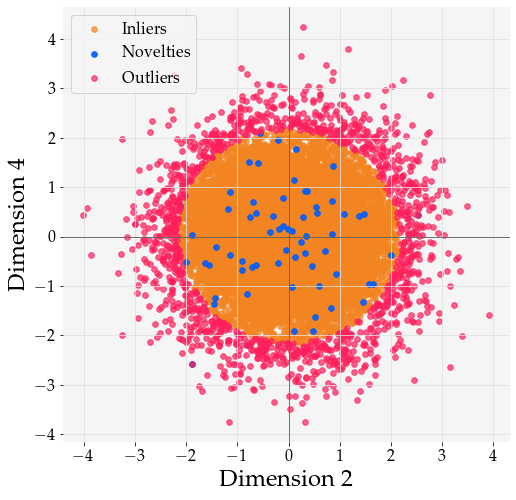

2021-05-24 18:51:24,828 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:24,828 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:24,829 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:24,829 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:24,830 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:51:24,830 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:24,830 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:51:24,831 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:24,831 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:24,831 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 

2021-05-24 18:51:24,866 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 18:51:24,866 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:51:24,867 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:24,868 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:24,868 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:24,869 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:24,869 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:51:24,869 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:24,870 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:51:24,871 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:

2021-05-24 18:51:24,913 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:24,914 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:51:24,914 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/2e65e9b695a94456b83fb58e8b9d15a2.dvi
2021-05-24 18:51:24,915 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:51:24,916 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:24,916 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:24,916 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:24,916 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:24,917 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:51:24,917 - DEBUG - Textile font is not compatible with

2021-05-24 18:51:24,963 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:51:24,963 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:24,964 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:24,964 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:51:24,964 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 18:51:24,965 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:51:24,966 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:24,966 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:24,966 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:24,967 - DEBUG - family: sans-serif, font: Computer Modern Sans Se

2021-05-24 18:51:25,007 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:51:25,008 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:25,008 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:51:25,008 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:25,009 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:25,009 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:51:25,009 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/50b063103f9808b81526cf7a814e0d24.dvi
2021-05-24 18:51:25,012 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:51:25,013 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:25,013 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24

2021-05-24 18:51:25,054 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:25,055 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:25,056 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:51:25,056 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:25,057 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:51:25,057 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:25,058 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:25,058 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:51:25,060 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 18:51:25,060 - DEBUG - Dvi._xxx: encountered special: papersize=5203.

2021-05-24 18:51:25,108 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:25,109 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:25,109 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:25,109 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:25,110 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:51:25,110 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:25,111 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:51:25,111 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:25,111 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:25,111 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 

2021-05-24 18:51:25,205 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/08460d6eb1a42286cb5291bc6638723e.dvi
2021-05-24 18:51:25,206 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:51:25,207 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:25,208 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:25,208 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:25,208 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:25,209 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:51:25,209 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:25,210 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:51:25,213 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:

2021-05-24 18:51:25,249 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:25,250 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:51:25,250 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 18:51:25,251 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:51:25,252 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:25,252 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:25,252 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:25,253 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:25,253 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:51:25,253 - DEBUG - Textile font is not compatible with

2021-05-24 18:51:25,296 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:51:25,296 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:25,297 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:25,297 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:51:25,297 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/98ad7ae73d7aa1b6937a42fda9087332.dvi
2021-05-24 18:51:25,298 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:51:25,300 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:25,301 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:25,301 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:25,302 - DEBUG - family: sans-serif, font: Computer Modern Sans Se

2021-05-24 18:51:25,814 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:51:25,815 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:25,815 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:25,815 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:25,816 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:25,816 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:51:25,816 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:25,817 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:51:25,818 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:25,819 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:25,820 - DEBUG - fam

2021-05-24 18:51:25,870 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:51:25,870 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/2e65e9b695a94456b83fb58e8b9d15a2.dvi
2021-05-24 18:51:25,871 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:51:25,872 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:25,874 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:25,875 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:25,877 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:25,877 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:51:25,877 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:25,877 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', 

2021-05-24 18:51:25,917 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:51:25,917 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:25,918 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:25,918 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:25,918 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:25,919 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:51:25,919 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:25,919 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:51:25,920 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:25,920 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 

2021-05-24 18:51:25,960 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:25,963 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:51:25,963 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:25,964 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:51:25,965 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:25,967 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:25,967 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:51:25,968 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:25,969 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:25,969 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 

2021-05-24 18:51:26,009 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/98ad7ae73d7aa1b6937a42fda9087332.dvi
2021-05-24 18:51:26,010 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:51:26,013 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:26,013 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:26,013 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:26,014 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:26,014 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:51:26,015 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:26,015 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:51:26,015 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:

2021-05-24 18:51:26,054 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 18:51:26,055 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:51:26,056 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:26,057 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:26,058 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:26,058 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:26,059 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:51:26,059 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:26,059 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:51:26,060 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:

2021-05-24 18:51:26,099 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:26,099 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:51:26,100 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/efec8296de9918f3450d8d95431443de.dvi
2021-05-24 18:51:26,102 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:51:26,103 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:26,104 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:26,104 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:26,105 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:26,105 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:51:26,106 - DEBUG - Textile font is not compatible with

2021-05-24 18:51:26,142 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:51:26,143 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:26,143 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:26,143 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:51:26,144 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 18:51:26,145 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:51:26,146 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:26,146 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:26,147 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:26,148 - DEBUG - family: sans-serif, font: Computer Modern Sans Se

2021-05-24 18:51:26,184 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/798d56fe5d7b88c994356e1c10aa55a0.dvi
2021-05-24 18:51:26,185 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:51:26,186 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:26,187 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:26,187 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:26,187 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:26,188 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:51:26,189 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:26,190 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:51:26,190 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:

2021-05-24 18:51:26,233 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:51:26,233 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:26,234 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:51:26,234 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:26,234 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:26,235 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:51:26,235 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/d479ffaa8d76e04e283f2b2a73d46254.dvi
2021-05-24 18:51:26,236 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:51:26,237 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:26,238 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24

2021-05-24 18:51:26,289 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:26,290 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:26,290 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:51:26,290 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:26,291 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:26,291 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:26,291 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:26,292 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:51:26,292 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:26,293 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 

2021-05-24 18:51:26,351 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:51:26,351 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/35392782795f958f58e110367dd9b16a.dvi
2021-05-24 18:51:26,354 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:51:26,356 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:26,357 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:26,358 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:26,358 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:26,362 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:51:26,362 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:26,363 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', 

2021-05-24 18:51:26,472 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:51:26,473 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 18:51:26,473 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:51:26,474 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:26,474 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:26,475 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:26,475 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:26,475 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:51:26,476 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:26,476 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', 

2021-05-24 18:51:26,519 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:26,520 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:26,520 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:51:26,521 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/a0ac8a6b3c6d73399d7c81ab1b857e23.dvi
2021-05-24 18:51:26,522 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:51:26,523 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:26,524 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:26,525 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:26,526 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:26,526 - DEBUG - Apple Chancery font is not compat

2021-05-24 18:51:26,569 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:26,570 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:51:26,570 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:26,570 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:26,571 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:51:26,571 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:26,572 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:26,573 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:26,573 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:26,573 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 

2021-05-24 18:51:26,615 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:51:26,616 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:26,617 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:26,618 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:26,618 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:26,618 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:51:26,618 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:26,619 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:51:26,619 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:26,620 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:26,620 - DEBUG - fam

2021-05-24 18:51:26,660 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:51:26,660 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:26,661 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:26,661 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:51:26,661 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/a1989b0e82ab32b7b1a08bb5ee1fda2d.dvi
2021-05-24 18:51:26,663 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:51:26,664 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:26,665 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:26,665 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:26,665 - DEBUG - family: sans-serif, font: Computer Modern Sans Se

2021-05-24 18:51:26,707 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:26,708 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:51:26,709 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 18:51:26,710 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:51:26,711 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:26,711 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:26,711 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:26,711 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:26,712 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:51:26,712 - DEBUG - Textile font is not compatible with

2021-05-24 18:51:26,752 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:51:26,752 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:26,753 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:26,753 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:51:26,753 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/50b063103f9808b81526cf7a814e0d24.dvi
2021-05-24 18:51:26,754 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:51:26,756 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:26,756 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:26,756 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:26,757 - DEBUG - family: sans-serif, font: Computer Modern Sans Se

2021-05-24 18:51:26,796 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:51:26,798 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:26,799 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:51:26,799 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:26,800 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:26,800 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:51:26,801 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 18:51:26,801 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:51:26,802 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:26,802 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24

2021-05-24 18:51:26,843 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:26,843 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:26,844 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:51:26,844 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/7fb174ba49f9be712fb633a8577762e4.dvi
2021-05-24 18:51:26,845 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:51:26,846 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:26,847 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:26,847 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:26,847 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:26,848 - DEBUG - Apple Chancery font is not compat

2021-05-24 18:51:26,882 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:26,883 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:26,883 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:26,883 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:51:26,884 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:26,884 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:51:26,885 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:26,885 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:26,886 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:51:26,886 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/883c1e2f1d36ab35385814a0d6a9eea1.dv

2021-05-24 18:51:27,943 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:27,945 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:27,945 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:51:27,946 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/2e65e9b695a94456b83fb58e8b9d15a2.dvi
2021-05-24 18:51:27,946 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:51:27,947 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:27,947 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:27,948 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:27,948 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:27,948 - DEBUG - Apple Chancery font is not compat

2021-05-24 18:51:27,986 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:27,986 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:27,987 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:51:27,988 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:27,989 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:27,991 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:27,991 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:27,992 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:51:27,992 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:27,992 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 

2021-05-24 18:51:28,036 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:28,036 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:28,036 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:28,037 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:51:28,037 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:28,038 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:51:28,038 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:28,039 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:28,041 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:51:28,042 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 

2021-05-24 18:51:28,086 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:28,086 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:51:28,087 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/98ad7ae73d7aa1b6937a42fda9087332.dvi
2021-05-24 18:51:28,088 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:51:28,094 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:28,096 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:28,096 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:28,096 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:28,097 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:51:28,097 - DEBUG - Textile font is not compatible with

2021-05-24 18:51:28,136 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:28,137 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:51:28,139 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 18:51:28,139 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:51:28,140 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:28,140 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:28,141 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:28,142 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:28,144 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:51:28,144 - DEBUG - Textile font is not compatible with

2021-05-24 18:51:28,191 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:51:28,191 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:28,192 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:28,192 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:51:28,193 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/efec8296de9918f3450d8d95431443de.dvi
2021-05-24 18:51:28,193 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:51:28,195 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:28,195 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:28,195 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:28,196 - DEBUG - family: sans-serif, font: Computer Modern Sans Se

2021-05-24 18:51:28,236 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:51:28,237 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:28,238 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:51:28,238 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:28,239 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:28,240 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:51:28,240 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 18:51:28,241 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:51:28,242 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:28,243 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24

2021-05-24 18:51:28,279 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:51:28,280 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/798d56fe5d7b88c994356e1c10aa55a0.dvi
2021-05-24 18:51:28,280 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:51:28,282 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:28,283 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:28,283 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:28,283 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:28,284 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:51:28,284 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:28,284 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', 

2021-05-24 18:51:28,320 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:28,320 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:51:28,321 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:28,321 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:51:28,321 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:28,322 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:28,322 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:51:28,325 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/d479ffaa8d76e04e283f2b2a73d46254.dvi
2021-05-24 18:51:28,325 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:51:28,327 - DEBUG - family: serif, font: Palatino, info

2021-05-24 18:51:28,365 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:28,367 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:51:28,367 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:28,367 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:28,368 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:51:28,368 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:28,368 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:28,369 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:28,369 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:28,370 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 

2021-05-24 18:51:28,416 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:28,416 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:28,416 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:51:28,416 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/35392782795f958f58e110367dd9b16a.dvi
2021-05-24 18:51:28,417 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:51:28,420 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:28,420 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:28,421 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:28,421 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:28,421 - DEBUG - Apple Chancery font is not compat

2021-05-24 18:51:28,528 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:28,528 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:28,529 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:51:28,529 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 18:51:28,530 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:51:28,531 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:28,532 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:28,532 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:28,532 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:28,533 - DEBUG - Apple Chancery font is not compat

2021-05-24 18:51:28,572 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:28,573 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:51:28,573 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:28,574 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:28,577 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:51:28,577 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/a0ac8a6b3c6d73399d7c81ab1b857e23.dvi
2021-05-24 18:51:28,579 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:51:28,580 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:28,581 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:28,581 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-

2021-05-24 18:51:28,618 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:28,618 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:51:28,618 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:28,619 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:51:28,619 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:28,619 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:28,620 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:51:28,620 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:28,621 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:28,622 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 

2021-05-24 18:51:28,659 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/68866aab584fc95b83a1baedea5abdb4.dvi
2021-05-24 18:51:28,659 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:51:28,661 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:28,661 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:28,661 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:28,662 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:28,663 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:51:28,663 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:28,663 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:51:28,664 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:

2021-05-24 18:51:32,090 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:51:32,090 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:32,091 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:51:32,092 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:32,093 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:32,093 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:51:32,093 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/d57805ca30df78f885241e6b3aa903c5.dvi
2021-05-24 18:51:32,093 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:51:32,095 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:32,095 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24

2021-05-24 18:51:32,128 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:32,128 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:32,129 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:51:32,129 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:32,129 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:51:32,130 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:32,130 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:32,131 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:51:32,131 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 18:51:32,132 - DEBUG - Dvi._xxx: encountered special: papersize=5203.

2021-05-24 18:51:32,176 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:32,176 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:32,177 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:32,177 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:32,177 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:51:32,177 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:32,178 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:51:32,178 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:32,178 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:32,179 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 

2021-05-24 18:51:32,218 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/35fc8a5d7b792fb5dcda0900f8005783.dvi
2021-05-24 18:51:32,219 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:51:32,220 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:32,220 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:32,220 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:32,221 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:32,221 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:51:32,221 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:32,222 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:51:32,222 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:

2021-05-24 18:51:32,533 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:51:32,533 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:32,534 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:32,534 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:51:32,535 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 18:51:32,535 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:51:32,536 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:32,536 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:32,536 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:32,537 - DEBUG - family: sans-serif, font: Computer Modern Sans Se

2021-05-24 18:51:32,569 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:51:32,570 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:32,570 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:51:32,570 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:32,570 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:32,572 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:51:32,573 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/98ad7ae73d7aa1b6937a42fda9087332.dvi
2021-05-24 18:51:32,573 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:51:32,577 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:32,578 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24

2021-05-24 18:51:32,620 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:32,620 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:32,621 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:51:32,621 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:32,622 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:51:32,623 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:32,624 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:32,624 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:51:32,624 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 18:51:32,626 - DEBUG - Dvi._xxx: encountered special: papersize=5203.

2021-05-24 18:51:32,663 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:32,663 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:32,664 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:32,664 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:32,664 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:51:32,665 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:32,665 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:51:32,666 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:32,666 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:32,666 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 

2021-05-24 18:51:32,703 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/d18d6c233caccdb02297beaf917400be.dvi
2021-05-24 18:51:32,704 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:51:32,839 - DEBUG - top of axes not in the figure, so title not moved
2021-05-24 18:51:32,847 - DEBUG - top of axes not in the figure, so title not moved
2021-05-24 18:51:32,915 - DEBUG - top of axes not in the figure, so title not moved
2021-05-24 18:51:32,921 - DEBUG - top of axes not in the figure, so title not moved
2021-05-24 18:51:33,042 - DEBUG - top of axes not in the figure, so title not moved
2021-05-24 18:51:33,048 - DEBUG - top of axes not in the figure, so title not moved
2021-05-24 18:51:33,834 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:33,834 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:33,835 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.


2021-05-24 18:51:33,864 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:33,864 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:51:33,865 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:33,865 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:51:33,865 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:33,865 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:33,866 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:51:33,866 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 18:51:33,866 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:51:33,867 - DEBUG - family: serif, font: Palatino, info

2021-05-24 18:51:33,902 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:51:33,904 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:33,905 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:33,905 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:33,906 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:33,906 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:51:33,907 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:33,907 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:51:33,907 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:33,908 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:33,909 - DEBUG - fam

2021-05-24 18:51:33,948 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:51:33,948 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/3ce07bc18b31318dfb8589ef3427ba04.dvi
2021-05-24 18:51:33,949 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:51:33,950 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:33,952 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:33,952 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:33,952 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:33,953 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:51:33,953 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:33,954 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', 

2021-05-24 18:51:33,991 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:33,991 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:33,991 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:51:33,992 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 18:51:33,993 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:51:33,994 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:33,994 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:33,996 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:33,997 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:33,997 - DEBUG - Apple Chancery font is not compat

2021-05-24 18:51:34,043 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:34,043 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:51:34,044 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:34,044 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:34,044 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:51:34,045 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/6134acbfb19d192b077a5db8a0594e2a.dvi
2021-05-24 18:51:34,046 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:51:34,046 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:34,047 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:34,047 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-

2021-05-24 18:51:34,091 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:34,091 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:51:34,091 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:34,092 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:51:34,092 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:34,092 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:34,093 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:51:34,093 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 18:51:34,093 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:51:34,094 - DEBUG - family: serif, font: Palatino, info

2021-05-24 18:51:34,471 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:51:34,472 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:34,472 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:51:34,472 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:34,473 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:34,473 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:51:34,473 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/129c56a1b99ba53bbcb35940a58e704b.dvi
2021-05-24 18:51:34,474 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:51:34,475 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:34,476 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24

2021-05-24 18:51:34,511 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:34,512 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:34,512 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:51:34,512 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:34,513 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:51:34,513 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:34,513 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:34,514 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:51:34,515 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 18:51:34,515 - DEBUG - Dvi._xxx: encountered special: papersize=5203.

2021-05-24 18:51:34,553 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:34,553 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:34,553 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:51:34,553 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/2f554728ce2be6dc9209a89cf3eb6c0d.dvi
2021-05-24 18:51:34,555 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:51:34,556 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:34,558 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:34,558 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:34,559 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:34,559 - DEBUG - Apple Chancery font is not compat

2021-05-24 18:51:34,596 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:51:34,597 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:34,597 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:34,597 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:34,598 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:34,598 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:51:34,598 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:34,598 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:51:34,599 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:34,599 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 

2021-05-24 18:51:34,642 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:51:34,643 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/2f554728ce2be6dc9209a89cf3eb6c0d.dvi
2021-05-24 18:51:34,643 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:51:34,645 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:34,645 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:34,645 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:34,646 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:34,646 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:51:34,646 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:34,647 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', 

2021-05-24 18:51:34,685 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:51:34,685 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:34,687 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:34,688 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:34,689 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:34,690 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:51:34,690 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:34,691 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:51:34,691 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:34,691 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 

2021-05-24 18:51:34,730 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:34,730 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:51:34,731 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:34,731 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:51:34,732 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:34,732 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:34,733 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:51:34,733 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/6134acbfb19d192b077a5db8a0594e2a.dvi
2021-05-24 18:51:34,734 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:51:34,735 - DEBUG - family: serif, font: Palatino, info

2021-05-24 18:51:34,777 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:34,777 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:51:34,778 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:34,779 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:51:34,779 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:34,780 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:34,780 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:51:34,781 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/c5e8f6a64eefb12ed54839f8f9faa89a.dvi
2021-05-24 18:51:34,781 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:51:34,783 - DEBUG - family: serif, font: Palatino, info

2021-05-24 18:51:34,954 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:34,955 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:51:34,955 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:34,955 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:34,956 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:51:34,957 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:34,957 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:34,957 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:34,958 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:34,959 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 

<Figure size 720x720 with 0 Axes>

2021-05-24 18:51:35,109 - DEBUG - top of axes not in the figure, so title not moved
2021-05-24 18:51:35,116 - DEBUG - top of axes not in the figure, so title not moved
2021-05-24 18:51:35,177 - DEBUG - top of axes not in the figure, so title not moved
2021-05-24 18:51:35,183 - DEBUG - top of axes not in the figure, so title not moved
2021-05-24 18:51:35,294 - DEBUG - top of axes not in the figure, so title not moved
2021-05-24 18:51:35,300 - DEBUG - top of axes not in the figure, so title not moved
2021-05-24 18:51:35,477 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:35,477 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:35,478 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:35,478 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:35,479 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-0

2021-05-24 18:51:35,506 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:35,506 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:51:35,507 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:35,507 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:35,507 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:51:35,507 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 18:51:35,509 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:51:35,509 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:35,509 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:35,510 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-

2021-05-24 18:51:35,543 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:35,543 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:35,544 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:51:35,544 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/3ce07bc18b31318dfb8589ef3427ba04.dvi
2021-05-24 18:51:35,544 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:51:35,546 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:35,547 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:35,547 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:35,547 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:35,548 - DEBUG - Apple Chancery font is not compat

2021-05-24 18:51:35,582 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:51:35,583 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:35,583 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:35,583 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:35,584 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:35,584 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:51:35,584 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:35,584 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:51:35,585 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:35,585 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:35,585 - DEBUG - fam

2021-05-24 18:51:35,624 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:51:35,625 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:35,625 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:35,626 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:35,626 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:35,626 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:51:35,627 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:35,627 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:51:35,628 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:35,628 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:35,628 - DEBUG - fam

2021-05-24 18:51:35,673 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:51:35,673 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:35,673 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:35,674 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:35,675 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:35,675 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:51:35,676 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:35,676 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:51:35,676 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:35,677 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 

2021-05-24 18:51:35,714 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:35,715 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:51:35,715 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:35,715 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:51:35,716 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:35,716 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:35,716 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:51:35,716 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:35,717 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:35,717 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 

2021-05-24 18:51:35,757 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:35,757 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:51:35,757 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:35,757 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:35,758 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:51:35,758 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/6eafde7961efc9437c68c146d179b6d1.dvi
2021-05-24 18:51:35,758 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:51:35,760 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:35,761 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:35,761 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-

2021-05-24 18:51:35,924 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:35,925 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:51:35,925 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:35,925 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:35,926 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:51:35,926 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:35,926 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:35,926 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:35,927 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:35,927 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 

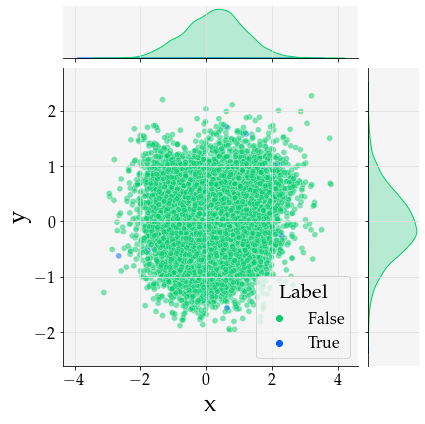

2021-05-24 18:51:36,024 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:36,025 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:36,026 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:36,027 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:36,027 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:51:36,028 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:36,028 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:51:36,028 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:36,029 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:36,029 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 

2021-05-24 18:51:36,068 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 18:51:36,069 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:51:36,070 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:36,071 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:36,071 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:36,071 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:36,073 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:51:36,075 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:36,075 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:51:36,076 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:

2021-05-24 18:51:36,110 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:36,110 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:51:36,110 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/a1989b0e82ab32b7b1a08bb5ee1fda2d.dvi
2021-05-24 18:51:36,111 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:51:36,112 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:36,113 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:36,113 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:36,113 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:36,114 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:51:36,114 - DEBUG - Textile font is not compatible with

2021-05-24 18:51:36,168 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:51:36,168 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:36,169 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:36,170 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:51:36,170 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 18:51:36,171 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:51:36,171 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:36,171 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:36,172 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:36,172 - DEBUG - family: sans-serif, font: Computer Modern Sans Se

2021-05-24 18:51:36,206 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:51:36,206 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:36,207 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:51:36,207 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:36,208 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:36,208 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:51:36,208 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/2e65e9b695a94456b83fb58e8b9d15a2.dvi
2021-05-24 18:51:36,210 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:51:36,215 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:36,215 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24

2021-05-24 18:51:36,262 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:36,262 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:36,263 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:51:36,263 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:36,263 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:51:36,263 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:36,264 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:36,264 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:51:36,264 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 18:51:36,265 - DEBUG - Dvi._xxx: encountered special: papersize=5203.

2021-05-24 18:51:36,758 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:36,758 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:36,758 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:36,759 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:36,759 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:51:36,759 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:36,759 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:51:36,760 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:36,760 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:36,760 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 

2021-05-24 18:51:36,804 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/2e65e9b695a94456b83fb58e8b9d15a2.dvi
2021-05-24 18:51:36,804 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:51:36,805 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:36,805 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:36,806 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:36,806 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:36,806 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:51:36,807 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:36,807 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:51:36,807 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:

2021-05-24 18:51:36,853 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:36,853 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:36,853 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:51:36,854 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/68866aab584fc95b83a1baedea5abdb4.dvi
2021-05-24 18:51:36,855 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:51:36,857 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:36,857 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:36,858 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:36,858 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:36,858 - DEBUG - Apple Chancery font is not compat

2021-05-24 18:51:36,897 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:36,897 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:51:36,898 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:36,898 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:36,898 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:51:36,899 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/23bf86614c5b9fe7dd956d1ac7d6a2ea.dvi
2021-05-24 18:51:36,899 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:51:36,901 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:36,902 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:36,903 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-

2021-05-24 18:51:36,944 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:36,945 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:51:36,945 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:36,945 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:51:36,946 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:36,947 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:36,947 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:51:36,948 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/2f554728ce2be6dc9209a89cf3eb6c0d.dvi
2021-05-24 18:51:36,948 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:51:36,949 - DEBUG - family: serif, font: Palatino, info

2021-05-24 18:51:36,987 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:36,988 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:36,989 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:36,989 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:51:36,990 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:36,990 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:51:36,991 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:36,991 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:36,991 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:51:36,992 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/2f554728ce2be6dc9209a89cf3eb6c0d.dv

2021-05-24 18:51:37,038 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:51:37,039 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:37,040 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:37,040 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:37,041 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:37,041 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:51:37,041 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:37,042 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:51:37,042 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:37,042 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:37,042 - DEBUG - fam

2021-05-24 18:51:37,159 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:51:37,159 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e398d07b0d52461180ba9f5bce00f37a.dvi
2021-05-24 18:51:37,160 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:51:37,165 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:37,166 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:37,166 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:37,166 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:37,166 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:51:37,167 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:37,167 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', 

2021-05-24 18:51:37,242 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:51:37,242 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:37,243 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:37,243 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:37,243 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:37,244 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:51:37,244 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:37,244 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:51:37,245 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:37,245 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:37,245 - DEBUG - fam

2021-05-24 18:51:37,280 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:51:37,281 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/2e65e9b695a94456b83fb58e8b9d15a2.dvi
2021-05-24 18:51:37,282 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:51:37,283 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:37,283 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:37,284 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:37,285 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:37,285 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:51:37,285 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:37,286 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', 

2021-05-24 18:51:37,325 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:51:37,326 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:37,326 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:37,326 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:37,327 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:37,328 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:51:37,328 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:37,329 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:51:37,331 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:37,331 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 

2021-05-24 18:51:37,376 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:37,376 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:51:37,376 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:37,376 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:51:37,377 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:37,377 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:37,378 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:51:37,379 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:37,380 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:37,380 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 

2021-05-24 18:51:37,417 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:37,417 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:37,419 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:51:37,420 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/23bf86614c5b9fe7dd956d1ac7d6a2ea.dvi
2021-05-24 18:51:37,421 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:51:37,423 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:37,423 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:37,424 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:37,424 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:37,425 - DEBUG - Apple Chancery font is not compat

2021-05-24 18:51:37,467 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:37,468 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:37,468 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:51:37,468 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 18:51:37,469 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:51:37,470 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:37,470 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:37,471 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:37,471 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:37,472 - DEBUG - Apple Chancery font is not compat

2021-05-24 18:51:37,514 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:37,515 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:37,515 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:51:37,516 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/3ce07bc18b31318dfb8589ef3427ba04.dvi
2021-05-24 18:51:37,516 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:51:37,518 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:37,519 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:37,519 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:37,519 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:37,520 - DEBUG - Apple Chancery font is not compat

2021-05-24 18:51:37,559 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:37,559 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:37,560 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:37,560 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:51:37,560 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:37,561 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:51:37,561 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:37,561 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:37,561 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:51:37,562 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/2e65e9b695a94456b83fb58e8b9d15a2.dv

2021-05-24 18:51:37,608 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:37,608 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:37,609 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:37,609 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:51:37,610 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:37,610 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:51:37,612 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:37,613 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:37,613 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:51:37,613 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dv

2021-05-24 18:51:37,724 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:51:37,725 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:37,725 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:51:37,725 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:37,725 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:37,726 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:51:37,726 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e398d07b0d52461180ba9f5bce00f37a.dvi
2021-05-24 18:51:37,729 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:51:37,734 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:37,734 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24

2021-05-24 18:51:37,995 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:51:37,995 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:37,995 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:51:37,997 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:37,997 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:37,997 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:51:37,997 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 18:51:37,998 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:51:37,999 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:37,999 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24

2021-05-24 18:51:38,035 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:38,035 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:38,035 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:51:38,036 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:38,036 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:51:38,036 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:38,037 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:38,037 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:51:38,038 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/2e65e9b695a94456b83fb58e8b9d15a2.dvi
2021-05-24 18:51:38,038 - DEBUG - Dvi._xxx: encountered special: papersize=5203.

2021-05-24 18:51:38,077 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:38,077 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:38,077 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:51:38,078 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:38,078 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:51:38,078 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:38,079 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:38,079 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:51:38,079 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:38,080 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 

2021-05-24 18:51:38,122 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:51:38,123 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/a0ac8a6b3c6d73399d7c81ab1b857e23.dvi
2021-05-24 18:51:38,123 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:51:38,125 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:38,125 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:38,126 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:38,126 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:38,126 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:51:38,127 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:38,127 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', 

2021-05-24 18:51:38,164 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:38,164 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:38,165 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:38,165 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:51:38,165 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:38,165 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:51:38,166 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:38,166 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp

2021-05-24 18:51:38,822 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:51:38,824 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:38,825 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:38,825 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:38,825 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:38,826 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:51:38,826 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:38,826 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:51:38,827 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:38,827 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:38,827 - DEBUG - fam

2021-05-24 18:51:38,867 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:51:38,867 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 18:51:38,868 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:51:38,870 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:38,870 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:38,870 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:38,870 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:38,871 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:51:38,871 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:38,872 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', 

2021-05-24 18:51:38,924 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:38,925 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:51:38,925 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:38,926 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:38,927 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:51:38,927 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/2f554728ce2be6dc9209a89cf3eb6c0d.dvi
2021-05-24 18:51:38,928 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:51:38,929 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:38,930 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:38,930 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-

2021-05-24 18:51:38,968 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:38,969 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:51:38,969 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:38,969 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:51:38,970 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:38,972 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:38,972 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:51:38,973 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/23bf86614c5b9fe7dd956d1ac7d6a2ea.dvi
2021-05-24 18:51:38,974 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:51:38,976 - DEBUG - family: serif, font: Palatino, info

2021-05-24 18:51:39,012 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:39,012 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:39,013 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:39,013 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:51:39,013 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:39,014 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:51:39,014 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:39,014 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:39,015 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:51:39,015 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dv

2021-05-24 18:51:39,054 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:51:39,056 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:39,057 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:39,057 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:39,057 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:39,058 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:51:39,058 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:39,059 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:51:39,059 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:39,059 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:39,060 - DEBUG - fam

2021-05-24 18:51:39,109 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:51:39,109 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/522741de97037f716b6db38352a5dae1.dvi
2021-05-24 18:51:39,110 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:51:39,112 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:39,112 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:39,112 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:39,112 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:39,113 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:51:39,113 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:39,113 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', 

2021-05-24 18:51:39,166 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:39,166 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:39,167 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:51:39,167 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/bd1bcdde0898d52b4c77e7793da1e4d5.dvi
2021-05-24 18:51:39,168 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:51:39,170 - DEBUG - Embedding Type-1 font b'cmsy10' from dvi.
2021-05-24 18:51:39,172 - DEBUG - Embedding TeX font b'cmsy10' - fontinfo={'dvifont': <DviFont: b'cmsy10'>, 'pdfname': <Name b'F1'>, 'fontfile': '/usr/share/texlive/texmf-dist/fonts/type1/public/amsfonts/cm/cmsy10.pfb', 'basefont': b'CMSY10', 'encodingfile': None, 'effects': {}}
2021-05-24 18:51:39,178 - DEBUG - Embedding Type-1 font b'pplr8r' from dvi.
2021-05-24 18:51:39,179 - DEBUG - Embedd

2021-05-24 18:51:39,229 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:51:39,230 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/68866aab584fc95b83a1baedea5abdb4.dvi
2021-05-24 18:51:39,231 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:51:39,232 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:39,232 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:39,233 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:39,233 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:39,234 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:51:39,234 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:39,234 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', 

2021-05-24 18:51:39,270 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:39,270 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:39,273 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:51:39,275 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 18:51:39,275 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:51:39,276 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:39,276 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:39,276 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:39,277 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:39,277 - DEBUG - Apple Chancery font is not compat

2021-05-24 18:51:39,318 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:51:39,319 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/3ce07bc18b31318dfb8589ef3427ba04.dvi
2021-05-24 18:51:39,320 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:51:39,322 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:39,323 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:39,323 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:39,323 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:39,323 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:51:39,324 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:39,324 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', 

2021-05-24 18:51:39,360 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:39,360 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:51:39,361 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:39,361 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:51:39,361 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:39,362 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:39,362 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:51:39,362 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/2e65e9b695a94456b83fb58e8b9d15a2.dvi
2021-05-24 18:51:39,364 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:51:39,365 - DEBUG - family: serif, font: Palatino, info

2021-05-24 18:51:39,408 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:39,408 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:51:39,410 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:39,411 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:39,411 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:51:39,412 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:39,412 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:39,412 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:39,413 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:39,413 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 

2021-05-24 18:51:40,184 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:40,184 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:40,185 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:40,185 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:51:40,185 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:40,186 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:51:40,186 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:40,186 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:40,187 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:51:40,187 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dv

2021-05-24 18:51:40,222 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:51:40,223 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:40,223 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:40,223 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:40,224 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:40,224 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:51:40,225 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:40,225 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:51:40,225 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:40,226 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:40,226 - DEBUG - fam

2021-05-24 18:51:40,266 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:51:40,267 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/c3ec0b22b0b6cb3f95e221e809e07549.dvi
2021-05-24 18:51:40,267 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:51:40,269 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:40,270 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:40,270 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:40,270 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:40,271 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:51:40,271 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:40,272 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', 

2021-05-24 18:51:40,310 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:40,310 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:40,311 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:51:40,311 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 18:51:40,312 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:51:40,312 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:40,313 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:40,313 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:40,314 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:40,315 - DEBUG - Apple Chancery font is not compat

2021-05-24 18:51:40,355 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:40,355 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:51:40,356 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:40,359 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:40,359 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:51:40,359 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/806c1f5f415245c110fabc22d099acbc.dvi
2021-05-24 18:51:40,360 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:51:40,361 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:40,361 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:40,362 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-

2021-05-24 18:51:40,404 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:40,405 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:51:40,406 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:40,406 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:51:40,407 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:40,407 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:40,407 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:51:40,408 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 18:51:40,408 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:51:40,409 - DEBUG - family: serif, font: Palatino, info

2021-05-24 18:51:40,499 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:40,499 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:40,500 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:40,500 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:51:40,500 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:40,500 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:51:40,501 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:40,501 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:40,502 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:51:40,502 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/2f554728ce2be6dc9209a89cf3eb6c0d.dv

2021-05-24 18:51:40,543 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/68866aab584fc95b83a1baedea5abdb4.dvi
2021-05-24 18:51:40,545 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:51:40,546 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:40,547 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:40,547 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:40,547 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:40,547 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:51:40,548 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:40,548 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:51:40,549 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:

2021-05-24 18:51:40,595 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:40,595 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:51:40,596 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 18:51:40,596 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:51:40,597 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:40,597 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:40,598 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:40,598 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:40,598 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:51:40,598 - DEBUG - Textile font is not compatible with

2021-05-24 18:51:40,633 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:51:40,634 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:40,634 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:40,634 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:51:40,635 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/0e9cf75fab9c01f6cd9a63a91b8e7e3b.dvi
2021-05-24 18:51:40,636 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:51:40,637 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:40,637 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:40,637 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:40,638 - DEBUG - family: sans-serif, font: Computer Modern Sans Se

2021-05-24 18:51:40,671 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:51:40,672 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:40,672 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:51:40,672 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:40,673 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:40,676 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:51:40,677 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 18:51:40,678 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:51:40,678 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:40,679 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24

2021-05-24 18:51:40,718 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:40,718 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:40,719 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:51:40,720 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:40,721 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:51:40,722 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:40,722 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:40,722 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:51:40,723 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/0e9cf75fab9c01f6cd9a63a91b8e7e3b.dvi
2021-05-24 18:51:40,724 - DEBUG - Dvi._xxx: encountered special: papersize=5203.

2021-05-24 18:51:40,773 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:40,773 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:40,773 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:40,774 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:40,774 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:51:40,774 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:40,774 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:51:40,775 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:40,776 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:40,776 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 

2021-05-24 18:51:40,826 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/35392782795f958f58e110367dd9b16a.dvi
2021-05-24 18:51:40,827 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:51:40,829 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:40,829 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:40,830 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:40,830 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:40,830 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:51:40,830 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:40,831 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:51:40,831 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:

2021-05-24 18:51:40,883 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:40,884 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:40,884 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:40,884 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:40,885 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:51:40,885 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:40,886 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:51:40,887 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:40,887 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:40,888 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 

2021-05-24 18:51:40,931 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:40,932 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:40,932 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:40,933 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:40,933 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:51:40,933 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:40,933 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:51:40,934 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:40,934 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:40,934 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 

2021-05-24 18:51:40,972 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:40,972 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:40,972 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:51:40,973 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/2e65e9b695a94456b83fb58e8b9d15a2.dvi
2021-05-24 18:51:40,973 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:51:40,976 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:40,976 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:40,976 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:40,977 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:40,977 - DEBUG - Apple Chancery font is not compat

2021-05-24 18:51:41,014 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:41,014 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:41,014 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:51:41,015 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 18:51:41,016 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:51:41,017 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:41,017 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:41,017 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:41,017 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:41,018 - DEBUG - Apple Chancery font is not compat

2021-05-24 18:51:41,061 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:41,061 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:51:41,062 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:41,062 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:41,062 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:51:41,067 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/da12be043bf66fa494ffe6a28495e74d.dvi
2021-05-24 18:51:41,068 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:51:41,069 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:41,070 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:41,071 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-

2021-05-24 18:51:41,109 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:41,109 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:51:41,110 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:41,110 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:51:41,110 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:41,111 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:41,112 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:51:41,113 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 18:51:41,113 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:51:41,114 - DEBUG - family: serif, font: Palatino, info

2021-05-24 18:51:41,152 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:41,153 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:41,153 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:51:41,154 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/d57805ca30df78f885241e6b3aa903c5.dvi
2021-05-24 18:51:41,154 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:51:41,157 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:51:41,158 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:41,158 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:41,161 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:41,161 - DEBUG - Apple Chancery font is not compat

2021-05-24 18:51:41,197 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:41,197 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:41,197 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:41,197 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:51:41,198 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:41,198 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:51:41,199 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:41,199 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:41,200 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:51:41,200 - DEBUG - STREAM b'IHDR' 16 13
2021-05-24 18:51:41,201 - DEBUG - STREAM b'PLTE' 41 48
2021-0

2021-05-24 18:51:41,245 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:51:41,245 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:51:41,245 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:51:41,246 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:51:41,246 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:51:41,246 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:51:41,248 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:51:41,248 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:51:41,249 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:51:41,249 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/35fc8a5d7b792fb5dcda0900f8005783.dv

In [32]:
def latent_vis_envelope_2d(latent_vecs, labels, dim_x: int = 2, dim_y: int = 4, save_name=None, stat='density', color='C1'):

    dim_x = 2
    dim_y = 4
    cov_2d = EllipticEnvelope(random_state=49).fit(latent_vecs[:, [dim_x, dim_y]])
    pred_2d = cov_2d.predict(latent_vecs[:, [dim_x, dim_y]])

    inliers_2d = ((pred_2d + 1) // 2).astype(bool)
    outliers_2d = ~inliers_2d
    
    # Setup some long form data
    dat = pd.DataFrame.from_dict({
        'Label': np.array(labels),
        'x': latent_vecs[:, dim_x],
        'y': latent_vecs[:, dim_y]
    })
    
    plt.figure(figsize=(10, 10))
    sns.jointplot(data=dat, x='x', y='y', hue='Label', kind='scatter', palette=[color, 'C5'], alpha=0.5, stat='density')
    plt.savefig(f'JointPlotScatter-{sn}.pdf', format='pdf', bbox_inches='tight')
    plt.show()
    
    # Plot the 2d results
    fig, ax = plt.subplots(figsize=(8, 8))
    ax.scatter(latent_vecs[inliers_2d, dim_x], latent_vecs[inliers_2d, dim_y], s=2**5, 
               label='Inliers', color=color, alpha=0.7)

    ax.scatter(latent_vecs[outliers_2d, dim_x], latent_vecs[outliers_2d, dim_y], s=2**5,
               label='Outliers', color='C0', alpha=0.7)
    # Novelies plotted here
    ax.scatter(latent_vecs[np.array(labels).astype(bool), dim_x], latent_vecs[np.array(labels).astype(bool), dim_y],
               s=2**5, label='Novelties', color='C5', alpha=0.9)  # This line is for seeing the distr. of novelties

    
    ax.axhline(0, 0, c='k', lw=0.5)
    ax.axvline(0, 0, c='k', lw=0.5)
    ax.set_xlabel(f'Dimension {dim_x}')
    ax.set_ylabel(f'Dimension {dim_y}')
    ax.legend()
    if save_name is not None and isinstance(save_name, str):
        plt.savefig(f'2dOutliers-{save_name}.pdf', format='pdf',  bbox_inches='tight')
    plt.show()

    # Plot x dimension
    fig, ax = plt.subplots(figsize=(8, 8))
    sns.histplot(data=latent_vecs[inliers_2d, dim_x], bins=10, alpha=0.1, stat=stat, 
                 kde=True, color=color, edgecolor=color, label='Inliers')
    sns.histplot(data=latent_vecs[outliers_2d, dim_x], bins=10, alpha=0.1, stat=stat,
                 kde=True, color='C3', edgecolor='C3', label='Outliers')
    
    ax.set_xlabel(f'Dimension {dim_x}')
    ax.legend()
    if save_name is not None and isinstance(save_name, str):
        plt.savefig(f'InlierOutlierDensityX-{save_name}.pdf', format='pdf',  bbox_inches='tight')
    plt.show()

    # Plot y dimension
    fig, ax = plt.subplots(figsize=(8, 8))
    sns.histplot(data=latent_vecs[inliers_2d, dim_y], bins=10, alpha=0.1, stat=stat,
                 kde=True, color=color, edgecolor=color, label='Inliers')
    sns.histplot(data=latent_vecs[outliers_2d, dim_y], bins=10, alpha=0.1, stat=stat, 
                 kde=True, color='C3', edgecolor='C3', label='Outliers')
    ax.set_xlabel(f'Dimension {dim_y}')
    ax.legend()
    if save_name is not None and isinstance(save_name, str):
        plt.savefig(f'InlierOutlierDensityY-{save_name}.pdf', format='pdf',  bbox_inches='tight')
    plt.show()
    
    # Here, the negative mahalanobis distance is used as the novelty score
    return -cov_2d.mahalanobis(latent_vecs[:, [dim_x, dim_y]])

# Use the negative Mahalanobis distance as the novelty score
latent_scores_catalog = {}

for sn, res in lt_results.items():
    lt_vecs = np.stack(res['latent_vecs'], axis=0)
    labels = res['labels']
    color = 'C1' if 'AAE' in sn else 'C6'
    scores_2d = latent_vis_envelope_2d(lt_vecs, labels, save_name=sn, color=color)
#     latent_scores_catalog[f'{sn}-2d'] = scores_2d

2021-05-24 18:58:48,434 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:58:48,435 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:58:48,435 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:58:48,435 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:58:48,436 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:58:48,437 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:58:48,438 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:58:48,439 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:58:48,439 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:58:48,439 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 

2021-05-24 18:58:48,475 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 18:58:48,476 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:58:48,477 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:58:48,477 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:58:48,477 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:58:48,477 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:58:48,478 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:58:48,478 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:58:48,478 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:58:48,479 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:

2021-05-24 18:58:48,518 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:58:48,518 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:58:48,519 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/33ab8e5ded6bbd8f0cfd36a9a865efd3.dvi
2021-05-24 18:58:48,520 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:58:48,522 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:58:48,522 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:58:48,522 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:58:48,523 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:58:48,523 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:58:48,524 - DEBUG - Textile font is not compatible with

2021-05-24 18:58:48,553 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:58:48,553 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:58:48,553 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:58:48,553 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:58:48,554 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 18:58:48,555 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:58:48,556 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:58:48,556 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:58:48,556 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:58:48,556 - DEBUG - family: sans-serif, font: Computer Modern Sans Se

2021-05-24 18:58:48,595 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:58:48,595 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:58:48,595 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:58:48,596 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:58:48,596 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:58:48,596 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:58:48,597 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/4d1c8120671f2664512ec665080d8a0c.dvi
2021-05-24 18:58:48,598 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:58:48,603 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:58:48,604 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24

2021-05-24 18:58:48,633 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:58:48,634 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:58:48,634 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:58:48,634 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:58:48,635 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:58:48,635 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:58:48,635 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:58:48,635 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:58:48,636 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 18:58:48,637 - DEBUG - Dvi._xxx: encountered special: papersize=5203.

2021-05-24 18:58:48,723 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:58:48,723 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:58:48,723 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:58:48,724 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:58:48,724 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:58:48,724 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:58:48,725 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:58:48,725 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:58:48,725 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:58:48,725 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 

2021-05-24 18:58:48,755 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/2e65e9b695a94456b83fb58e8b9d15a2.dvi
2021-05-24 18:58:48,755 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:58:48,756 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:58:48,757 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:58:48,757 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:58:48,757 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:58:48,758 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:58:48,758 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:58:48,759 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:58:48,759 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:

2021-05-24 18:58:48,791 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:58:48,792 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:58:48,792 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:58:48,792 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/2f554728ce2be6dc9209a89cf3eb6c0d.dvi
2021-05-24 18:58:48,793 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:58:48,795 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:58:48,795 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:58:48,795 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:58:48,796 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:58:48,796 - DEBUG - Apple Chancery font is not compat

2021-05-24 18:58:48,991 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:58:48,992 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:58:48,993 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:58:48,993 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:58:48,994 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:58:48,994 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:58:48,994 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:58:48,995 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:58:48,995 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 18:58:48,996 - DEBUG - Dvi._xxx: encountered special: papersize=5203.

2021-05-24 18:58:49,026 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:58:49,027 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:58:49,027 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:58:49,027 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:58:49,027 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:58:49,028 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:58:49,028 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:58:49,028 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:58:49,028 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:58:49,029 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 

2021-05-24 18:58:49,064 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/0e9cf75fab9c01f6cd9a63a91b8e7e3b.dvi
2021-05-24 18:58:49,064 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:58:49,066 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:58:49,067 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:58:49,067 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:58:49,067 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:58:49,067 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:58:49,068 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:58:49,068 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:58:49,068 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:

2021-05-24 18:58:49,263 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:58:49,263 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:58:49,263 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:58:49,263 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:58:49,264 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:58:49,264 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/2f554728ce2be6dc9209a89cf3eb6c0d.dvi
2021-05-24 18:58:49,265 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:58:49,267 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:58:49,267 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:58:49,267 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-

2021-05-24 18:58:49,311 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:58:49,312 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:58:49,312 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:58:49,312 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:58:49,312 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:58:49,313 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:58:49,313 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:58:49,314 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 18:58:49,314 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:58:49,315 - DEBUG - family: serif, font: Palatino, info

2021-05-24 18:58:49,344 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:58:49,345 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:58:49,345 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:58:49,345 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:58:49,345 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:58:49,346 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:58:49,346 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:58:49,346 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:58:49,346 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:58:49,347 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/6ca9ec77f0adfa643d38aef07125fc47.dv

2021-05-24 18:58:49,382 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:58:49,384 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:58:49,385 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:58:49,385 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:58:49,385 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:58:49,385 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:58:49,386 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:58:49,386 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:58:49,387 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:58:49,387 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:58:49,387 - DEBUG - fam

2021-05-24 18:58:49,466 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:58:49,467 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:58:49,467 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:58:49,467 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:58:49,468 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:58:49,468 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:58:49,469 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:58:49,470 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:58:49,470 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:58:49,471 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/129c56a1b99ba53bbcb35940a58e704b.dv

2021-05-24 18:58:49,501 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:58:49,502 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:58:49,503 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:58:49,503 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:58:49,503 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:58:49,503 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:58:49,504 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:58:49,504 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:58:49,504 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:58:49,504 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:58:49,505 - DEBUG - fam

2021-05-24 18:58:49,537 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:58:49,537 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:58:49,537 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:58:49,537 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:58:49,538 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:58:49,538 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:58:49,538 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:58:49,539 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:58:49,539 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:58:49,539 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/3ce07bc18b31318dfb8589ef3427ba04.dv

2021-05-24 18:58:49,572 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:58:49,572 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:58:49,572 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:58:49,573 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:58:49,573 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:58:49,573 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:58:49,574 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:58:49,574 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:58:49,574 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:58:49,574 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 

2021-05-24 18:58:49,608 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:58:49,608 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:58:49,608 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/c3ec0b22b0b6cb3f95e221e809e07549.dvi
2021-05-24 18:58:49,609 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:58:49,610 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:58:49,610 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:58:49,611 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:58:49,611 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:58:49,611 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:58:49,612 - DEBUG - Textile font is not compatible with

2021-05-24 18:58:49,643 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:58:49,644 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:58:49,644 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:58:49,644 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:58:49,644 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 18:58:49,646 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:58:49,646 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:58:49,647 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:58:49,647 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:58:49,647 - DEBUG - family: sans-serif, font: Computer Modern Sans Se

2021-05-24 18:58:49,677 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/d57805ca30df78f885241e6b3aa903c5.dvi
2021-05-24 18:58:49,677 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:58:49,680 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:58:49,680 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:58:49,680 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:58:49,681 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:58:49,681 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:58:49,681 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:58:49,682 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:58:49,682 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:

2021-05-24 18:58:49,713 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:58:49,713 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:58:49,713 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:58:49,714 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:58:49,714 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:58:49,714 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:58:49,715 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:58:49,715 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:58:49,715 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/9074668f87fe25d62ab5e75daacca313.dvi
2021-05-24 18:58:49,717 - DEBUG - Dvi._xxx: encountered special: papersize=5203.

2021-05-24 18:58:49,752 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:58:49,752 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:58:49,753 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:58:49,753 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:58:49,753 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:58:49,754 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:58:49,755 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:58:49,755 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:58:49,755 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:58:49,756 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 

2021-05-24 18:58:49,786 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:58:49,788 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:58:49,788 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:58:49,788 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:58:49,789 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:58:49,789 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:58:49,789 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:58:49,790 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:58:49,790 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:58:49,790 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:58:49,790 - DEBUG - fam

2021-05-24 18:58:49,826 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:58:49,827 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:58:49,827 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:58:49,828 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:58:49,828 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:58:49,828 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:58:49,829 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:58:49,829 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:58:49,829 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:58:49,829 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:58:49,830 - DEBUG - fam

2021-05-24 18:58:49,858 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:58:49,860 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:58:49,861 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:58:49,861 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:58:49,861 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:58:49,861 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:58:49,862 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:58:49,862 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:58:49,862 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:58:49,862 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:58:49,863 - DEBUG - fam

2021-05-24 18:58:49,891 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:58:49,892 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:58:49,892 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:58:49,892 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:58:49,893 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/50eec38d441c8ed960a0cc999ea4df86.dvi
2021-05-24 18:58:49,893 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:58:49,896 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:58:49,897 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:58:49,897 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:58:49,897 - DEBUG - family: sans-serif, font: Computer Modern Sans Se

2021-05-24 18:58:50,011 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:58:50,012 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:58:50,012 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:58:50,012 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:58:50,012 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 18:58:50,013 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:58:50,014 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:58:50,014 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:58:50,014 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:58:50,015 - DEBUG - family: sans-serif, font: Computer Modern Sans Se

2021-05-24 18:58:50,046 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:58:50,046 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:58:50,046 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:58:50,046 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:58:50,047 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:58:50,047 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:58:50,047 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/98ad7ae73d7aa1b6937a42fda9087332.dvi
2021-05-24 18:58:50,048 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:58:50,049 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:58:50,049 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24

2021-05-24 18:58:50,080 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:58:50,081 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:58:50,081 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:58:50,081 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:58:50,082 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:58:50,082 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:58:50,082 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:58:50,083 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:58:50,083 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:58:50,083 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 

2021-05-24 18:58:50,119 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:58:50,120 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:58:50,120 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:58:50,120 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:58:50,121 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:58:50,121 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:58:50,121 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:58:50,122 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:58:50,122 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:58:50,123 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/6134acbfb19d192b077a5db8a0594e2a.dv

2021-05-24 18:58:50,153 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:58:50,154 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:58:50,154 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:58:50,154 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:58:50,154 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:58:50,155 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:58:50,155 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:58:50,155 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:58:50,155 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:58:50,156 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e5e322fdddbe6793c3847197ff838d63.dv

2021-05-24 18:58:50,187 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:58:50,189 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:58:50,189 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:58:50,189 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:58:50,189 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:58:50,190 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:58:50,190 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:58:50,191 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:58:50,191 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:58:50,192 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:58:50,192 - DEBUG - fam

2021-05-24 18:58:50,223 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:58:50,223 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:58:50,224 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:58:50,224 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:58:50,224 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/0e9cf75fab9c01f6cd9a63a91b8e7e3b.dvi
2021-05-24 18:58:50,225 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:58:50,226 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:58:50,226 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:58:50,227 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:58:50,227 - DEBUG - family: sans-serif, font: Computer Modern Sans Se

2021-05-24 18:58:50,261 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:58:50,262 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:58:50,262 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:58:50,262 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:58:50,263 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:58:50,263 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:58:50,264 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:58:50,264 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:58:50,264 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:58:50,265 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 

2021-05-24 18:59:06,823 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:59:06,824 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:59:06,824 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:59:06,824 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:59:06,825 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:59:06,825 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:59:06,826 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 18:59:06,826 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:59:06,827 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:59:06,827 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24

2021-05-24 18:59:06,863 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:59:06,864 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:59:06,864 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:59:06,864 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:59:06,865 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:59:06,865 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:59:06,865 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:59:06,866 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:59:06,866 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/98ad7ae73d7aa1b6937a42fda9087332.dvi
2021-05-24 18:59:06,867 - DEBUG - Dvi._xxx: encountered special: papersize=5203.

2021-05-24 18:59:06,907 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:59:06,907 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:59:06,907 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:59:06,908 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:59:06,908 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:59:06,908 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:59:06,909 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:59:06,909 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:59:06,911 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:59:06,912 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 

2021-05-24 18:59:06,950 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/6134acbfb19d192b077a5db8a0594e2a.dvi
2021-05-24 18:59:06,951 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:59:06,951 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:59:06,952 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:59:06,952 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:59:06,952 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:59:06,953 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:59:06,955 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:59:06,955 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:59:06,955 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:

2021-05-24 18:59:07,059 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:59:07,060 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:59:07,060 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/129c56a1b99ba53bbcb35940a58e704b.dvi
2021-05-24 18:59:07,061 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:59:07,062 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:59:07,063 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:59:07,063 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:59:07,064 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:59:07,064 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:59:07,064 - DEBUG - Textile font is not compatible with

2021-05-24 18:59:07,098 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:59:07,098 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:59:07,099 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:59:07,099 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:59:07,099 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 18:59:07,100 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:59:07,101 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:59:07,101 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:59:07,101 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:59:07,102 - DEBUG - family: sans-serif, font: Computer Modern Sans Se

2021-05-24 18:59:07,144 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:59:07,144 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:59:07,145 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:59:07,145 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:59:07,145 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:59:07,146 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:59:07,146 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:59:07,146 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:59:07,146 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/6134acbfb19d192b077a5db8a0594e2a.dvi
2021-05-24 18:59:07,147 - DEBUG - Dvi._xxx: encountered special: papersize=5203.

2021-05-24 18:59:07,181 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:59:07,182 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:59:07,182 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:59:07,182 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:59:07,182 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:59:07,183 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:59:07,183 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:59:07,183 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:59:07,183 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:59:07,184 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:59:07,184 - DEBUG - fam

2021-05-24 18:59:07,221 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:59:07,222 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/c3ec0b22b0b6cb3f95e221e809e07549.dvi
2021-05-24 18:59:07,222 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:59:07,224 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:59:07,225 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:59:07,225 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:59:07,226 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:59:07,226 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:59:07,227 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:59:07,227 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', 

2021-05-24 18:59:07,271 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:59:07,271 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:59:07,272 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:59:07,272 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/9074668f87fe25d62ab5e75daacca313.dvi
2021-05-24 18:59:07,273 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:59:07,274 - DEBUG - Assigning font /b'F4' = b'pplri8r' (dvi)
2021-05-24 18:59:07,276 - DEBUG - Assigning font /b'F5' = b'cmr10' (dvi)
2021-05-24 18:59:07,281 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:59:07,281 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:59:07,282 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:59:07,282 - DEBUG - family: sans-

2021-05-24 18:59:07,323 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:59:07,323 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:59:07,324 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:59:07,324 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:59:07,325 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:59:07,326 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:59:07,326 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:59:07,326 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/4d1c8120671f2664512ec665080d8a0c.dvi
2021-05-24 18:59:07,327 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:59:07,328 - DEBUG - family: serif, font: Palatino, info

2021-05-24 18:59:07,382 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:59:07,382 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:59:07,382 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:59:07,383 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:59:07,383 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:59:07,383 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:59:07,383 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:59:07,384 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:59:07,384 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:59:07,385 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/6134acbfb19d192b077a5db8a0594e2a.dv

2021-05-24 18:59:07,451 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:59:07,451 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:59:07,451 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:59:07,452 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:59:07,452 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:59:07,452 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:59:07,453 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 18:59:07,454 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:59:07,455 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:59:07,458 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24

2021-05-24 18:59:07,492 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:59:07,492 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:59:07,492 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:59:07,493 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:59:07,493 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:59:07,493 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:59:07,494 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:59:07,494 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:59:07,494 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/98ad7ae73d7aa1b6937a42fda9087332.dvi
2021-05-24 18:59:07,495 - DEBUG - Dvi._xxx: encountered special: papersize=5203.

2021-05-24 18:59:07,536 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:59:07,537 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:59:07,537 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:59:07,537 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:59:07,538 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:59:07,539 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:59:07,539 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:59:07,539 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:59:07,540 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:59:07,541 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 

2021-05-24 18:59:07,579 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:59:07,581 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:59:07,581 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:59:07,581 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:59:07,582 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:59:07,582 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:59:07,582 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:59:07,583 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:59:07,583 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:59:07,583 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:59:07,584 - DEBUG - fam

2021-05-24 18:59:07,620 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:59:07,621 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 18:59:07,621 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:59:07,622 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:59:07,623 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:59:07,623 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:59:07,624 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:59:07,624 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:59:07,624 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:59:07,625 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', 

2021-05-24 18:59:07,665 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:59:07,667 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:59:07,667 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:59:07,667 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:59:07,667 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:59:07,668 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:59:07,668 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:59:07,669 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:59:07,669 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:59:07,669 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:59:07,670 - DEBUG - fam

2021-05-24 18:59:07,709 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:59:07,710 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:59:07,710 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:59:07,710 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:59:07,710 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:59:07,711 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:59:07,712 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/9074668f87fe25d62ab5e75daacca313.dvi
2021-05-24 18:59:07,712 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:59:07,714 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:59:07,714 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24

2021-05-24 18:59:07,757 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:59:07,757 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:59:07,758 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:59:07,758 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:59:07,758 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:59:07,759 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:59:07,759 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:59:07,760 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:59:07,760 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:59:07,760 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 

2021-05-24 18:59:07,799 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:59:07,800 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:59:07,800 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:59:07,800 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:59:07,801 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:59:07,801 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:59:07,802 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:59:07,803 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:59:07,803 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:59:07,804 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 

2021-05-24 18:59:07,848 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:59:07,848 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:59:07,848 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/2f554728ce2be6dc9209a89cf3eb6c0d.dvi
2021-05-24 18:59:07,849 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:59:07,850 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:59:07,850 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:59:07,851 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:59:07,851 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:59:07,852 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:59:07,852 - DEBUG - Textile font is not compatible with

2021-05-24 18:59:07,889 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:59:07,889 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:59:07,890 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:59:07,890 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:59:07,892 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:59:07,892 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:59:07,892 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:59:07,893 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:59:07,893 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:59:07,893 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 

2021-05-24 18:59:08,005 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/2f554728ce2be6dc9209a89cf3eb6c0d.dvi
2021-05-24 18:59:08,009 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:59:08,010 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:59:08,010 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:59:08,011 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:59:08,011 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:59:08,011 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:59:08,012 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:59:08,012 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:59:08,012 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:

2021-05-24 18:59:08,047 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:59:08,047 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:59:08,047 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:59:08,048 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:59:08,048 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:59:08,048 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:59:08,049 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:59:08,049 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:59:08,050 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:59:08,050 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 

2021-05-24 18:59:08,091 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:59:08,091 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:59:08,092 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:59:08,092 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:59:08,093 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:59:08,093 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:59:08,093 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/6134acbfb19d192b077a5db8a0594e2a.dvi
2021-05-24 18:59:08,094 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:59:08,094 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:59:08,095 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24

2021-05-24 18:59:08,131 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:59:08,131 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:59:08,132 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:59:08,132 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:59:08,132 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:59:08,133 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:59:08,133 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e5e322fdddbe6793c3847197ff838d63.dvi
2021-05-24 18:59:08,133 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:59:08,135 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:59:08,135 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24

2021-05-24 18:59:08,172 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:59:08,172 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:59:08,172 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:59:08,173 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:59:08,173 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:59:08,174 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:59:08,175 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:59:08,176 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:59:08,177 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:59:08,177 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 

2021-05-24 18:59:08,210 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:59:08,210 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/0e9cf75fab9c01f6cd9a63a91b8e7e3b.dvi
2021-05-24 18:59:08,212 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:59:08,213 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:59:08,214 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:59:08,214 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:59:08,214 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:59:08,215 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:59:08,215 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:59:08,215 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', 

2021-05-24 18:59:08,260 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:59:08,260 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:59:08,260 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:59:08,261 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:59:08,261 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:59:08,261 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:59:08,262 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:59:08,262 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:59:08,262 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:59:08,263 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/129c56a1b99ba53bbcb35940a58e704b.dv

2021-05-24 18:59:08,299 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:59:08,300 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:59:08,300 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:59:08,301 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:59:08,301 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:59:08,302 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:59:08,302 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:59:08,302 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:59:08,303 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:59:08,303 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 

2021-05-24 18:59:08,347 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/129c56a1b99ba53bbcb35940a58e704b.dvi
2021-05-24 18:59:08,347 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:59:08,348 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:59:08,349 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:59:08,350 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:59:08,350 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:59:08,350 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:59:08,351 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:59:08,351 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:59:08,351 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:

2021-05-24 18:59:08,391 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:59:08,391 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:59:08,391 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:59:08,392 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:59:08,392 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:59:08,392 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:59:08,393 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/98ad7ae73d7aa1b6937a42fda9087332.dvi
2021-05-24 18:59:08,394 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:59:08,396 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:59:08,396 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24

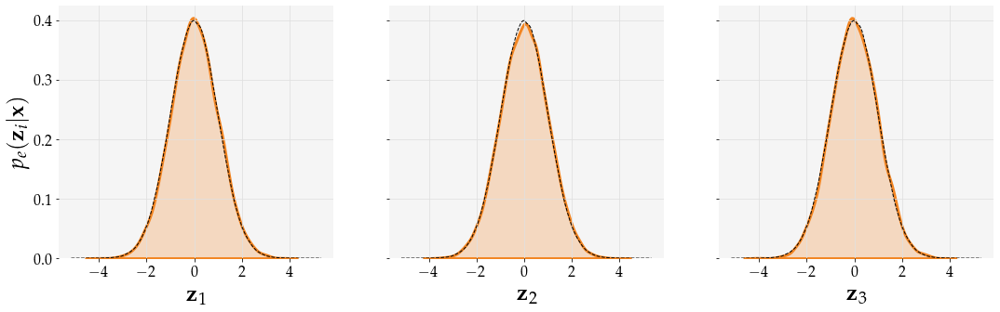

2021-05-24 18:59:21,673 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:59:21,674 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:59:21,674 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:59:21,674 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:59:21,675 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:59:21,675 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:59:21,675 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:59:21,676 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:59:21,676 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:59:21,676 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 

2021-05-24 18:59:21,713 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 18:59:21,713 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:59:21,714 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:59:21,714 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:59:21,715 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:59:21,715 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:59:21,715 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:59:21,716 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:59:21,716 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:59:21,716 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:

2021-05-24 18:59:21,759 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:59:21,759 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:59:21,760 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/c3ec0b22b0b6cb3f95e221e809e07549.dvi
2021-05-24 18:59:21,761 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:59:21,762 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:59:21,763 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:59:21,763 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:59:21,764 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:59:21,764 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:59:21,764 - DEBUG - Textile font is not compatible with

2021-05-24 18:59:21,799 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:59:21,800 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:59:21,800 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:59:21,800 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:59:21,801 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 18:59:21,801 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:59:21,802 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:59:21,802 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:59:21,803 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:59:21,803 - DEBUG - family: sans-serif, font: Computer Modern Sans Se

2021-05-24 18:59:21,852 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:59:21,852 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:59:21,853 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:59:21,853 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:59:21,853 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:59:21,854 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:59:21,854 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/4d1c8120671f2664512ec665080d8a0c.dvi
2021-05-24 18:59:21,855 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:59:21,865 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:59:21,866 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24

2021-05-24 18:59:21,963 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:59:21,964 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:59:21,964 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:59:21,964 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:59:21,965 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:59:21,965 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:59:21,965 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:59:21,966 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:59:21,966 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 18:59:21,967 - DEBUG - Dvi._xxx: encountered special: papersize=5203.

2021-05-24 18:59:22,011 - DEBUG - Assigning font /b'F1' = b'cmsy10' (dvi)
2021-05-24 18:59:22,011 - DEBUG - Assigning font /b'F2' = b'pplr8r' (dvi)
2021-05-24 18:59:22,013 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:59:22,013 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:59:22,014 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:59:22,014 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:59:22,014 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:59:22,015 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:59:22,015 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:59:22,015 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:59:22,015 - DEBUG - Bitstream Vera Sans Mono font is not compatible wit

2021-05-24 18:59:22,063 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:59:22,063 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/33ab8e5ded6bbd8f0cfd36a9a865efd3.dvi
2021-05-24 18:59:22,064 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:59:22,065 - DEBUG - Assigning font /b'F3' = b'pplb8r' (dvi)
2021-05-24 18:59:22,067 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:59:22,067 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:59:22,068 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:59:22,068 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:59:22,069 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:59:22,069 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 1

2021-05-24 18:59:22,109 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:59:22,109 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:59:22,109 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:59:22,110 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:59:22,110 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 18:59:22,111 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:59:22,111 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:59:22,112 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:59:22,112 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:59:22,112 - DEBUG - family: sans-serif, font: Computer Modern Sans Se

2021-05-24 18:59:22,159 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:59:22,160 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:59:22,160 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:59:22,161 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:59:22,161 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:59:22,161 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:59:22,162 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e5e322fdddbe6793c3847197ff838d63.dvi
2021-05-24 18:59:22,163 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:59:22,165 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:59:22,165 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24

2021-05-24 18:59:22,212 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:59:22,212 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:59:22,213 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:59:22,214 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:59:22,215 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:59:22,215 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:59:22,217 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:59:22,218 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:59:22,220 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/9074668f87fe25d62ab5e75daacca313.dvi
2021-05-24 18:59:22,223 - DEBUG - Dvi._xxx: encountered special: papersize=5203.

2021-05-24 18:59:22,275 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/6134acbfb19d192b077a5db8a0594e2a.dvi
2021-05-24 18:59:22,276 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:59:22,276 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:59:22,277 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:59:22,277 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:59:22,277 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:59:22,277 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:59:22,278 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:59:22,279 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:59:22,279 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:

2021-05-24 18:59:22,340 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:59:22,340 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:59:22,341 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/98ad7ae73d7aa1b6937a42fda9087332.dvi
2021-05-24 18:59:22,341 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:59:22,344 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:59:22,344 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:59:22,344 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:59:22,345 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:59:22,345 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:59:22,346 - DEBUG - Textile font is not compatible with

2021-05-24 18:59:22,413 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/129c56a1b99ba53bbcb35940a58e704b.dvi
2021-05-24 18:59:22,414 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:59:22,414 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:59:22,415 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:59:22,415 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:59:22,416 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:59:22,416 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:59:22,416 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:59:22,416 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:59:22,417 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:

2021-05-24 18:59:22,465 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:59:22,465 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:59:22,466 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 18:59:22,467 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:59:22,468 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:59:22,469 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:59:22,470 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:59:22,470 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:59:22,471 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:59:22,471 - DEBUG - Textile font is not compatible with

2021-05-24 18:59:22,514 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:59:22,515 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:59:22,515 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:59:22,515 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:59:22,517 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:59:22,517 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:59:22,517 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:59:22,520 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:59:22,522 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:59:22,522 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 

2021-05-24 18:59:22,564 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:59:22,564 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:59:22,565 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:59:22,565 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:59:22,566 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:59:22,566 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:59:22,566 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/33ab8e5ded6bbd8f0cfd36a9a865efd3.dvi
2021-05-24 18:59:22,567 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:59:22,569 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:59:22,570 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24

2021-05-24 18:59:22,613 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:59:22,613 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:59:22,614 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:59:22,614 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:59:22,614 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:59:22,615 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:59:22,615 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:59:22,615 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:59:22,616 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 18:59:22,617 - DEBUG - Dvi._xxx: encountered special: papersize=5203.

2021-05-24 18:59:22,665 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:59:22,666 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:59:22,666 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:59:22,666 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:59:22,667 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:59:22,669 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:59:22,670 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:59:22,671 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:59:22,671 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/c3ec0b22b0b6cb3f95e221e809e07549.dvi
2021-05-24 18:59:22,673 - DEBUG - Dvi._xxx: encountered special: papersize=5203.

2021-05-24 18:59:22,727 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:59:22,727 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:59:22,730 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:59:22,730 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:59:22,731 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:59:22,731 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:59:22,731 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:59:22,732 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:59:22,732 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:59:22,733 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 

2021-05-24 18:59:22,787 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:59:22,793 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:59:22,794 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:59:22,794 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:59:22,794 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:59:22,795 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:59:22,795 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:59:22,796 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:59:22,796 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:59:22,797 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:59:22,797 - DEBUG - fam

2021-05-24 18:59:22,834 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:59:22,834 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:59:22,834 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:59:22,836 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:59:22,837 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/2e65e9b695a94456b83fb58e8b9d15a2.dvi
2021-05-24 18:59:22,838 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:59:22,839 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:59:22,840 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:59:22,840 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:59:22,840 - DEBUG - family: sans-serif, font: Computer Modern Sans Se

2021-05-24 18:59:22,886 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:59:22,886 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:59:22,887 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:59:22,887 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:59:22,888 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:59:22,888 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:59:22,889 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:59:22,889 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:59:22,889 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:59:22,890 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 

2021-05-24 18:59:22,930 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:59:22,930 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:59:22,930 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:59:22,931 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:59:22,931 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:59:22,932 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:59:22,932 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:59:22,932 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:59:22,933 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:59:22,933 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 

2021-05-24 18:59:23,066 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:59:23,067 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:59:23,067 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:59:23,068 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:59:23,068 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:59:23,069 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:59:23,069 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/129c56a1b99ba53bbcb35940a58e704b.dvi
2021-05-24 18:59:23,070 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:59:23,071 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:59:23,071 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24

2021-05-24 18:59:23,101 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:59:23,102 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:59:23,102 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:59:23,102 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:59:23,106 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:59:23,107 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:59:23,107 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:59:23,107 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:59:23,108 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 18:59:23,109 - DEBUG - Dvi._xxx: encountered special: papersize=5203.

2021-05-24 18:59:23,146 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:59:23,147 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:59:23,147 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:59:23,147 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/2f554728ce2be6dc9209a89cf3eb6c0d.dvi
2021-05-24 18:59:23,149 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:59:23,150 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:59:23,150 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:59:23,150 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:59:23,151 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:59:23,152 - DEBUG - Apple Chancery font is not compat

2021-05-24 18:59:23,194 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:59:23,195 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:59:23,195 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:59:23,195 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:59:23,195 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:59:23,196 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:59:23,196 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:59:23,196 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:59:23,196 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:59:23,197 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 

2021-05-24 18:59:23,234 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:59:23,234 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/d57805ca30df78f885241e6b3aa903c5.dvi
2021-05-24 18:59:23,236 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:59:23,237 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:59:23,237 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:59:23,237 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:59:23,238 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:59:23,238 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:59:23,240 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:59:23,241 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', 

2021-05-24 18:59:23,279 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:59:23,279 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:59:23,280 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:59:23,280 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:59:23,280 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:59:23,281 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:59:23,281 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:59:23,281 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:59:23,281 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:59:23,282 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 

2021-05-24 18:59:23,320 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:59:23,320 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:59:23,320 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:59:23,321 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:59:23,321 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:59:23,321 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:59:23,322 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:59:23,322 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:59:23,323 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:59:23,323 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 

2021-05-24 18:59:23,361 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:59:23,361 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:59:23,361 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:59:23,361 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:59:23,362 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/9074668f87fe25d62ab5e75daacca313.dvi
2021-05-24 18:59:23,363 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:59:23,368 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:59:23,368 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:59:23,370 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:59:23,371 - DEBUG - family: sans-serif, font: Computer Modern Sans Se

2021-05-24 18:59:23,412 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:59:23,413 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:59:23,414 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:59:23,414 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:59:23,414 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:59:23,414 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:59:23,415 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:59:23,415 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:59:23,416 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:59:23,416 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 

2021-05-24 18:59:23,468 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:59:23,468 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:59:23,469 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:59:23,469 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:59:23,469 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:59:23,470 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:59:23,470 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:59:23,470 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:59:23,470 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:59:23,471 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 

2021-05-24 18:59:23,514 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:59:23,514 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/2e65e9b695a94456b83fb58e8b9d15a2.dvi
2021-05-24 18:59:23,516 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:59:23,517 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:59:23,518 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:59:23,520 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:59:23,520 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:59:23,520 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:59:23,521 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:59:23,521 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', 

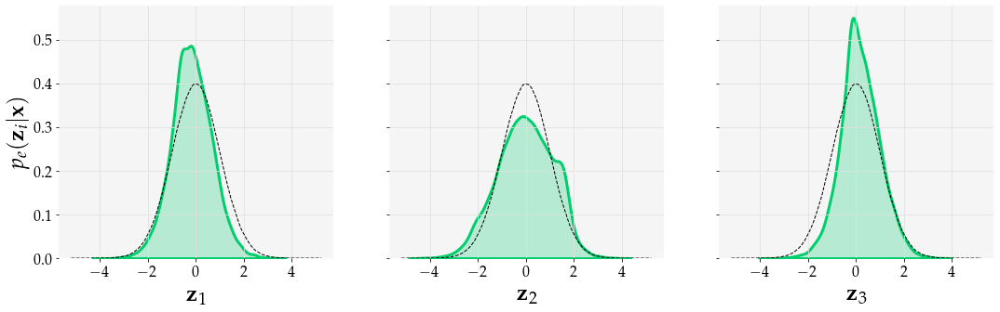

2021-05-24 18:59:38,775 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:59:38,776 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:59:38,776 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:59:38,776 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:59:38,777 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:59:38,777 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:59:38,778 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:59:38,778 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:59:38,778 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:59:38,778 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 

2021-05-24 18:59:38,806 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 18:59:38,807 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:59:38,807 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:59:38,807 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:59:38,808 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:59:38,808 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:59:38,809 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:59:38,809 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:59:38,809 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:59:38,809 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:

2021-05-24 18:59:38,849 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:59:38,851 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:59:38,851 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/c3ec0b22b0b6cb3f95e221e809e07549.dvi
2021-05-24 18:59:38,852 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:59:38,853 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:59:38,854 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:59:38,854 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:59:38,854 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:59:38,855 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:59:38,855 - DEBUG - Textile font is not compatible with

2021-05-24 18:59:38,893 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:59:38,894 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:59:38,894 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:59:38,895 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:59:38,895 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 18:59:38,898 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:59:38,898 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:59:38,899 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:59:38,899 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:59:38,899 - DEBUG - family: sans-serif, font: Computer Modern Sans Se

2021-05-24 18:59:38,958 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:59:38,958 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:59:38,958 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:59:38,959 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:59:38,959 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:59:38,959 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:59:38,960 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/8c2984e455853b50e949b834fad640c0.dvi
2021-05-24 18:59:38,961 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:59:39,021 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:59:39,022 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24

2021-05-24 18:59:39,065 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:59:39,066 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:59:39,067 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:59:39,067 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:59:39,068 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:59:39,068 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:59:39,068 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:59:39,069 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:59:39,070 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 18:59:39,070 - DEBUG - Dvi._xxx: encountered special: papersize=5203.

2021-05-24 18:59:39,115 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/2f554728ce2be6dc9209a89cf3eb6c0d.dvi
2021-05-24 18:59:39,115 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:59:39,117 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:59:39,117 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:59:39,118 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:59:39,118 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:59:39,119 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:59:39,119 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:59:39,120 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:59:39,120 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:

2021-05-24 18:59:39,154 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:59:39,155 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:59:39,155 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:59:39,155 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/c3ec0b22b0b6cb3f95e221e809e07549.dvi
2021-05-24 18:59:39,156 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:59:39,157 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:59:39,158 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:59:39,158 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:59:39,158 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:59:39,159 - DEBUG - Apple Chancery font is not compat

2021-05-24 18:59:39,194 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:59:39,194 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:59:39,198 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:59:39,198 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:59:39,198 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:59:39,199 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 18:59:39,199 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:59:39,200 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:59:39,200 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:59:39,201 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-

2021-05-24 18:59:39,245 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:59:39,248 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:59:39,248 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:59:39,249 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:59:39,249 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:59:39,250 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:59:39,250 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:59:39,252 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/6134acbfb19d192b077a5db8a0594e2a.dvi
2021-05-24 18:59:39,252 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:59:39,253 - DEBUG - family: serif, font: Palatino, info

2021-05-24 18:59:39,300 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:59:39,303 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:59:39,303 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:59:39,303 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:59:39,304 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:59:39,304 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:59:39,304 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:59:39,305 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:59:39,305 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:59:39,306 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:59:39,307 - DEBUG - fam

2021-05-24 18:59:39,357 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:59:39,358 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/2f554728ce2be6dc9209a89cf3eb6c0d.dvi
2021-05-24 18:59:39,358 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:59:39,360 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:59:39,361 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:59:39,361 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:59:39,364 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:59:39,364 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:59:39,365 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:59:39,365 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', 

2021-05-24 18:59:39,441 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:59:39,441 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:59:39,442 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:59:39,442 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:59:39,442 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:59:39,443 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:59:39,443 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:59:39,443 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:59:39,443 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:59:39,444 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 

2021-05-24 18:59:39,485 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 18:59:39,485 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:59:39,486 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:59:39,487 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:59:39,487 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:59:39,488 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:59:39,488 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:59:39,488 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:59:39,488 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:59:39,490 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:

2021-05-24 18:59:39,536 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:59:39,536 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:59:39,537 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:59:39,537 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:59:39,537 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:59:39,538 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:59:39,538 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:59:39,538 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:59:39,538 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:59:39,539 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 

2021-05-24 18:59:39,580 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:59:39,580 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:59:39,580 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:59:39,581 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:59:39,581 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:59:39,581 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:59:39,582 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/33ab8e5ded6bbd8f0cfd36a9a865efd3.dvi
2021-05-24 18:59:39,582 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:59:39,583 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:59:39,584 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24

2021-05-24 18:59:39,624 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:59:39,624 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:59:39,625 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:59:39,625 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:59:39,625 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:59:39,626 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:59:39,627 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 18:59:39,628 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:59:39,628 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:59:39,629 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24

2021-05-24 18:59:39,681 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:59:39,682 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:59:39,682 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:59:39,682 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:59:39,683 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:59:39,683 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:59:39,683 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/c3ec0b22b0b6cb3f95e221e809e07549.dvi
2021-05-24 18:59:39,686 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:59:39,687 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:59:39,688 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24

2021-05-24 18:59:39,727 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:59:39,727 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:59:39,728 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:59:39,728 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:59:39,729 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:59:39,729 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:59:39,729 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:59:39,729 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:59:39,730 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:59:39,730 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 

2021-05-24 18:59:39,777 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:59:39,777 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:59:39,777 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:59:39,778 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:59:39,779 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:59:39,779 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:59:39,779 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:59:39,780 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:59:39,780 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:59:39,780 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 

2021-05-24 18:59:39,819 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:59:39,819 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:59:39,820 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/98ad7ae73d7aa1b6937a42fda9087332.dvi
2021-05-24 18:59:39,820 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:59:39,824 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:59:39,824 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:59:39,825 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:59:39,825 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:59:39,826 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:59:39,826 - DEBUG - Textile font is not compatible with

2021-05-24 18:59:39,883 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:59:39,883 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:59:39,884 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:59:39,885 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:59:39,885 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:59:39,885 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:59:39,886 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:59:39,886 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:59:39,886 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:59:39,887 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 

2021-05-24 18:59:39,928 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:59:39,929 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:59:39,929 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:59:39,929 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:59:39,930 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:59:39,931 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:59:39,931 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/6134acbfb19d192b077a5db8a0594e2a.dvi
2021-05-24 18:59:39,932 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:59:39,932 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:59:39,933 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24

2021-05-24 18:59:40,049 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:59:40,049 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:59:40,050 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:59:40,050 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:59:40,051 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:59:40,051 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:59:40,052 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/3ce07bc18b31318dfb8589ef3427ba04.dvi
2021-05-24 18:59:40,052 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:59:40,053 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:59:40,053 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24

2021-05-24 18:59:40,101 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:59:40,101 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:59:40,101 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:59:40,102 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:59:40,102 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:59:40,103 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:59:40,103 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:59:40,103 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:59:40,104 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:59:40,104 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 

2021-05-24 18:59:40,148 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:59:40,149 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/2e65e9b695a94456b83fb58e8b9d15a2.dvi
2021-05-24 18:59:40,150 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:59:40,151 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:59:40,152 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:59:40,152 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:59:40,153 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:59:40,153 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:59:40,153 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:59:40,154 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', 

2021-05-24 18:59:40,195 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:59:40,196 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:59:40,197 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:59:40,197 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:59:40,197 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:59:40,198 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:59:40,198 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:59:40,199 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:59:40,200 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:59:40,200 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:59:40,201 - DEBUG - fam

2021-05-24 18:59:40,237 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:59:40,237 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/0e9cf75fab9c01f6cd9a63a91b8e7e3b.dvi
2021-05-24 18:59:40,239 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:59:40,240 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:59:40,241 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:59:40,241 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:59:40,241 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:59:40,242 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:59:40,242 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:59:40,242 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', 

2021-05-24 18:59:40,286 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:59:40,287 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:59:40,287 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:59:40,287 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:59:40,288 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:59:40,288 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:59:40,288 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:59:40,289 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:59:40,289 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:59:40,290 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/d57805ca30df78f885241e6b3aa903c5.dv

2021-05-24 18:59:40,341 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:59:40,341 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:59:40,341 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:59:40,342 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:59:40,342 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:59:40,343 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:59:40,343 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:59:40,343 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:59:40,344 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:59:40,345 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 

2021-05-24 18:59:40,393 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:59:40,395 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:59:40,396 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:59:40,397 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:59:40,397 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:59:40,397 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:59:40,398 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:59:40,398 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:59:40,399 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:59:40,399 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:59:40,400 - DEBUG - fam

2021-05-24 18:59:40,440 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:59:40,441 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:59:40,441 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:59:40,441 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:59:40,441 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:59:40,442 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:59:40,443 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/4d1c8120671f2664512ec665080d8a0c.dvi
2021-05-24 18:59:40,443 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:59:40,453 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:59:40,453 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24

2021-05-24 18:59:40,492 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:59:40,492 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:59:40,493 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:59:40,493 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:59:40,493 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:59:40,494 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:59:40,494 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:59:40,494 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:59:40,495 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:59:40,495 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 

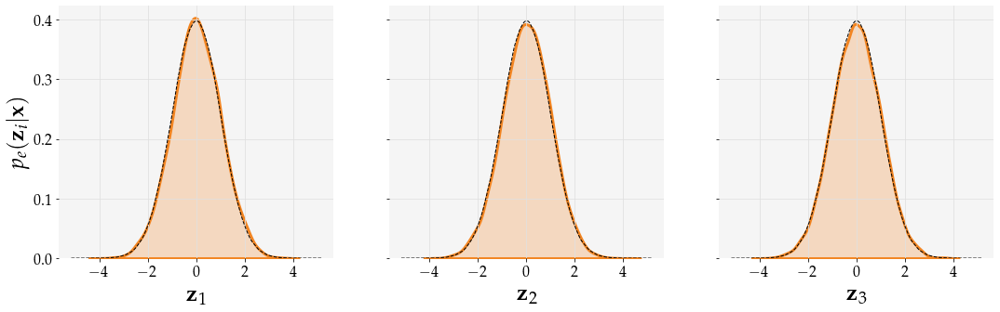

2021-05-24 18:59:54,780 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:59:54,780 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:59:54,780 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:59:54,781 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:59:54,781 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:59:54,781 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:59:54,782 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:59:54,782 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:59:54,782 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:59:54,782 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 

2021-05-24 18:59:54,815 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 18:59:54,817 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:59:54,818 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:59:54,818 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:59:54,818 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:59:54,818 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:59:54,819 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:59:54,819 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:59:54,820 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:59:54,820 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:

2021-05-24 18:59:54,861 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:59:54,861 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:59:54,862 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/c3ec0b22b0b6cb3f95e221e809e07549.dvi
2021-05-24 18:59:54,862 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:59:54,863 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:59:54,864 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:59:54,864 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:59:54,864 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:59:54,865 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:59:54,865 - DEBUG - Textile font is not compatible with

2021-05-24 18:59:54,905 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:59:54,905 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:59:54,906 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:59:54,907 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:59:54,907 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 18:59:54,908 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:59:54,908 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:59:54,909 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:59:54,909 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:59:54,909 - DEBUG - family: sans-serif, font: Computer Modern Sans Se

2021-05-24 18:59:54,943 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:59:54,944 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:59:54,944 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:59:54,944 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:59:54,945 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:59:54,945 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:59:54,945 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/806c1f5f415245c110fabc22d099acbc.dvi
2021-05-24 18:59:54,946 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:59:54,951 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:59:54,952 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24

2021-05-24 18:59:54,991 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:59:54,992 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:59:54,992 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:59:54,992 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:59:54,992 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:59:54,993 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:59:54,993 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:59:54,993 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:59:54,993 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 18:59:54,995 - DEBUG - Dvi._xxx: encountered special: papersize=5203.

2021-05-24 18:59:55,037 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:59:55,038 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:59:55,038 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:59:55,039 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:59:55,039 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:59:55,039 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:59:55,040 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:59:55,040 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:59:55,041 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:59:55,041 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 

2021-05-24 18:59:55,153 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/53566684c5c470b577fb76d9209a8aa8.dvi
2021-05-24 18:59:55,154 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:59:55,155 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:59:55,155 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:59:55,156 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:59:55,156 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:59:55,156 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:59:55,157 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:59:55,157 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:59:55,158 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:

2021-05-24 18:59:55,195 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:59:55,196 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:59:55,196 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/f0aec9ae15bfd4aa46180becb376f329.dvi
2021-05-24 18:59:55,197 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:59:55,198 - DEBUG - Assigning font /b'F1' = b'cmsy10' (dvi)
2021-05-24 18:59:55,198 - DEBUG - Assigning font /b'F2' = b'pplr8r' (dvi)
2021-05-24 18:59:55,200 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:59:55,201 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:59:55,201 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:59:55,202 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-0

2021-05-24 18:59:55,242 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:59:55,242 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:59:55,242 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:59:55,242 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:59:55,244 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:59:55,247 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:59:55,247 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/33ab8e5ded6bbd8f0cfd36a9a865efd3.dvi
2021-05-24 18:59:55,248 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:59:55,249 - DEBUG - Assigning font /b'F3' = b'pplb8r' (dvi)
2021-05-24 18:59:55,251 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:59:5

2021-05-24 18:59:55,288 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:59:55,289 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:59:55,289 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:59:55,290 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:59:55,290 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:59:55,290 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:59:55,290 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:59:55,291 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:59:55,292 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:59:55,293 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dv

2021-05-24 18:59:55,328 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:59:55,329 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:59:55,329 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:59:55,329 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:59:55,330 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:59:55,330 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:59:55,330 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:59:55,331 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:59:55,331 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:59:55,332 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:59:55,332 - DEBUG - fam

2021-05-24 18:59:55,375 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:59:55,375 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/0e9cf75fab9c01f6cd9a63a91b8e7e3b.dvi
2021-05-24 18:59:55,376 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:59:55,379 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:59:55,379 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:59:55,380 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:59:55,381 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:59:55,382 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:59:55,382 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:59:55,382 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', 

2021-05-24 18:59:55,426 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:59:55,426 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:59:55,426 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:59:55,427 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/9074668f87fe25d62ab5e75daacca313.dvi
2021-05-24 18:59:55,427 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:59:55,428 - DEBUG - Assigning font /b'F4' = b'pplri8r' (dvi)
2021-05-24 18:59:55,429 - DEBUG - Assigning font /b'F5' = b'cmr10' (dvi)
2021-05-24 18:59:55,433 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:59:55,433 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:59:55,434 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:59:55,435 - DEBUG - family: sans-

2021-05-24 18:59:55,476 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:59:55,476 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:59:55,477 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:59:55,477 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:59:55,477 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:59:55,478 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:59:55,478 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:59:55,478 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 18:59:55,479 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:59:55,480 - DEBUG - family: serif, font: Palatino, info

2021-05-24 18:59:55,526 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:59:55,526 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:59:55,526 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:59:55,527 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:59:55,527 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:59:55,527 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:59:55,528 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:59:55,528 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:59:55,528 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:59:55,528 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/2e65e9b695a94456b83fb58e8b9d15a2.dv

2021-05-24 18:59:55,585 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:59:55,589 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:59:55,589 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:59:55,590 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:59:55,590 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:59:55,591 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:59:55,591 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:59:55,591 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:59:55,592 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:59:55,592 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:59:55,593 - DEBUG - fam

2021-05-24 18:59:55,661 - DEBUG - Embedding Type-1 font b'pplr8r' from dvi.
2021-05-24 18:59:55,662 - DEBUG - Embedding TeX font b'pplr8r' - fontinfo={'dvifont': <DviFont: b'pplr8r'>, 'pdfname': <Name b'F2'>, 'fontfile': '/usr/share/texlive/texmf-dist/fonts/type1/urw/palatino/uplr8a.pfb', 'basefont': b'URWPalladioL-Roma', 'encodingfile': '/usr/share/texlive/texmf-dist/fonts/enc/dvips/base/8r.enc', 'effects': {}}
2021-05-24 18:59:55,665 - DEBUG - Embedding Type-1 font b'pplri8r' from dvi.
2021-05-24 18:59:55,666 - DEBUG - Embedding TeX font b'pplri8r' - fontinfo={'dvifont': <DviFont: b'pplri8r'>, 'pdfname': <Name b'F4'>, 'fontfile': '/usr/share/texlive/texmf-dist/fonts/type1/urw/palatino/uplri8a.pfb', 'basefont': b'URWPalladioL-Ital', 'encodingfile': '/usr/share/texlive/texmf-dist/fonts/enc/dvips/base/8r.enc', 'effects': {}}
2021-05-24 18:59:55,673 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:59:55,674 - DEBUG - DejaVu Sans font is not c

2021-05-24 18:59:55,711 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:59:55,712 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:59:55,712 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:59:55,712 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:59:55,713 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:59:55,713 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:59:55,714 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:59:55,715 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:59:55,716 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 18:59:55,717 - DEBUG - Dvi._xxx: encountered special: papersize=5203.

2021-05-24 18:59:55,752 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:59:55,752 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:59:55,752 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:59:55,753 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:59:55,753 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:59:55,753 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:59:55,754 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/53566684c5c470b577fb76d9209a8aa8.dvi
2021-05-24 18:59:55,754 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:59:55,758 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:59:55,759 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24

2021-05-24 18:59:55,794 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:59:55,795 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/6134acbfb19d192b077a5db8a0594e2a.dvi
2021-05-24 18:59:55,796 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:59:55,796 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:59:55,796 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:59:55,797 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:59:55,797 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:59:55,797 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:59:55,798 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:59:55,798 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', 

2021-05-24 18:59:55,841 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:59:55,842 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e5e322fdddbe6793c3847197ff838d63.dvi
2021-05-24 18:59:55,842 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:59:55,845 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:59:55,846 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:59:55,846 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:59:55,846 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:59:55,847 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:59:55,847 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:59:55,848 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', 

2021-05-24 18:59:55,889 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:59:55,890 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:59:55,890 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:59:55,891 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 18:59:55,891 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:59:55,892 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:59:55,893 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:59:55,893 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:59:55,894 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:59:55,894 - DEBUG - Apple Chancery font is not compat

2021-05-24 18:59:55,931 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:59:55,932 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:59:55,932 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:59:55,932 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/c3ec0b22b0b6cb3f95e221e809e07549.dvi
2021-05-24 18:59:55,934 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:59:55,935 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:59:55,936 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:59:55,936 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:59:55,937 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:59:55,937 - DEBUG - Apple Chancery font is not compat

2021-05-24 18:59:55,976 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:59:55,977 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:59:55,977 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:59:55,977 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:59:55,978 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:59:55,978 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:59:55,978 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:59:55,979 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:59:55,979 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:59:55,979 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/da12be043bf66fa494ffe6a28495e74d.dv

2021-05-24 18:59:56,024 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:59:56,025 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:59:56,025 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:59:56,026 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:59:56,026 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/6134acbfb19d192b077a5db8a0594e2a.dvi
2021-05-24 18:59:56,027 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:59:56,028 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:59:56,028 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:59:56,029 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:59:56,029 - DEBUG - family: sans-serif, font: Computer Modern Sans Se

2021-05-24 18:59:56,066 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:59:56,067 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:59:56,067 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:59:56,068 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:59:56,068 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/3ce07bc18b31318dfb8589ef3427ba04.dvi
2021-05-24 18:59:56,069 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:59:56,070 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:59:56,071 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:59:56,071 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:59:56,072 - DEBUG - family: sans-serif, font: Computer Modern Sans Se

2021-05-24 18:59:56,109 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:59:56,110 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:59:56,110 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:59:56,111 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:59:56,111 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:59:56,112 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:59:56,112 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:59:56,112 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:59:56,113 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:59:56,113 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 

2021-05-24 18:59:56,152 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:59:56,154 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:59:56,154 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:59:56,155 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:59:56,155 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:59:56,156 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:59:56,156 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:59:56,157 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:59:56,157 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:59:56,157 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:59:56,158 - DEBUG - fam

2021-05-24 18:59:56,212 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:59:56,213 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:59:56,213 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:59:56,213 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:59:56,214 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:59:56,214 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:59:56,215 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/f0aec9ae15bfd4aa46180becb376f329.dvi
2021-05-24 18:59:56,215 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:59:56,217 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:59:56,219 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24

2021-05-24 18:59:56,256 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:59:56,256 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:59:56,257 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:59:56,257 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:59:56,257 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:59:56,258 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:59:56,258 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:59:56,259 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:59:56,259 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:59:56,259 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 

2021-05-24 18:59:56,398 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:59:56,399 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:59:56,400 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:59:56,400 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:59:56,401 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:59:56,401 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:59:56,401 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:59:56,401 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:59:56,402 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:59:56,402 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:59:56,402 - DEBUG - fam

2021-05-24 18:59:56,447 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:59:56,448 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 18:59:56,448 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:59:56,449 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:59:56,449 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:59:56,452 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:59:56,452 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:59:56,453 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:59:56,454 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:59:56,454 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', 

2021-05-24 18:59:56,494 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:59:56,494 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:59:56,495 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:59:56,495 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:59:56,496 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:59:56,496 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:59:56,497 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:59:56,497 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:59:56,498 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:59:56,498 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 

2021-05-24 18:59:56,534 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:59:56,535 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:59:56,539 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:59:56,540 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:59:56,540 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/33ab8e5ded6bbd8f0cfd36a9a865efd3.dvi
2021-05-24 18:59:56,540 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:59:56,542 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:59:56,543 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:59:56,543 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:59:56,544 - DEBUG - family: sans-serif, font: Computer Modern Sans Se

2021-05-24 18:59:56,587 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:59:56,588 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:59:56,588 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:59:56,588 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:59:56,588 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:59:56,589 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:59:56,590 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 18:59:56,590 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:59:56,591 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:59:56,592 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24

2021-05-24 18:59:56,631 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:59:56,631 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:59:56,632 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:59:56,633 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:59:56,635 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:59:56,635 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:59:56,635 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:59:56,636 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:59:56,636 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/d276a205ffefd47add8bda20557c7c92.dvi
2021-05-24 18:59:56,636 - DEBUG - Dvi._xxx: encountered special: papersize=5203.

In [38]:
latent_scores_catalog = {}

def latent_vis_envelope_nd(latent_vecs, dim_x: int = 2, dim_y: int = 4, save_name=None, color='C1'):

    cov = EllipticEnvelope(random_state=49).fit(latent_vecs)

    pred = cov.predict(latent_vecs)
    standard_normal = np.random.normal(0., 1., 1000000)

    inliers = ((pred + 1) // 2).astype(bool)
    outliers = ~inliers

    fig, ax = plt.subplots(1, 3, sharey=True, figsize=(18,5))
    sns.kdeplot(ax=ax[0], data=standard_normal, color='k', lw=1, ls='--')
    sns.kdeplot(ax=ax[0], data=latent_vecs[:, 3], fill=True, lw=3, color=color)
    ax[0].set_ylabel('$p_{e}(\\mathbf{z}_i|\\mathbf{x})$')
    ax[0].set_xlabel('$\\mathbf{z}_1$')
    
    sns.kdeplot(ax=ax[1], data=standard_normal, color='k', lw=1, ls='--')
    sns.kdeplot(ax=ax[1], data=latent_vecs[:, 4], fill=True, lw=3, color=color)
    ax[1].set_xlabel('$\\mathbf{z}_2$')
    
    sns.kdeplot(ax=ax[2], data=standard_normal, color='k', lw=1, ls='--')
    sns.kdeplot(ax=ax[2], data=latent_vecs[:, 5], fill=True, lw=3, color=color)
    ax[2].set_xlabel('$\\mathbf{z}_3$')
    
    plt.savefig(f'LatentProfiles-{sn}.pdf', bbox_inches='tight')
    plt.show()
    
    # Here, the negative mahalanobis distance is used as the novelty score
#     return -cov.mahalanobis(latent_vecs)
    return cov.score_samples(latent_vecs)
    
for sn, res in lt_results.items():
    lt_vecs = np.stack(res['latent_vecs'], axis=0)
    color = 'C1' if 'AAE' in sn else 'C6'
    scores_nd = latent_vis_envelope_nd(lt_vecs, save_name=sn, color=color)
    latent_scores_catalog[f'{sn}-nd'] = scores_nd

In [36]:
fig, ax = plt.subplots(figsize=(8, 8))

for sn in lt_results:
    for suf in ['nd']:
        scores = latent_scores_catalog[f'{sn}-{suf}']
        fpr, tpr, thresholds, auc = metrics.roc(scores, lt_results[sn]['labels'])

        ax.plot(fpr, tpr, label=f'{sn.split("-")[0]}-{suf}: {auc:.2f}')
    

ax.plot([0., 1.], [0., 1.], 'k:', lw=2, label='Random: 0.5')
ax.legend(title='AUC', bbox_to_anchor=(1.05, 1.), loc='upper left')

ax.axhline(0, 0, c='k', lw=1)
ax.axvline(0, 0, c='k', lw=1)

ax.set_xlabel('FPR')
ax.set_ylabel('TPR')

plt.savefig('ROC-latentspace_LunarAnalogueRP.pdf', format='pdf', bbox_inches='tight')
plt.show()

2021-05-24 18:56:24,875 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:56:24,876 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:56:24,877 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:56:24,877 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:56:24,878 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:56:24,878 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:56:24,879 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:56:24,879 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:56:24,879 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:56:24,880 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 

2021-05-24 18:56:24,910 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 18:56:24,910 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:56:24,911 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:56:24,911 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:56:24,911 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:56:24,912 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:56:24,912 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:56:24,913 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:56:24,914 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:56:24,914 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:

2021-05-24 18:56:24,957 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:56:24,957 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:56:24,957 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/5a1b54d1674e03d50d5b4e7398b6dfbf.dvi
2021-05-24 18:56:24,958 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:56:24,966 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:56:24,966 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:56:24,967 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:56:24,968 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:56:24,969 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:56:24,970 - DEBUG - Textile font is not compatible with

2021-05-24 18:56:25,004 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:56:25,004 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:56:25,005 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:56:25,005 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:56:25,005 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 18:56:25,006 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:56:25,007 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:56:25,007 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:56:25,008 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:56:25,008 - DEBUG - family: sans-serif, font: Computer Modern Sans Se

2021-05-24 18:56:25,051 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:56:25,052 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:56:25,052 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:56:25,053 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:56:25,053 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:56:25,054 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:56:25,054 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/fda417fe2a5232217a193014adcbfbe5.dvi
2021-05-24 18:56:25,055 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:56:25,057 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:56:25,061 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24

2021-05-24 18:56:25,104 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:56:25,104 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:56:25,105 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:56:25,105 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:56:25,105 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:56:25,106 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:56:25,106 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:56:25,106 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:56:25,106 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 18:56:25,107 - DEBUG - Dvi._xxx: encountered special: papersize=5203.

2021-05-24 18:56:25,144 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:56:25,146 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:56:25,146 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:56:25,149 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:56:25,150 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:56:25,150 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:56:25,151 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:56:25,151 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:56:25,151 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:56:25,152 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 

2021-05-24 18:56:25,227 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/da12be043bf66fa494ffe6a28495e74d.dvi
2021-05-24 18:56:25,227 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:56:25,229 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:56:25,230 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:56:25,230 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:56:25,230 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:56:25,231 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:56:25,231 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:56:25,231 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:56:25,232 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:

2021-05-24 18:56:25,272 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:56:25,272 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:56:25,273 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/c3ec0b22b0b6cb3f95e221e809e07549.dvi
2021-05-24 18:56:25,273 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:56:25,274 - DEBUG - Assigning font /b'F1' = b'pplr8r' (dvi)
2021-05-24 18:56:25,276 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:56:25,276 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:56:25,276 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:56:25,277 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:56:25,277 - DEBUG - Apple Chancery font is not compatible with use

2021-05-24 18:56:25,324 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:56:25,324 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:56:25,325 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:56:25,326 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:56:25,326 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:56:25,327 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/5a1b54d1674e03d50d5b4e7398b6dfbf.dvi
2021-05-24 18:56:25,328 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:56:25,336 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:56:25,336 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:56:25,337 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-

2021-05-24 18:56:25,374 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:56:25,374 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:56:25,374 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:56:25,374 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:56:25,375 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:56:25,375 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:56:25,376 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:56:25,376 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/da12be043bf66fa494ffe6a28495e74d.dvi
2021-05-24 18:56:25,377 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:56:25,378 - DEBUG - family: serif, font: Palatino, info

2021-05-24 18:56:25,418 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:56:25,418 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:56:25,418 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:56:25,419 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:56:25,419 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:56:25,419 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:56:25,420 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:56:25,420 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:56:25,420 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:56:25,421 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/c3ec0b22b0b6cb3f95e221e809e07549.dv

2021-05-24 18:56:25,473 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:56:25,474 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:56:25,475 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:56:25,475 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:56:25,476 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:56:25,476 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:56:25,476 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:56:25,477 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:56:25,477 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:56:25,477 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:56:25,478 - DEBUG - fam

2021-05-24 18:56:25,528 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:56:25,528 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 18:56:25,529 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:56:25,529 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:56:25,530 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:56:25,530 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:56:25,530 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:56:25,531 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:56:25,531 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:56:25,531 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', 

2021-05-24 18:56:25,577 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:56:25,578 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:56:25,578 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:56:25,578 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/ce1e69cfd20b2a31047438c386c3a33d.dvi
2021-05-24 18:56:25,579 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:56:25,582 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:56:25,582 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:56:25,583 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:56:25,583 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:56:25,585 - DEBUG - Apple Chancery font is not compat

2021-05-24 18:56:25,635 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:56:25,636 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:56:25,636 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:56:25,636 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:56:25,637 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:56:25,638 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/8b6af67c689500932dbfa2f95223d294.dvi
2021-05-24 18:56:25,639 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:56:25,642 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:56:25,642 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:56:25,642 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-

2021-05-24 18:56:25,696 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:56:25,697 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:56:25,698 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:56:25,698 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:56:25,698 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:56:25,698 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:56:25,699 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:56:25,700 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:56:25,700 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:56:25,700 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:56:25,701 - DEBUG - fam

2021-05-24 18:56:25,739 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:56:25,740 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 18:56:25,741 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:56:25,741 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:56:25,742 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:56:25,742 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:56:25,742 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:56:25,743 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:56:25,743 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:56:25,743 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', 

2021-05-24 18:56:25,788 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:56:25,788 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:56:25,788 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:56:25,789 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:56:25,789 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:56:25,789 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:56:25,789 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:56:25,790 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:56:25,790 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:56:25,791 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 

2021-05-24 18:56:25,832 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:56:25,832 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:56:25,833 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:56:25,833 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:56:25,834 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/5a1b54d1674e03d50d5b4e7398b6dfbf.dvi
2021-05-24 18:56:25,835 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:56:25,836 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:56:25,836 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:56:25,837 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:56:25,837 - DEBUG - family: sans-serif, font: Computer Modern Sans Se

2021-05-24 18:56:25,877 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:56:25,877 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:56:25,878 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:56:25,878 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:56:25,878 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 18:56:25,879 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:56:25,880 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:56:25,880 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:56:25,880 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:56:25,881 - DEBUG - family: sans-serif, font: Computer Modern Sans Se

2021-05-24 18:56:25,924 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:56:25,925 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:56:25,925 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:56:25,925 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:56:25,925 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:56:25,926 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:56:25,926 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/9575a85e4ba078e95e723f60008367b4.dvi
2021-05-24 18:56:25,927 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:56:25,929 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:56:25,930 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24

2021-05-24 18:56:25,970 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:56:25,971 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:56:25,971 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:56:25,972 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:56:25,972 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:56:25,973 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:56:25,973 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:56:25,973 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:56:25,974 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:56:25,975 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 

2021-05-24 18:56:26,018 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:56:26,020 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:56:26,021 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:56:26,022 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:56:26,022 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:56:26,023 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:56:26,023 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:56:26,023 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:56:26,024 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:56:26,024 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 

2021-05-24 18:56:26,062 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:56:26,063 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:56:26,063 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:56:26,064 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:56:26,064 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:56:26,065 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:56:26,065 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:56:26,066 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:56:26,067 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:56:26,068 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/43e7099a2278c00d31aabe91489c4ede.dv

2021-05-24 18:56:26,110 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:56:26,113 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:56:26,113 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:56:26,114 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:56:26,115 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:56:26,115 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:56:26,115 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:56:26,115 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:56:26,116 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:56:26,116 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:56:26,116 - DEBUG - fam

2021-05-24 18:56:26,168 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:56:26,169 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:56:26,169 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:56:26,170 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:56:26,170 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:56:26,171 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:56:26,171 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/43e7099a2278c00d31aabe91489c4ede.dvi
2021-05-24 18:56:26,172 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:56:26,177 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:56:26,177 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24

2021-05-24 18:56:26,218 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:56:26,219 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:56:26,220 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:56:26,220 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:56:26,221 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:56:26,221 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:56:26,222 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:56:26,222 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:56:26,222 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:56:26,222 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 

2021-05-24 18:56:26,307 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:56:26,308 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/da12be043bf66fa494ffe6a28495e74d.dvi
2021-05-24 18:56:26,308 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:56:26,310 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:56:26,310 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:56:26,311 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:56:26,311 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:56:26,311 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:56:26,312 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:56:26,312 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', 

2021-05-24 18:56:26,352 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:56:26,353 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:56:26,353 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:56:26,355 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:56:26,355 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:56:26,356 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:56:26,356 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:56:26,356 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:56:26,356 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:56:26,357 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 

2021-05-24 18:56:26,397 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:56:26,397 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:56:26,397 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:56:26,398 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:56:26,398 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:56:26,399 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:56:26,399 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:56:26,400 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:56:26,403 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:56:26,403 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 

2021-05-24 18:56:26,444 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:56:26,444 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:56:26,445 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:56:26,445 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:56:26,446 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/5a1b54d1674e03d50d5b4e7398b6dfbf.dvi
2021-05-24 18:56:26,447 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:56:26,449 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:56:26,449 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:56:26,450 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:56:26,450 - DEBUG - family: sans-serif, font: Computer Modern Sans Se

2021-05-24 18:56:26,490 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:56:26,490 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:56:26,491 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:56:26,491 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:56:26,491 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:56:26,492 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:56:26,492 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 18:56:26,493 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:56:26,494 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:56:26,494 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24

2021-05-24 18:56:26,536 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:56:26,537 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:56:26,538 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:56:26,538 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:56:26,538 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:56:26,539 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:56:26,539 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/c3ec0b22b0b6cb3f95e221e809e07549.dvi
2021-05-24 18:56:26,540 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:56:26,541 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:56:26,542 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24

2021-05-24 18:56:26,581 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:56:26,581 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:56:26,582 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:56:26,582 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:56:26,582 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:56:26,583 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:56:26,583 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:56:26,584 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:56:26,584 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:56:26,584 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 

2021-05-24 18:56:26,624 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:56:26,624 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:56:26,625 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:56:26,627 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:56:26,627 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:56:26,627 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:56:26,628 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:56:26,628 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:56:26,628 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:56:26,629 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/02f722d3f1fe0334c4218f7b28d9566d.dv

2021-05-24 18:56:26,673 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:56:26,674 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:56:26,674 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:56:26,674 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:56:26,675 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:56:26,675 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:56:26,675 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:56:26,675 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:56:26,676 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:56:26,676 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:56:26,677 - DEBUG - fam

2021-05-24 18:59:57,131 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:59:57,132 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:59:57,132 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:59:57,132 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:59:57,133 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:59:57,133 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:59:57,133 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:59:57,134 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:59:57,134 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:59:57,135 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 

dict_keys(['SimpleVAE-nre1-nd', 'SimpleVAE-nre2-nd', 'BaselineAAE-nre1-nd', 'BaselineVAE-bing1-nd', 'BaselineAAE-bing1-nd'])


2021-05-24 18:59:57,165 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:59:57,166 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:59:57,166 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:59:57,167 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 18:59:57,167 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:59:57,168 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:59:57,168 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:59:57,169 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:59:57,169 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:59:57,169 - DEBUG - Apple Chancery font is not compat

2021-05-24 18:59:57,212 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:59:57,213 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:59:57,213 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:59:57,213 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:59:57,214 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:59:57,214 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/425f04f4efc7d1df4847629a64f82b57.dvi
2021-05-24 18:59:57,215 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:59:57,220 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:59:57,221 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:59:57,221 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-

2021-05-24 18:59:57,257 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:59:57,257 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:59:57,258 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:59:57,258 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:59:57,259 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:59:57,259 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:59:57,260 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:59:57,260 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 18:59:57,261 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:59:57,261 - DEBUG - family: serif, font: Palatino, info

2021-05-24 18:59:57,293 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:59:57,293 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:59:57,294 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:59:57,294 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:59:57,295 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:59:57,296 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:59:57,296 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:59:57,296 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:59:57,297 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:59:57,298 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/681f96a2424d9e6ece162e15d6c6b491.dv

2021-05-24 18:59:57,335 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:59:57,337 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:59:57,339 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:59:57,340 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:59:57,341 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:59:57,342 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:59:57,342 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:59:57,343 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:59:57,344 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:59:57,344 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:59:57,344 - DEBUG - fam

2021-05-24 18:59:57,530 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:59:57,531 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 18:59:57,532 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:59:57,532 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:59:57,532 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:59:57,533 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:59:57,533 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:59:57,533 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:59:57,534 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:59:57,534 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', 

2021-05-24 18:59:57,568 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:59:57,568 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:59:57,568 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:59:57,569 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/9575a85e4ba078e95e723f60008367b4.dvi
2021-05-24 18:59:57,570 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:59:57,572 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:59:57,572 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:59:57,572 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:59:57,573 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:59:57,573 - DEBUG - Apple Chancery font is not compat

2021-05-24 18:59:57,625 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:59:57,625 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:59:57,625 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:59:57,625 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:59:57,627 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:59:57,627 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:59:57,628 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/6134acbfb19d192b077a5db8a0594e2a.dvi
2021-05-24 18:59:57,629 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:59:57,629 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:59:57,629 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24

2021-05-24 18:59:57,672 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:59:57,673 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:59:57,675 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:59:57,676 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:59:57,676 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:59:57,677 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:59:57,678 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:59:57,678 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:59:57,679 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:59:57,679 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dv

2021-05-24 18:59:57,714 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:59:57,714 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:59:57,715 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:59:57,715 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:59:57,715 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:59:57,716 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:59:57,716 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:59:57,717 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:59:57,717 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:59:57,717 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:59:57,718 - DEBUG - fam

2021-05-24 18:59:57,752 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:59:57,752 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e33d6e46c120caff2604b893a09d1332.dvi
2021-05-24 18:59:57,753 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:59:57,755 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:59:57,756 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:59:57,756 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:59:57,757 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:59:57,758 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:59:57,758 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:59:57,758 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', 

2021-05-24 18:59:57,798 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:59:57,798 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:59:57,799 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:59:57,799 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/6134acbfb19d192b077a5db8a0594e2a.dvi
2021-05-24 18:59:57,800 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:59:57,800 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:59:57,801 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:59:57,801 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:59:57,801 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:59:57,802 - DEBUG - Apple Chancery font is not compat

2021-05-24 18:59:57,854 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:59:57,854 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:59:57,854 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:59:57,854 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:59:57,855 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:59:57,855 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/8e78cbf20214890fa9d1cce476dcd9b0.dvi
2021-05-24 18:59:57,856 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:59:57,858 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:59:57,859 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:59:57,859 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-

2021-05-24 18:59:57,928 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:59:57,929 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:59:57,930 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:59:57,930 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 18:59:57,931 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:59:57,931 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:59:57,932 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:59:57,932 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:59:57,932 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:59:57,932 - DEBUG - Apple Chancery font is not compat

2021-05-24 18:59:57,964 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:59:57,964 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:59:57,964 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:59:57,964 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:59:57,965 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:59:57,965 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/9575a85e4ba078e95e723f60008367b4.dvi
2021-05-24 18:59:57,966 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:59:57,968 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:59:57,968 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:59:57,968 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-

2021-05-24 18:59:58,004 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:59:58,004 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:59:58,005 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:59:58,005 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:59:58,005 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:59:58,006 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:59:58,006 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:59:58,006 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:59:58,007 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:59:58,007 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 

2021-05-24 18:59:58,048 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:59:58,048 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:59:58,049 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:59:58,049 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:59:58,050 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:59:58,050 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:59:58,051 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:59:58,051 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:59:58,051 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:59:58,052 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 

2021-05-24 18:59:58,089 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:59:58,089 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:59:58,090 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:59:58,091 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:59:58,091 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:59:58,091 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:59:58,093 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:59:58,094 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:59:58,094 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:59:58,095 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dv

2021-05-24 18:59:58,129 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:59:58,130 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:59:58,130 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:59:58,130 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:59:58,131 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:59:58,131 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:59:58,131 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:59:58,131 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:59:58,132 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:59:58,132 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:59:58,132 - DEBUG - fam

2021-05-24 18:59:58,164 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:59:58,166 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:59:58,166 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:59:58,167 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:59:58,167 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:59:58,167 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:59:58,167 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:59:58,168 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:59:58,168 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:59:58,168 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:59:58,169 - DEBUG - fam

2021-05-24 18:59:58,204 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:59:58,204 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:59:58,204 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:59:58,204 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:59:58,205 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:59:58,205 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:59:58,205 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:59:58,205 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:59:58,206 - DEBUG - STREAM b'IHDR' 16 13
2021-05-24 18:59:58,206 - DEBUG - STREAM b'PLTE' 41 48
2021-05-24 18:59:58,207 - DEBUG - STREAM b'tRNS' 101 15
2021-05-24 18:59:58,207 - DEBUG 

2021-05-24 18:59:58,246 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:59:58,246 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:59:58,246 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:59:58,247 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:59:58,247 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:59:58,247 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:59:58,247 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:59:58,248 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:59:58,249 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/c2ad046775c699d06e76946f22922358.dvi
2021-05-24 18:59:58,249 - DEBUG - Dvi._xxx: encountered special: papersize=5203.

2021-05-24 18:59:58,287 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:59:58,287 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:59:58,287 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:59:58,288 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:59:58,288 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:59:58,288 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:59:58,289 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:59:58,289 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/6134acbfb19d192b077a5db8a0594e2a.dvi
2021-05-24 18:59:58,293 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:59:58,294 - DEBUG - family: serif, font: Palatino, info

2021-05-24 18:59:58,332 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:59:58,333 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:59:58,333 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:59:58,333 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:59:58,334 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:59:58,334 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:59:58,334 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:59:58,335 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:59:58,336 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 18:59:58,336 - DEBUG - Dvi._xxx: encountered special: papersize=5203.

2021-05-24 18:59:58,391 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:59:58,391 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:59:58,391 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:59:58,392 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:59:58,393 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:59:58,393 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:59:58,393 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:59:58,394 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/529bfac556d34e70e638742a816d5538.dvi
2021-05-24 18:59:58,394 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:59:58,559 - DEBUG - family: serif, font: Palatino, info

2021-05-24 18:59:58,591 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:59:58,591 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:59:58,591 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:59:58,592 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:59:58,592 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:59:58,593 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:59:58,593 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:59:58,593 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:59:58,594 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:59:58,595 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dv

2021-05-24 18:59:58,630 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:59:58,630 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:59:58,630 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:59:58,631 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:59:58,631 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:59:58,631 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:59:58,631 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:59:58,632 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:59:58,632 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:59:58,633 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/c3ec0b22b0b6cb3f95e221e809e07549.dv

2021-05-24 18:59:58,674 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:59:58,674 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:59:58,675 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:59:58,675 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:59:58,676 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:59:58,676 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:59:58,677 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:59:58,677 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:59:58,677 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:59:58,678 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 

2021-05-24 18:59:58,717 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/425f04f4efc7d1df4847629a64f82b57.dvi
2021-05-24 18:59:58,717 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:59:58,720 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:59:58,720 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:59:58,720 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:59:58,721 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:59:58,721 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:59:58,722 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:59:58,723 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:59:58,723 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:

2021-05-24 18:59:58,870 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:59:58,870 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:59:58,870 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 18:59:58,871 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:59:58,872 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:59:58,872 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:59:58,873 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:59:58,873 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:59:58,873 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:59:58,873 - DEBUG - Textile font is not compatible with

2021-05-24 18:59:58,906 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:59:58,906 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:59:58,907 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:59:58,910 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:59:58,911 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/681f96a2424d9e6ece162e15d6c6b491.dvi
2021-05-24 18:59:58,911 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:59:58,913 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:59:58,914 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:59:58,914 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:59:58,914 - DEBUG - family: sans-serif, font: Computer Modern Sans Se

2021-05-24 18:59:58,949 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:59:58,949 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:59:58,950 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:59:58,950 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:59:58,950 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:59:58,951 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:59:58,951 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:59:58,951 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:59:58,952 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:59:58,952 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 

2021-05-24 18:59:58,995 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:59:58,995 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:59:58,995 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:59:58,996 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:59:58,996 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:59:58,996 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:59:58,996 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:59:58,997 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:59:58,997 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:59:58,997 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 

2021-05-24 18:59:59,032 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:59:59,032 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:59:59,033 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:59:59,033 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/6a9f0ed149fe1fd09f31f7aa6b5e81c4.dvi
2021-05-24 18:59:59,034 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:59:59,036 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:59:59,036 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:59:59,036 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:59:59,037 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:59:59,037 - DEBUG - Apple Chancery font is not compat

2021-05-24 18:59:59,097 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:59:59,097 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:59:59,098 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 18:59:59,099 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:59:59,100 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:59:59,100 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:59:59,100 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:59:59,101 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:59:59,101 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:59:59,102 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 

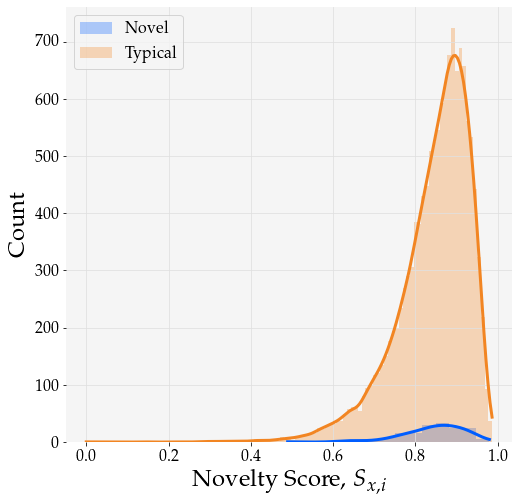

2021-05-24 18:59:59,284 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:59:59,285 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:59:59,285 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:59:59,285 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:59:59,286 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:59:59,286 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:59:59,287 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 18:59:59,288 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 18:59:59,288 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 18:59:59,288 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 

2021-05-24 18:59:59,326 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 18:59:59,326 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 18:59:59,327 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 18:59:59,328 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 18:59:59,328 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 18:59:59,328 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 18:59:59,329 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 18:59:59,329 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 18:59:59,329 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client i

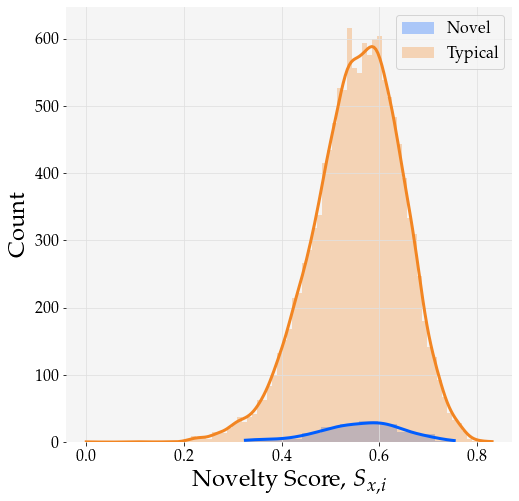

2021-05-24 19:00:00,741 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 19:00:00,742 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 19:00:00,742 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 19:00:00,742 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 19:00:00,743 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 19:00:00,743 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 19:00:00,744 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 19:00:00,744 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 19:00:00,744 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 19:00:00,745 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 

2021-05-24 19:00:00,778 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 19:00:00,779 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 19:00:00,780 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 19:00:00,780 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 19:00:00,781 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 19:00:00,781 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 19:00:00,781 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 19:00:00,781 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 19:00:00,782 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 19:00:00,782 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 19:

dict_keys(['SimpleVAE-nre1-nd', 'SimpleVAE-nre2-nd', 'BaselineAAE-nre1-nd', 'BaselineVAE-bing1-nd', 'BaselineAAE-bing1-nd'])


2021-05-24 19:00:00,796 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 19:00:00,797 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 19:00:00,797 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 19:00:00,798 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 19:00:00,799 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 19:00:00,800 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 19:00:00,801 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 19:00:00,801 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 19:00:00,801 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 19:00:00,802 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 

2021-05-24 19:00:00,844 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 19:00:00,845 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 19:00:00,845 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 19:00:00,846 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 19:00:00,846 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 19:00:00,846 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 19:00:00,847 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 19:00:00,847 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 19:00:00,847 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 19:00:00,847 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 19:

2021-05-24 19:00:00,884 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 19:00:00,884 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 19:00:00,885 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/80ebdd707c25a7c9dae65042bc3e9fd2.dvi
2021-05-24 19:00:00,885 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 19:00:00,886 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 19:00:00,887 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 19:00:00,887 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 19:00:00,888 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 19:00:00,888 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 19:00:00,889 - DEBUG - Textile font is not compatible with

2021-05-24 19:00:00,934 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 19:00:00,934 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 19:00:00,935 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 19:00:00,935 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 19:00:00,935 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/6134acbfb19d192b077a5db8a0594e2a.dvi
2021-05-24 19:00:00,936 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 19:00:00,937 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 19:00:00,937 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 19:00:00,938 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 19:00:00,939 - DEBUG - family: sans-serif, font: Computer Modern Sans Se

2021-05-24 19:00:01,107 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 19:00:01,107 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 19:00:01,108 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 19:00:01,108 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 19:00:01,108 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 19:00:01,108 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 19:00:01,109 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/c3ec0b22b0b6cb3f95e221e809e07549.dvi
2021-05-24 19:00:01,110 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 19:00:01,111 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 19:00:01,111 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24

2021-05-24 19:00:01,145 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 19:00:01,145 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 19:00:01,146 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 19:00:01,146 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 19:00:01,147 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 19:00:01,147 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 19:00:01,147 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 19:00:01,148 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 19:00:01,148 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 19:00:01,149 - DEBUG - Dvi._xxx: encountered special: papersize=5203.

2021-05-24 19:00:01,191 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 19:00:01,193 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 19:00:01,193 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 19:00:01,193 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 19:00:01,194 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 19:00:01,194 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 19:00:01,194 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 19:00:01,195 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 19:00:01,195 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 19:00:01,195 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 19:00:01,195 - DEBUG - fam

2021-05-24 19:00:01,249 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 19:00:01,250 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 19:00:01,250 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 19:00:01,251 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 19:00:01,252 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 19:00:01,253 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 19:00:01,254 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 19:00:01,255 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 19:00:01,255 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 19:00:01,255 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', 

2021-05-24 19:00:01,294 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 19:00:01,294 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 19:00:01,294 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 19:00:01,294 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/983a2a6b0b66424692d45994f6bb1f67.dvi
2021-05-24 19:00:01,295 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 19:00:01,296 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 19:00:01,297 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 19:00:01,297 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 19:00:01,298 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 19:00:01,299 - DEBUG - Apple Chancery font is not compat

2021-05-24 19:00:01,338 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 19:00:01,339 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 19:00:01,339 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 19:00:01,339 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 19:00:01,339 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 19:00:01,340 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 19:00:01,342 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 19:00:01,343 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 19:00:01,343 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 19:00:01,344 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-

2021-05-24 19:00:01,389 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 19:00:01,389 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 19:00:01,390 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 19:00:01,390 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 19:00:01,391 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 19:00:01,391 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 19:00:01,391 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 19:00:01,392 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/c2ad046775c699d06e76946f22922358.dvi
2021-05-24 19:00:01,392 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 19:00:01,394 - DEBUG - family: serif, font: Palatino, info

2021-05-24 19:00:01,439 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 19:00:01,439 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 19:00:01,440 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 19:00:01,440 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 19:00:01,440 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 19:00:01,441 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 19:00:01,441 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 19:00:01,442 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 19:00:01,442 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 19:00:01,442 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/8e78cbf20214890fa9d1cce476dcd9b0.dv

2021-05-24 19:00:01,526 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 19:00:01,527 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 19:00:01,527 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 19:00:01,527 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 19:00:01,528 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 19:00:01,528 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 19:00:01,528 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 19:00:01,529 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/c3ec0b22b0b6cb3f95e221e809e07549.dvi
2021-05-24 19:00:01,529 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 19:00:01,530 - DEBUG - family: serif, font: Palatino, info

2021-05-24 19:00:01,567 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 19:00:01,567 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 19:00:01,567 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 19:00:01,568 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 19:00:01,568 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 19:00:01,568 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 19:00:01,568 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 19:00:01,569 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 19:00:01,569 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 19:00:01,569 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dv

2021-05-24 19:00:01,602 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 19:00:01,602 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 19:00:01,602 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 19:00:01,603 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 19:00:01,603 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 19:00:01,604 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 19:00:01,605 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/d57805ca30df78f885241e6b3aa903c5.dvi
2021-05-24 19:00:01,605 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 19:00:01,606 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 19:00:01,607 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24

2021-05-24 19:00:01,644 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 19:00:01,644 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 19:00:01,644 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 19:00:01,645 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 19:00:01,645 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 19:00:01,645 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 19:00:01,645 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 19:00:01,646 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 19:00:01,646 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 19:00:01,646 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 

2021-05-24 19:00:01,685 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 19:00:01,686 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 19:00:01,687 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 19:00:01,687 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 19:00:01,687 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 19:00:01,688 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 19:00:01,688 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 19:00:01,689 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 19:00:01,689 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 19:00:01,690 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 19:00:01,691 - DEBUG - fam

2021-05-24 19:00:01,728 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 19:00:01,729 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 19:00:01,729 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 19:00:01,730 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 19:00:01,731 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 19:00:01,733 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 19:00:01,734 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 19:00:01,734 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 19:00:01,735 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 19:00:01,735 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', 

2021-05-24 19:00:01,773 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 19:00:01,774 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 19:00:01,774 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 19:00:01,774 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/607d7f8e4af1852682b6a5934ce86039.dvi
2021-05-24 19:00:01,775 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 19:00:01,777 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 19:00:01,777 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 19:00:01,778 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 19:00:01,778 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 19:00:01,779 - DEBUG - Apple Chancery font is not compat

2021-05-24 19:00:01,814 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 19:00:01,815 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 19:00:01,815 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 19:00:01,815 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 19:00:01,816 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 19:00:01,816 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 19:00:01,817 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 19:00:01,817 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 19:00:01,818 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 19:00:01,818 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/983a2a6b0b66424692d45994f6bb1f67.dv

2021-05-24 19:00:01,852 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 19:00:01,852 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 19:00:01,853 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 19:00:01,853 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 19:00:01,854 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 19:00:01,854 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 19:00:01,854 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 19:00:01,855 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 19:00:01,855 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 19:00:01,856 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 

2021-05-24 19:00:01,892 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 19:00:01,893 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 19:00:01,893 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/8e78cbf20214890fa9d1cce476dcd9b0.dvi
2021-05-24 19:00:01,894 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 19:00:01,895 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 19:00:01,895 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 19:00:01,896 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 19:00:01,896 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 19:00:01,896 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 19:00:01,896 - DEBUG - Textile font is not compatible with

2021-05-24 19:00:02,092 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 19:00:02,093 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 19:00:02,094 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 19:00:02,094 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 19:00:02,094 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 19:00:02,094 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 19:00:02,095 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 19:00:02,095 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 19:00:02,096 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 19:00:02,096 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 19:

2021-05-24 19:00:02,126 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 19:00:02,126 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 19:00:02,126 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/d276a205ffefd47add8bda20557c7c92.dvi
2021-05-24 19:00:02,127 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 19:00:02,128 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 19:00:02,129 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 19:00:02,129 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 19:00:02,129 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 19:00:02,130 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 19:00:02,130 - DEBUG - Textile font is not compatible with

2021-05-24 19:00:02,167 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 19:00:02,167 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 19:00:02,168 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 19:00:02,168 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 19:00:02,168 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 19:00:02,169 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 19:00:02,169 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 19:00:02,169 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 19:00:02,169 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 19:00:02,170 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 

2021-05-24 19:00:02,207 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 19:00:02,208 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 19:00:02,208 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 19:00:02,208 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 19:00:02,209 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 19:00:02,210 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 19:00:02,210 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 19:00:02,210 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 19:00:02,211 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 19:00:02,211 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 

2021-05-24 19:00:02,253 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 19:00:02,253 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 19:00:02,254 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 19:00:02,254 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 19:00:02,254 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 19:00:02,255 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 19:00:02,255 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/2f554728ce2be6dc9209a89cf3eb6c0d.dvi
2021-05-24 19:00:02,256 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 19:00:02,257 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 19:00:02,257 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24

2021-05-24 19:00:02,292 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 19:00:02,292 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 19:00:02,294 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 19:00:02,294 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 19:00:02,295 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 19:00:02,295 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 19:00:02,296 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 19:00:02,296 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 19:00:02,298 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 19:00:02,299 - DEBUG - Dvi._xxx: encountered special: papersize=5203.

2021-05-24 19:00:02,334 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 19:00:02,334 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 19:00:02,335 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 19:00:02,335 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 19:00:02,335 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 19:00:02,335 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 19:00:02,336 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 19:00:02,336 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 19:00:02,336 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 19:00:02,337 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 

2021-05-24 19:00:02,376 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 19:00:02,376 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 19:00:02,377 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 19:00:02,377 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 19:00:02,378 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 19:00:02,378 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 19:00:02,378 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 19:00:02,379 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 19:00:02,379 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 19:00:02,380 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 

2021-05-24 19:00:02,423 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 19:00:02,424 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 19:00:02,424 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 19:00:02,425 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 19:00:02,425 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 19:00:02,425 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 19:00:02,426 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 19:00:02,427 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 19:00:02,427 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 19:00:02,427 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 19:00:02,427 - DEBUG - fam

2021-05-24 19:00:02,467 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 19:00:02,467 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 19:00:02,467 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 19:00:02,468 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 19:00:02,469 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 19:00:02,469 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 19:00:02,470 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 19:00:02,470 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 19:00:02,470 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 19:00:02,471 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/8e78cbf20214890fa9d1cce476dcd9b0.dv

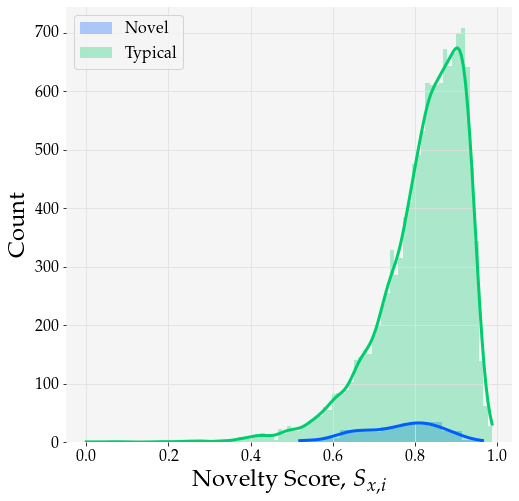

2021-05-24 19:00:02,712 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 19:00:02,713 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 19:00:02,713 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 19:00:02,714 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 19:00:02,714 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 19:00:02,714 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 19:00:02,715 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 19:00:02,715 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 19:00:02,715 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 19:00:02,716 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 

2021-05-24 19:00:02,751 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 19:00:02,752 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 19:00:02,752 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 19:00:02,753 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 19:00:02,753 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 19:00:02,753 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 19:00:02,754 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 19:00:02,754 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 19:00:02,754 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 19:00:02,755 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 19:

dict_keys(['SimpleVAE-nre1-nd', 'SimpleVAE-nre2-nd', 'BaselineAAE-nre1-nd', 'BaselineVAE-bing1-nd', 'BaselineAAE-bing1-nd'])


2021-05-24 19:00:02,760 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 19:00:02,760 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 19:00:02,761 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 19:00:02,761 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 19:00:02,761 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 19:00:02,762 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 19:00:02,763 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 19:00:02,764 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 19:00:02,764 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 19:00:02,765 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-

2021-05-24 19:00:02,817 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 19:00:02,818 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 19:00:02,818 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 19:00:02,819 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 19:00:02,820 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 19:00:02,821 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 19:00:02,821 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 19:00:02,821 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e33d6e46c120caff2604b893a09d1332.dvi
2021-05-24 19:00:02,823 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 19:00:02,826 - DEBUG - family: serif, font: Palatino, info

2021-05-24 19:00:04,278 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 19:00:04,278 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 19:00:04,279 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 19:00:04,279 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 19:00:04,280 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 19:00:04,280 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 19:00:04,281 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 19:00:04,281 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 19:00:04,282 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 19:00:04,284 - DEBUG - Textile font is not compatible with

dict_keys(['SimpleVAE-nre1-nd', 'SimpleVAE-nre2-nd', 'BaselineAAE-nre1-nd', 'BaselineVAE-bing1-nd', 'BaselineAAE-bing1-nd'])


2021-05-24 19:00:04,291 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 19:00:04,292 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 19:00:04,292 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 19:00:04,293 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 19:00:04,293 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 19:00:04,294 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 19:00:04,294 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 19:00:04,294 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 19:00:04,295 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 19:00:04,295 - DEBUG - Apple Chancery font is not compat

2021-05-24 19:00:04,329 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 19:00:04,329 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 19:00:04,330 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 19:00:04,330 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 19:00:04,330 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 19:00:04,331 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/35fc8a5d7b792fb5dcda0900f8005783.dvi
2021-05-24 19:00:04,332 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 19:00:04,334 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 19:00:04,334 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 19:00:04,334 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-

2021-05-24 19:00:04,382 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 19:00:04,383 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 19:00:04,383 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 19:00:04,384 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 19:00:04,384 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 19:00:04,384 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 19:00:04,385 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 19:00:04,385 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 19:00:04,386 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 19:00:04,386 - DEBUG - family: serif, font: Palatino, info

2021-05-24 19:00:04,424 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 19:00:04,425 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 19:00:04,425 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 19:00:04,425 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 19:00:04,426 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 19:00:04,426 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 19:00:04,427 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 19:00:04,427 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 19:00:04,427 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 19:00:04,428 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/80ebdd707c25a7c9dae65042bc3e9fd2.dv

2021-05-24 19:00:04,468 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 19:00:04,474 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 19:00:04,475 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 19:00:04,475 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 19:00:04,475 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 19:00:04,476 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 19:00:04,476 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 19:00:04,477 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 19:00:04,478 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 19:00:04,478 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 19:00:04,478 - DEBUG - fam

2021-05-24 19:00:04,726 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 19:00:04,726 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 19:00:04,727 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 19:00:04,728 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 19:00:04,728 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 19:00:04,728 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 19:00:04,729 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 19:00:04,729 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 19:00:04,729 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 19:00:04,730 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', 

2021-05-24 19:00:04,762 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 19:00:04,762 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 19:00:04,763 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 19:00:04,763 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/d276a205ffefd47add8bda20557c7c92.dvi
2021-05-24 19:00:04,764 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 19:00:04,765 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 19:00:04,765 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 19:00:04,765 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 19:00:04,766 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 19:00:04,766 - DEBUG - Apple Chancery font is not compat

2021-05-24 19:00:04,811 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 19:00:04,811 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 19:00:04,812 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 19:00:04,813 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 19:00:04,814 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 19:00:04,815 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 19:00:04,815 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/da12be043bf66fa494ffe6a28495e74d.dvi
2021-05-24 19:00:04,816 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 19:00:04,818 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 19:00:04,819 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24

2021-05-24 19:00:04,864 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 19:00:04,864 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 19:00:04,864 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 19:00:04,865 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 19:00:04,865 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 19:00:04,865 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 19:00:04,865 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 19:00:04,867 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 19:00:04,867 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 19:00:04,867 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dv

2021-05-24 19:00:04,901 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 19:00:04,902 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 19:00:04,902 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 19:00:04,903 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 19:00:04,903 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 19:00:04,903 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 19:00:04,904 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 19:00:04,904 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 19:00:04,905 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 19:00:04,905 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 19:00:04,905 - DEBUG - fam

2021-05-24 19:00:04,942 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 19:00:04,943 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/681f96a2424d9e6ece162e15d6c6b491.dvi
2021-05-24 19:00:04,945 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 19:00:04,946 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 19:00:04,946 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 19:00:04,947 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 19:00:04,947 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 19:00:04,947 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 19:00:04,948 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 19:00:04,948 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', 

2021-05-24 19:00:04,990 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 19:00:04,990 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 19:00:04,991 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 19:00:04,991 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/80ebdd707c25a7c9dae65042bc3e9fd2.dvi
2021-05-24 19:00:04,992 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 19:00:04,994 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 19:00:04,995 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 19:00:04,995 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 19:00:04,995 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 19:00:04,996 - DEBUG - Apple Chancery font is not compat

2021-05-24 19:00:05,037 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 19:00:05,037 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 19:00:05,037 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 19:00:05,038 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 19:00:05,040 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 19:00:05,041 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 19:00:05,042 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 19:00:05,045 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 19:00:05,045 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 19:00:05,045 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-

2021-05-24 19:00:05,153 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 19:00:05,154 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 19:00:05,154 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 19:00:05,154 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 19:00:05,155 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 19:00:05,156 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 19:00:05,156 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 19:00:05,156 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 19:00:05,157 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 19:00:05,157 - DEBUG - Apple Chancery font is not compat

2021-05-24 19:00:05,189 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 19:00:05,189 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 19:00:05,190 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 19:00:05,190 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 19:00:05,190 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 19:00:05,191 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/d276a205ffefd47add8bda20557c7c92.dvi
2021-05-24 19:00:05,192 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 19:00:05,193 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 19:00:05,193 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 19:00:05,193 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-

2021-05-24 19:00:05,228 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 19:00:05,229 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 19:00:05,229 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 19:00:05,229 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 19:00:05,230 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 19:00:05,230 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 19:00:05,230 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 19:00:05,231 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 19:00:05,231 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 19:00:05,231 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 

2021-05-24 19:00:05,267 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 19:00:05,269 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 19:00:05,269 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 19:00:05,269 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 19:00:05,270 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 19:00:05,270 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 19:00:05,271 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 19:00:05,271 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 19:00:05,271 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 19:00:05,271 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 19:00:05,272 - DEBUG - fam

2021-05-24 19:00:05,319 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 19:00:05,319 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 19:00:05,319 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 19:00:05,320 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 19:00:05,320 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 19:00:05,321 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 19:00:05,321 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 19:00:05,321 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 19:00:05,321 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 19:00:05,322 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/2f554728ce2be6dc9209a89cf3eb6c0d.dv

2021-05-24 19:00:05,362 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 19:00:05,363 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 19:00:05,364 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 19:00:05,364 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 19:00:05,364 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 19:00:05,365 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 19:00:05,365 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 19:00:05,365 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 19:00:05,366 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 19:00:05,366 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 19:00:05,366 - DEBUG - fam

2021-05-24 19:00:05,403 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 19:00:05,404 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 19:00:05,405 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 19:00:05,405 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 19:00:05,406 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 19:00:05,406 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 19:00:05,406 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 19:00:05,407 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 19:00:05,407 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 19:00:05,408 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', 

2021-05-24 19:00:05,451 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 19:00:05,451 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 19:00:05,452 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 19:00:05,452 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 19:00:05,453 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 19:00:05,453 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 19:00:05,453 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 19:00:05,453 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 19:00:05,454 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 19:00:05,454 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 

2021-05-24 19:00:05,492 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 19:00:05,492 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 19:00:05,493 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/681f96a2424d9e6ece162e15d6c6b491.dvi
2021-05-24 19:00:05,493 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 19:00:05,496 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 19:00:05,497 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 19:00:05,497 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 19:00:05,497 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 19:00:05,498 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 19:00:05,498 - DEBUG - Textile font is not compatible with

2021-05-24 19:00:05,538 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 19:00:05,538 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 19:00:05,539 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 19:00:05,539 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 19:00:05,540 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 19:00:05,540 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 19:00:05,541 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 19:00:05,542 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 19:00:05,542 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 19:00:05,542 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 19:

2021-05-24 19:00:05,823 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 19:00:05,823 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 19:00:05,824 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 19:00:05,824 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 19:00:05,825 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 19:00:05,825 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 19:00:05,825 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 19:00:05,826 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 19:00:05,826 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 19:00:05,826 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 

2021-05-24 19:00:05,858 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 19:00:05,859 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 19:00:05,860 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 19:00:05,860 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 19:00:05,861 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 19:00:05,863 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 19:00:05,863 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 19:00:05,864 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 19:00:05,864 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 19:00:05,865 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 19:

2021-05-24 19:00:05,902 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/c3ec0b22b0b6cb3f95e221e809e07549.dvi
2021-05-24 19:00:05,902 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 19:00:05,904 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 19:00:05,904 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 19:00:05,904 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 19:00:05,905 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 19:00:05,905 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 19:00:05,905 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 19:00:05,905 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 19:00:05,906 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 19:

2021-05-24 19:00:05,943 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 19:00:05,943 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 19:00:05,944 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 19:00:05,944 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 19:00:05,944 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 19:00:05,945 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 19:00:05,946 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/35fc8a5d7b792fb5dcda0900f8005783.dvi
2021-05-24 19:00:05,947 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 19:00:05,948 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 19:00:05,949 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24

2021-05-24 19:00:05,986 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 19:00:05,987 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 19:00:05,987 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 19:00:05,987 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 19:00:05,988 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 19:00:05,988 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 19:00:05,989 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 19:00:05,989 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 19:00:05,989 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 19:00:05,990 - DEBUG - Apple Chancery font is not compat

2021-05-24 19:00:06,030 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 19:00:06,030 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 19:00:06,031 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 19:00:06,031 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 19:00:06,031 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 19:00:06,032 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/983a2a6b0b66424692d45994f6bb1f67.dvi
2021-05-24 19:00:06,033 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 19:00:06,034 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 19:00:06,034 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 19:00:06,035 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-

2021-05-24 19:00:06,074 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 19:00:06,074 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 19:00:06,075 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 19:00:06,075 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 19:00:06,075 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 19:00:06,076 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 19:00:06,076 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 19:00:06,076 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 19:00:06,080 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 19:00:06,081 - DEBUG - family: serif, font: Palatino, info

2021-05-24 19:00:06,119 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 19:00:06,120 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 19:00:06,120 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 19:00:06,120 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/25c1b725f827a8629238f3775925c694.dvi
2021-05-24 19:00:06,122 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 19:00:06,123 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 19:00:06,124 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 19:00:06,124 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 19:00:06,124 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 19:00:06,125 - DEBUG - Apple Chancery font is not compat

2021-05-24 19:00:06,161 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24 19:00:06,161 - DEBUG - Bitstream Vera Sans font is not compatible with usetex.
2021-05-24 19:00:06,161 - DEBUG - family: sans-serif, font: Computer Modern Sans Serif, info: ('cmss', '\\usepackage{type1ec}')
2021-05-24 19:00:06,162 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 19:00:06,162 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 19:00:06,163 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 19:00:06,163 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 19:00:06,163 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 19:00:06,164 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 19:00:06,164 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/681f96a2424d9e6ece162e15d6c6b491.dv

2021-05-24 19:00:06,200 - DEBUG - Apple Chancery font is not compatible with usetex.
2021-05-24 19:00:06,201 - DEBUG - Textile font is not compatible with usetex.
2021-05-24 19:00:06,201 - DEBUG - family: cursive, font: Zapf Chancery, info: ('pzc', '\\usepackage{chancery}')
2021-05-24 19:00:06,202 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 19:00:06,202 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 19:00:06,203 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 19:00:06,203 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/e15246af0c1a15790a6dd2b844e9ce83.dvi
2021-05-24 19:00:06,204 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt
2021-05-24 19:00:06,205 - DEBUG - family: serif, font: Palatino, info: ('ppl', '\\usepackage{mathpazo}')
2021-05-24 19:00:06,205 - DEBUG - DejaVu Sans font is not compatible with usetex.
2021-05-24

2021-05-24 19:00:06,269 - DEBUG - DejaVu Sans Mono font is not compatible with usetex.
2021-05-24 19:00:06,269 - DEBUG - Bitstream Vera Sans Mono font is not compatible with usetex.
2021-05-24 19:00:06,269 - DEBUG - family: monospace, font: Computer Modern Typewriter, info: ('cmtt', '\\usepackage{type1ec}')
2021-05-24 19:00:06,270 - DEBUG - Dvi: /home/brahste/.cache/matplotlib/tex.cache/529bfac556d34e70e638742a816d5538.dvi
2021-05-24 19:00:06,270 - DEBUG - Dvi._xxx: encountered special: papersize=5203.43999pt,5203.43999pt


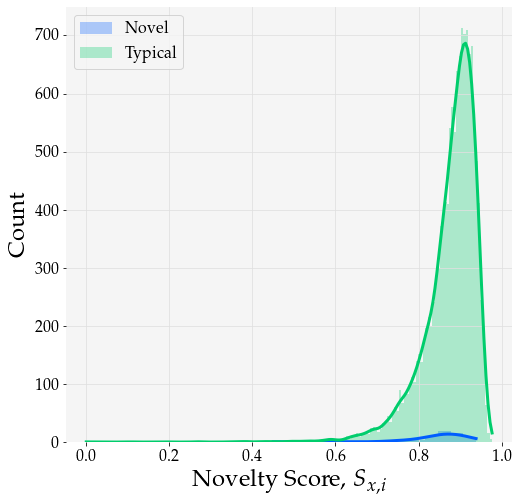

In [39]:
def score_density_vis_lt(lt_scores,labels, sn, color='C1'):
    
    labels = np.array(labels).astype(bool)

    
    fig, ax = plt.subplots(figsize=(8, 8))
    sns.histplot(data=lt_scores[labels], label='Novel', color='C5', fill=True, lw=0, alpha=0.3, kde=True)
    sns.histplot(data=lt_scores[~labels], label='Typical', color=color, fill=True, lw=0, alpha=0.3, kde=True)
    ax.set_xlabel('Novelty Score, $S_{x,i}$')
    plt.legend()
    plt.savefig(f'LatentScoreDensity-{sn}-CuriosityMastcam.pdf', format='pdf', bbox_inches='tight')
    plt.show()

for sn, res in lt_results.items():
    print(latent_scores_catalog.keys())
            
    lt_scores = latent_scores_catalog[f'{sn}-nd']
    lt_scores = np.array(lt_scores)
    
    # Scale novelty scores between 0,1, though it doesn't really matter
    lt_scores /= np.max(np.abs(lt_scores))
    lt_scores += 1
    if 'AAE' in sn:
        color = 'C1'
    elif 'VAE' in sn:
        color='C6'
    score_density_vis_lt(lt_scores, res['labels'], sn, color=color)